### Objective:
- Step 1. find and remove the easter eggs (hotel reviews)
- Step 2. categorize the reviews into 20 categories, and sort by popularity
- Step 3. derive insights & formulate reccommendations to improve customer experience
    - (find patterns & trends, develop business strategies to improve customer experience)

### Step 1. Remove easter eggs

In [1]:
import os 
import time
import pickle

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors
import matplotlib.patches as mpatches
import seaborn as sns

In [2]:
# settings
# -------------------------------------------------------------------------
# -------------------------------------------------------------------------


work_dir  = '/home/chad/Desktop/embedding'
scotia_data_path = '/home/chad/Desktop/scotia/Team Alpha/Winter 2024 Scotia DSD Data Set.xlsx'

In [3]:
# import data - Read the Excel file
# -------------------------------------------------------------------------
# -------------------------------------------------------------------------


df = pd.read_excel(scotia_data_path)
df.head()

texts = list(df['Review'])

# split the data into batches, get the indices of the batches 
_batch_size   = 1
_len          = len(texts)
_list         = list(range(0, _len, _batch_size)) + [_len]
_pages        = list(zip(_list[:-1], _list[1:]))

embedding_file_name = os.path.join(work_dir, 'embeddings.pkl')
tsne_file_name = os.path.join(work_dir, 'tsne.pkl')
topic_centroids_file_name = os.path.join(work_dir, f'topic_centroids.pkl')
sample_embeddings_file_name = os.path.join(work_dir, f'sample_embeddings.pkl')

### Instructor Embeddings
The embeddings were created using Instructor-xl. It requires a GPU. I already did it and saved it as a pickle file, so you can just load the pickle file.

In [4]:
# InstructorEmbedding
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------


# from InstructorEmbedding import INSTRUCTOR
# model = INSTRUCTOR('hkunlp/instructor-xl', device='cuda')

# _instr = 'Represent the sentence for classification:'

# embeddings = np.zeros([_len, 768])
# for i in range(len(_pages)):
#     _page = _pages[i]
#     batch = texts[_page[0]:_page[1]]
#     pairs = [[_instr, b.strip().replace('\n', ' ')] for b in batch]

#     # calculate embeddings
#     embeddings[_page[0]:_page[1]] = model.encode(pairs) 

#     # model.encode( sentences,
#     #               batch_size: int = 32,
#     #               show_progress_bar: bool = None,
#     #               output_value: str = 'sentence_embedding',
#     #               convert_to_numpy: bool = True,
#     #               convert_to_tensor: bool = False,
#     #               device: str = None,
#     #               normalize_embeddings: bool = False)

# # # save the embeddings
# # with open(embedding_file_name, 'wb') as f:
# #     pickle.dump(embeddings, f)

In [5]:
# load embeddings
with open(embedding_file_name, 'rb') as f:
    embeddings = pickle.load(f)

    # normalize embeddings, so we can compute cosine similarity using dot product (faster)
    _norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    embeddings = embeddings / _norms

### Visualization using t-SNE. 
Since the embeddings are vectors of size 768, we can use t-SNE to create a 2D plot that should retain the structural relationships from the higher dimensional space. This will allow us to spot clusters, if they exist. This takes a minute so I also saved the results in a pickle file. 

In [6]:
# Create a t-SNE model and transform the data
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------

# from sklearn.manifold import TSNE

# seed = 2
# tsne = TSNE(n_components=2, random_state=seed)
# vis_dims = tsne.fit_transform(embeddings)
# x = np.array([x for x,y in vis_dims])
# y = np.array([y for x,y in vis_dims])

In [7]:
# save the t-SNE projection
# with open(tsne_file_name, 'wb') as f:
#     pickle.dump((x,y), f)
with open(tsne_file_name, 'rb') as f:
    x, y = pickle.load(f)

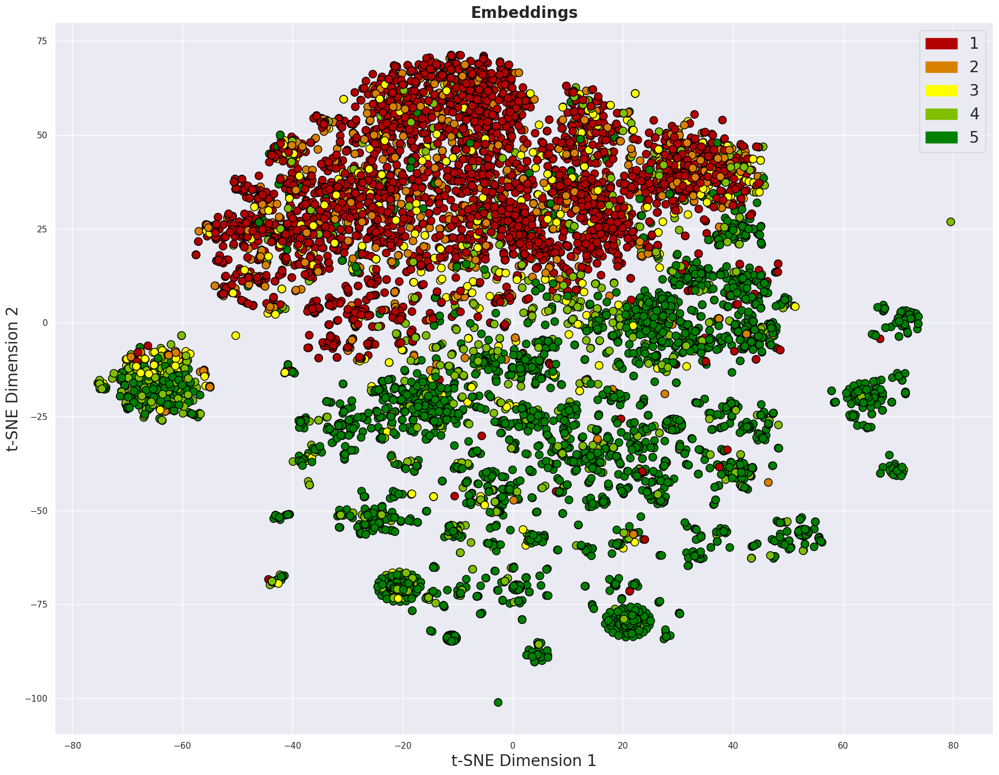

In [8]:
# plot
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------


def generate_colors(n, colors=[(.7, 0, 0), (1, 1, 0), (0, .5, 0)]):
    """Generate n colors interpolating through the colors list."""
    segment_length = n // (len(colors) - 1)
    extended_colors = []

    for i in range(len(colors) - 1):
        start_color = colors[i]
        end_color = colors[i + 1]
        # Interpolate between two colors
        for j in range(segment_length + (n % (len(colors) - 1) if i == len(colors) - 2 else 0)):
            interpolated_color = tuple(np.linspace(start_color[k], end_color[k], segment_length + 1)[j] for k in range(3))
            extended_colors.append(interpolated_color)
    
    return extended_colors


def make_plot(
        df=df, 
        column_idx=2, 
        hlines=[], 
        vlines=[], 
        save=False, 
        alpha=1.0, 
        colorset='gnuplot2',
        categories = None,
        ):

    column_name = df.columns[column_idx]
    if categories is None: # provide custom order of categories for coloring
        categories = sorted(df[column_name].unique())

    # function that maps category_i -> i 
    
    for_map = {category: i for i, category in enumerate(categories)} # forward map
    rev_map = {i: category for i, category in enumerate(categories)} # reverse map

    color_indices = df[column_name].apply(lambda x: for_map[x])
    num_colors = len(set(color_indices))

    # gnuplot2
    # cubehelix
    # twilight
    if column_name == 'Rating':
        colors = generate_colors(num_colors)
    else:
        colors = plt.cm.get_cmap(colorset, num_colors)(range(num_colors))
        
    colormap = matplotlib.colors.ListedColormap(colors)

    # Create scatter plot
    sns.set()
    _ = plt.figure(figsize=(18, 14))
    scatter = plt.scatter(x, y, c=color_indices, cmap=colormap, alpha=alpha, edgecolor='black', s=100)

    # plot any horizontal or vertical lines 
    for hline in hlines:
        _ = plt.axhline(hline)
    for vline in vlines:
        _ = plt.axvline(vline)

    # Make the plot more informative
    _ = plt.xlabel('t-SNE Dimension 1', fontsize=20)
    _ = plt.ylabel('t-SNE Dimension 2', fontsize=20)
    _ = plt.title('Embeddings', fontsize=20, fontweight='bold')

    # Create a custom legend with patches
    patches = [mpatches.Patch(color=colors[i], label=rev_map[i]) for i in range(num_colors)]
    _ = plt.legend(handles=patches, loc='upper right', fontsize=20)

    if save:
        _ = plt.savefig(os.path.join(work_dir, f'plot.png'), bbox_inches='tight')  # Save as PNG

    plt.tight_layout()
    plt.show()


make_plot()

### The Fun Part 
We see clusters, but do they mean anything? It turns out yes. The encoder maps sentence vectors by their semantics, so if two reviews are similar semantically, they will be close in 768-dimensional space. And because t-SNE retains the structure of the space, the two reviews will also be close in 2D space.  

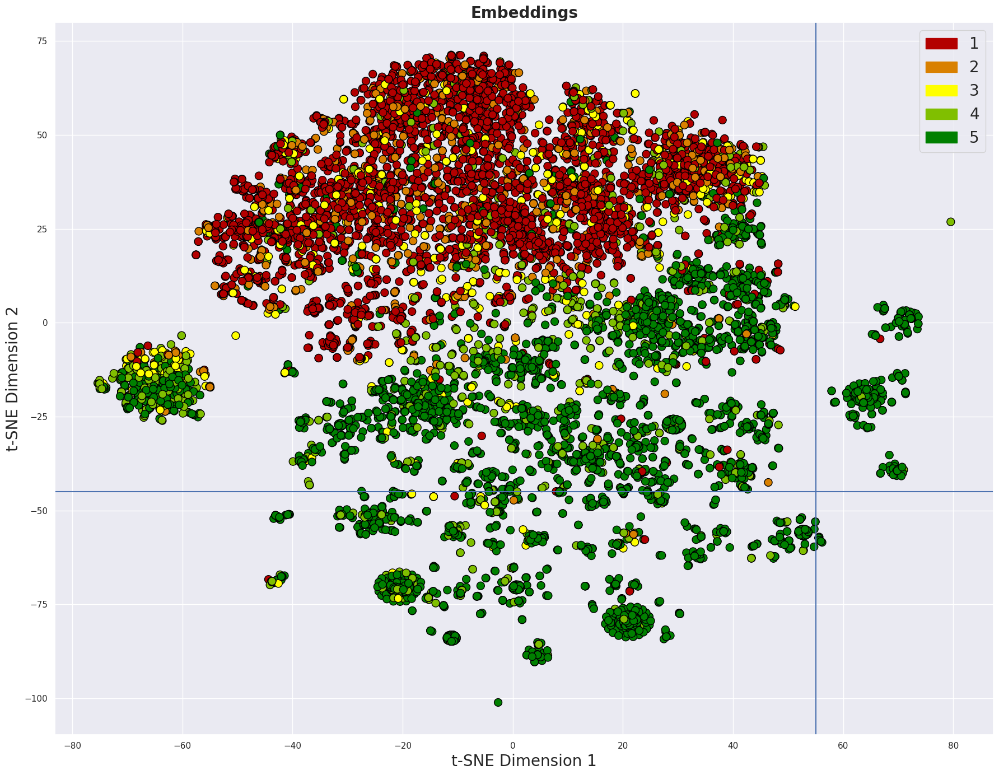

Excellent

Excelente

Excellent

Gr8 super excellent procedure

love it

I like it!

Love it.

Excellent thank you

Excelent

Excellent

Perfecttry designed

Excellent

excellent

Excellent

Excellent

Love it very efficient!

Love it so easy

Superb

Excellent

Extraordinarily outstanding

Excellent

Love it

Excellent

Love it

Exceptional

Excellent

Perfect!

Lovely kinda

Excellent

Excellent

Excellent

Excellent

Love it

Perfect!!

The perfect back for students

Excellent

Perfect

Excellent new version

excellent

I like it it's not a bad button layout I like everything so far!!

Loves it

Excellent

excellent

excellent

excellent

Excellent

Like

love it!

Excellent

Love it!

Excellent

exceptional

Excellent!

Great love that girl from the Dominican Republic!!!!

Love IIIIIIIIIIIIIIIIHT

Perfect

Excellent

Perfect for this pensioner!

Love how easy it is to use

Educational

Like it

Excellent

Perfect

Love it

Excellent

Excellent

excellent

Love it

Excellent 👍

Exce

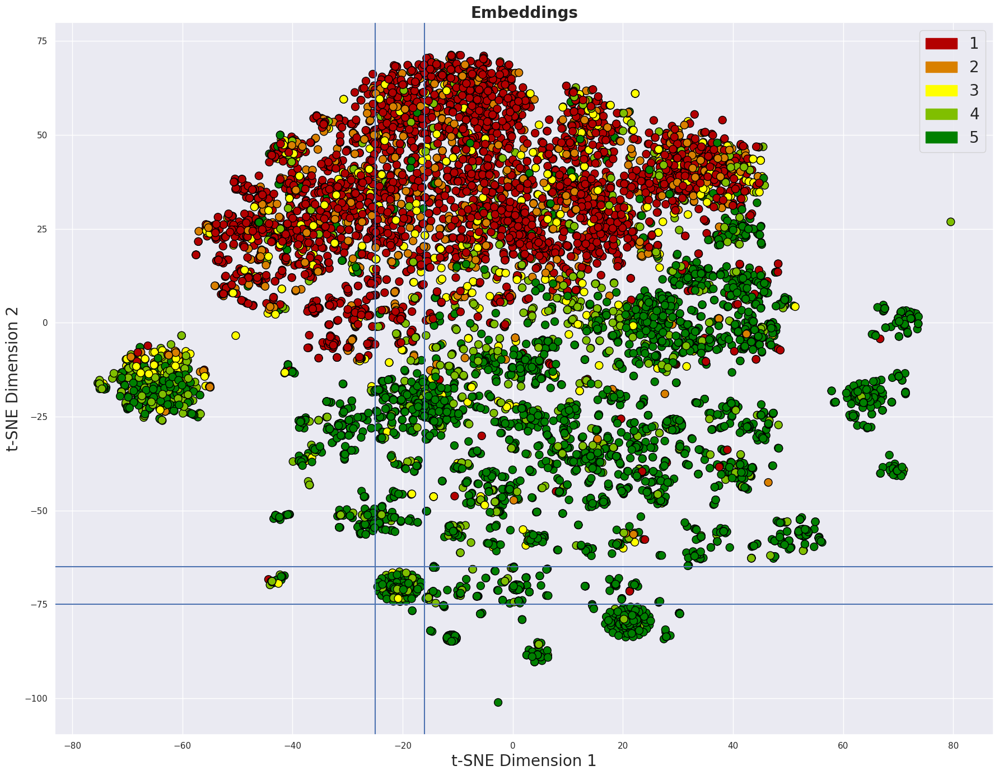

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good

Good



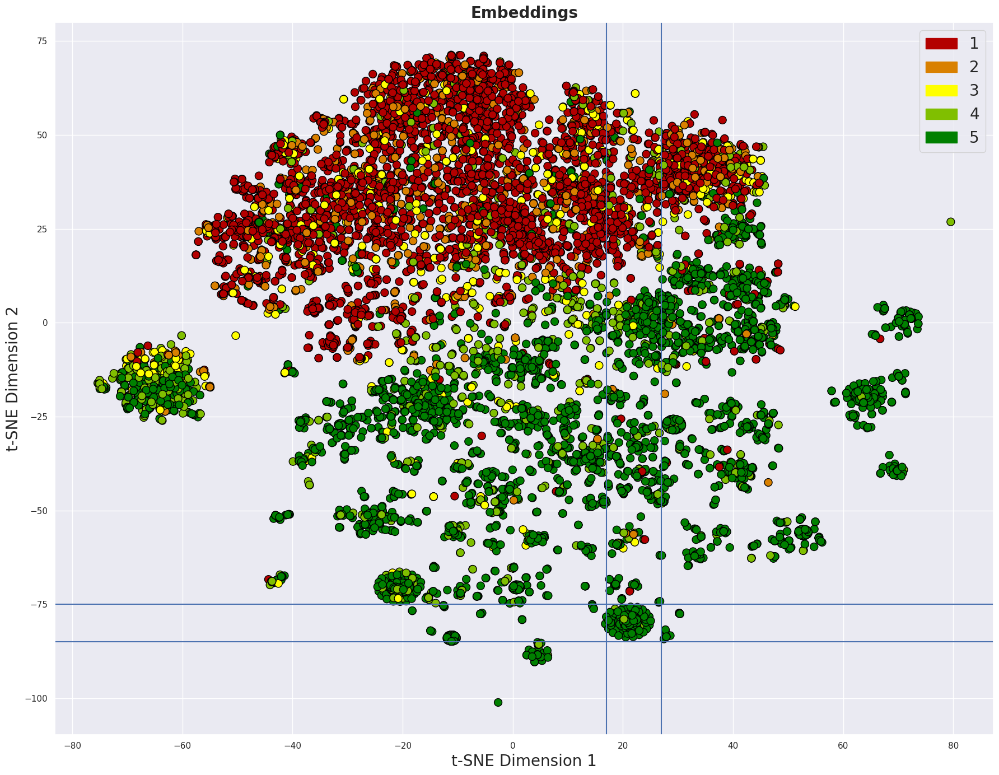

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great

Great



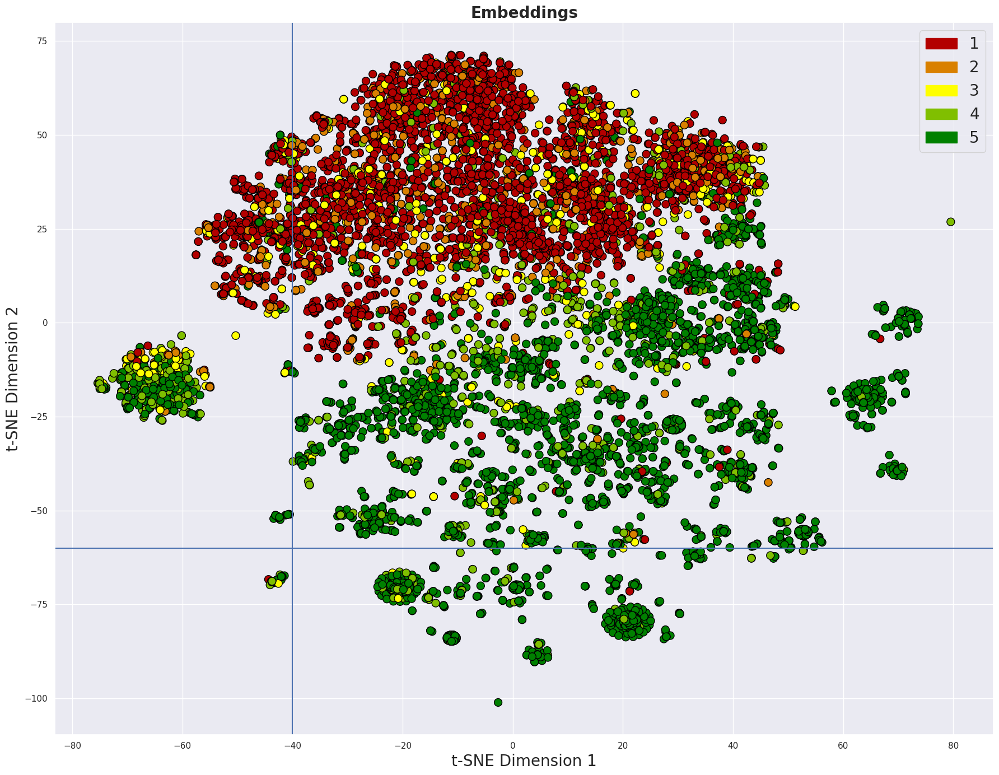

Okay

ok a

it's alright :)

Ok

okie

OK

Ok

okay

Okay I guess.

ok

Okay

ok for accounts

Okay

Okay

Ok, until it isnt

It's okay.

ok

Ok

Ok

ok

it's ok

Ok

It was ok

Ok

It's ok

okay

it's ok

ok

Ok

Oooh ok

it ok

Ok

Ok

Ok



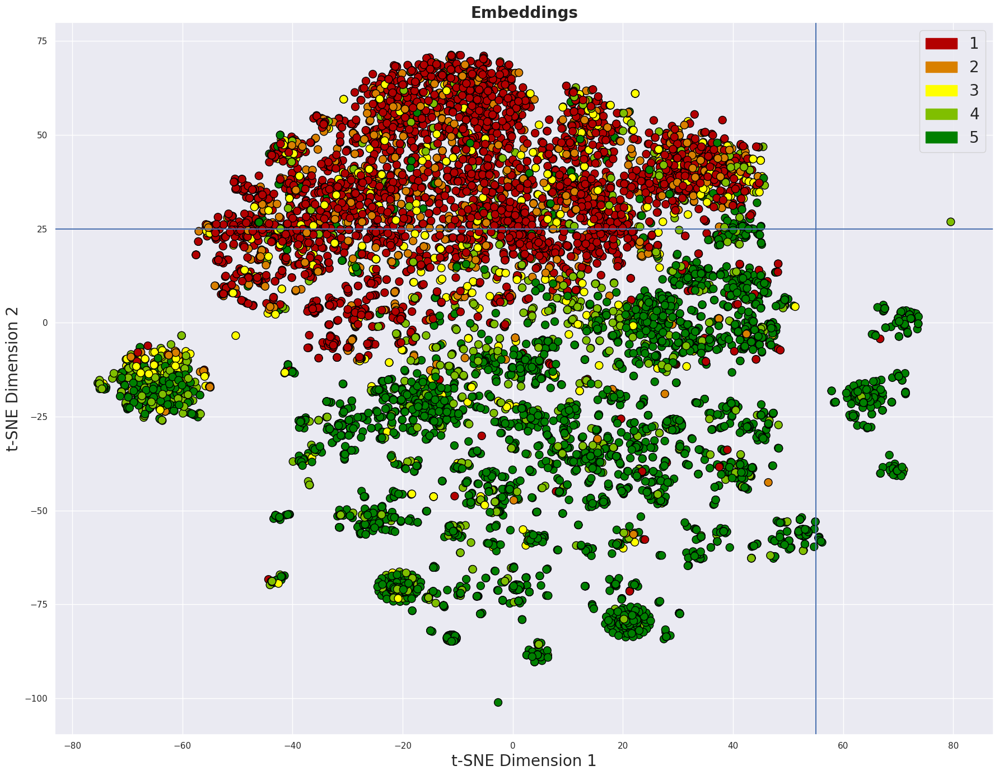

Good problems



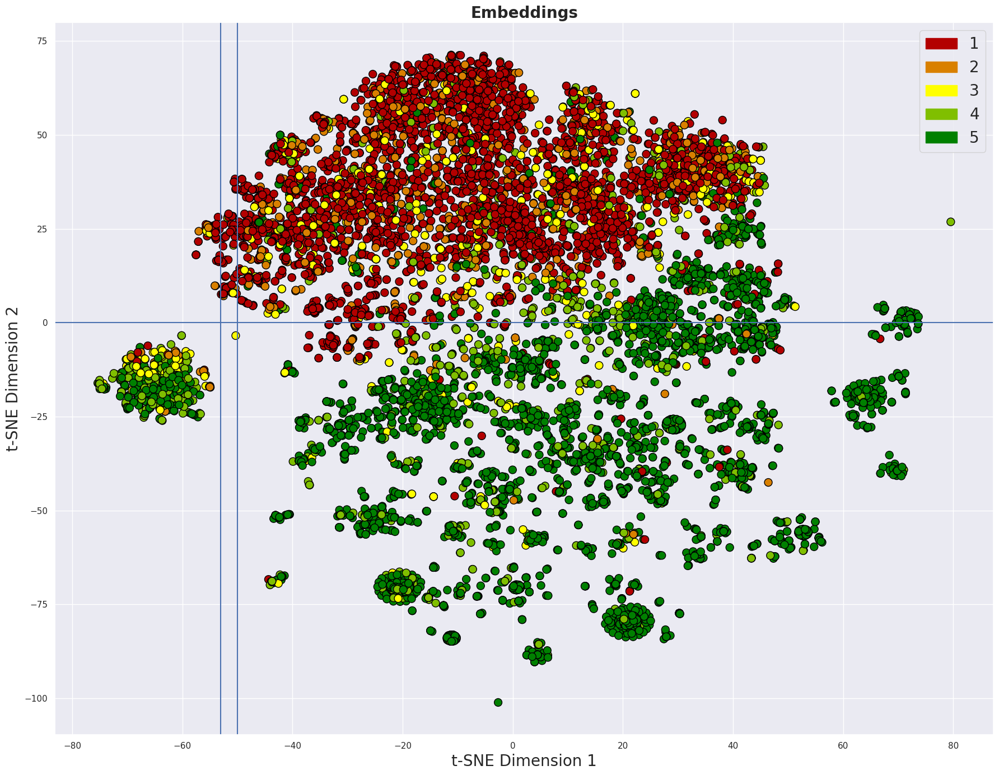

Its under construction alot



In [9]:
# checking out the clusters in the plot
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------


def show_reviews_in_subset(condition):
    indices = np.arange(_len)   # indices of the reviews 
    subset = indices[condition] # take a subset where the condition is met 
    for i in subset:
        review = df['Review'][i]
        print(review + "\n")


# short reviews
make_plot(hlines=[-45], vlines=[55]) 
condition = (y > -45) & (x > 55)
show_reviews_in_subset(condition)

# good
make_plot(hlines=[-75,-65], vlines=[-16,-25]) 
condition = (y > -75) & (y < -65) & (x < -16) & (x > -25)
show_reviews_in_subset(condition)

# great
make_plot(hlines=[-75, -85], vlines=[17, 27]) 
condition = (y < -75) & (y > -85) & (x > 17) & (x < 27)
show_reviews_in_subset(condition)

# Ok
make_plot(hlines=[-60], vlines=[-40]) 
condition = (y < -60) & (x < -40)  
show_reviews_in_subset(condition)

# "good problems"
make_plot(hlines=[25], vlines=[55]) 
condition = (y > 25) & (x > 55)
show_reviews_in_subset(condition)

# "under construction"
make_plot(hlines=[0], vlines=[-50,-53]) 
condition = (y < 0) & (x < -50) & (x > -53)
show_reviews_in_subset(condition)

### Hotel Reviews
In particular, one large cluster is all hotel reviews. We remove them. 

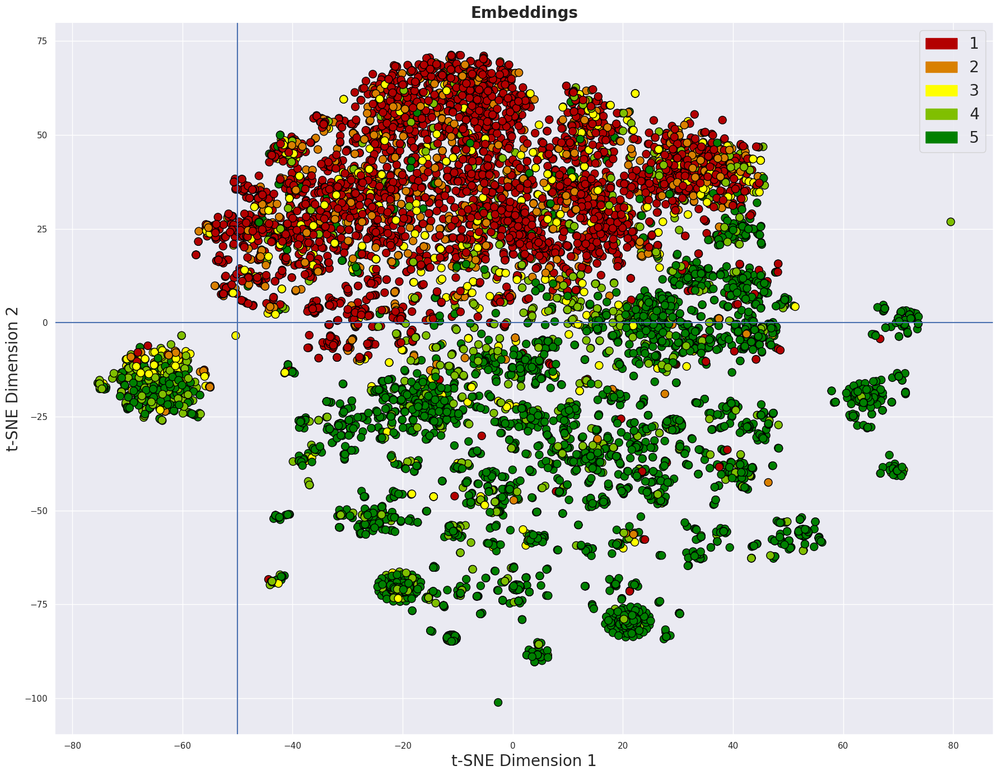

Very homie ! I stay every month and don't plan on ever changing. Plenty of food options walking distance.

Good value for the price thought that the breakfast could be a little more plentiful compared to other hotel breakfasts            

Older hotel, down town location which was inconvenient from the highway. Rooms were really clean, comfy beds but breakfast was limited for a hot breakfast.

when returning to the palm beach, dubai would not consider any other accomodation and willmseek other Holiday Innth,s when travelling

Very good facility.  Pleased with everything. Breakfast was really nice.  Location was very good near restaurants in the area.      

Various members of the staff went out of there way to make sure our request  during our four day stay.

The hotel was one of the nicer Days Inn I've been to.Comfy beds! The employees were very friendly!      

wonderful view of the Locks and perfect location to be able to walk to everything downtown. loved the price!

Very close to 

In [10]:
# hotel reviews 
make_plot(hlines=[0], vlines=[-50]) 
condition = (y < 0) & (x < -50)
show_reviews_in_subset(condition)

# remove hotel reviews
hotel_indices = np.arange(_len)[condition]

### Step 2. Categorize Reviews
We can use embeddings to categorize the reviews. We can say a review has topic X if it is close to other reviews of topic X. To accomplish this, we need some labeled data. One way to get labeled data is to use GPT-4 to generate realistic sample reviews for each topic. 

For each topic, we generate some sample reviews, embed them, and take their average. This will be the centroid of the topic. 

We then take individual Scotiabank mobile app reviews, embed them, and see which centroid they are closest to. This will determine their topic. 

In [12]:
# generating sample reviews by topic - then compare to scotia review by cosine similarity
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------

if True:

    gpt4_prompt = "Please output your answer in a Python list of strings. Please provide ten realistic, imperfect, sample reviews of a banking mobile app that talk about the following topic:"
    
    gpt4_prompt = "Please provide twenty realistic, imperfect, sample reviews of a banking mobile app that talk about the following topic. Please format your answer in a Python list of strings. "

    topic_names = [
        "2SV", 
        "Application Performance", 
        "Accessibility", 
        "Appointment Booking", 
        "Biometric Login", 
        "Budgeting", 
        "Chat", 
        "Cheque Deposit", 
        "Credit Score", 
        "Email Money Transfer", 
        "Errors", 
        "Fee", 
        "Info Alerts", 
        "International Money Movement", 
        "Investments", 
        "Login and Logout Issues", 
        "Quick Balance", 
        "Request New Card", 
        "Rewards", 
        "Save and Share Statements"
    ]

    topic_descriptions = [
        "Two-Step Verification is a security measure where a numerical code is sent to the customer's phone through the app before they can sign in to online banking.", 
        "Application Performance refers to how well the application performs in terms of speed and responsiveness, and whether there are any lags or delays.", 
        "Accessibility refers to the design of products, devices, services, or environments for people who experience disabilities. This includes feedback related to vision, hearing, cognitive abilities, and mobility.", 
        "Appointment Booking allows customers to request an appointment with an advisor through the app.", 
        "Biometric Login refers to the user's experience with logging into the app using biometric features, such as fingerprint authentication.", 
        "Budgeting is a feature that shows customers how they are tracking their spending and income. Customers may also discuss features like spending graphs.", 
        "Chat refers to customers discussing their experience with talking to a chatbot or having the option to chat with a live person.", 
        "Cheque Deposit is a feature that allows users to deposit a cheque using their phone through the app.", 
        "Credit Score refers to the customer's experience with the app's credit score feature.", 
        "Email Money Transfer enables users to transfer funds between personal accounts using email through the Scotiabank app.", 
        "An error, flaw, or fault in the design, development, or operation of the application that causes it to produce an incorrect or unexpected result, or to behave in an unintended way. Can include crashes or glitches.", 
        "Fees looks at comments associated with banking fees and how they impact the customer experience with the app.", 
        "Info Alerts are app notifications that inform customers about important activities occurring on their accounts.", 
        "International Money Movement refers to the user's experience with transferring money internationally, such as using international money transfer services or Western Union.", 
        "Investments refers to customers discussing investment accounts like GIC (Guaranteed Investment Certificate), RRSP (Registered Retirement Savings Plan), and other investment options.", 
        "Login and Logout Issues refer to the user's experience with logging in and out of the application.", 
        "Quick Balance is a feature that allows customers to check their account balances without having to sign into the app.", 
        "Request New Card is a feature in the app that allows customers to request a replacement card if their original card is lost or stolen.", 
        "Rewards refer to the customer's experience with the app's rewards feature, which shows them their SCENE+ points or other loyalty program related features.", 
        "Save and Share Statements refers to the customer's experience with saving and sharing transaction statements or other types of statements from the application."
    ]

    sample_reviews = [

        # 2SV
        [
            "The 2SV feature adds an extra layer of security, which is great. However, sometimes the code takes too long to arrive, causing delays in accessing my account.",
            "I appreciate the security that the two-step verification provides, but I wish there was an option to remember trusted devices so I don't have to do it every time.",
            "Two-Step Verification is a must for online banking, and this app does it well. The only issue is the app sometimes crashes after entering the code.",
            "The numerical code for 2SV sometimes fails to send, which is frustrating. When it works, it's seamless and quick, but reliability needs improvement.",
            "Great security feature with the 2SV, but it would be better if the app allowed the use of third-party authenticators as an option.",
            "I find the 2SV process a bit tedious, especially when I'm in a hurry. Maybe add a feature to expedite the process for frequent logins from the same device?",
            "Love the extra security with the two-step verification. However, the app doesn't always send the code on the first try, which can be annoying.",
            "Two-Step Verification works, but the interface could be more user-friendly. Instructions on setting it up were not very clear for less tech-savvy users.",
            "The app's 2SV is reliable, but I've experienced a few instances where the code was delayed by several minutes, making it a bit inconvenient.",
            "Overall, the two-step verification is a solid security feature. However, the app could use some optimization to make the process smoother and faster.",
            "Love the security the two-step verification adds, but it sometimes takes a while for the code to arrive.",
            "Two-step verification is a hassle. It should be optional, not mandatory. Makes quick logins impossible.",
            "Great for security, but the app doesn't remember devices. I have to verify every time, which is annoying.",
            "Received the verification code promptly. Easy to use and adds a layer of security. Good job!",
            "The concept of two-step verification is good, but the execution here is poor. The app often crashes after sending the code.",
            "Very secure, but what if I lose my phone? There should be an alternative way to verify.",
            "I appreciate the extra security measure, but it would be better if the app allowed the use of a security key.",
            "Two-step verification works seamlessly for me. A small step for much better security.",
            "The verification codes sometimes arrive late, making the login process longer than necessary.",
            "Good security feature, but it's annoying when I'm in a hurry and have to wait for a code.",
            "Perfect for keeping my account secure. Haven't had any issues with receiving codes.",
            "I understand the need for security, but this two-step process is overkill for everyday banking.",
            "Works well most of the time, but I've had a few instances where the code didn't work.",
            "Two-step verification adds peace of mind. The codes arrive quickly and the process is straightforward.",
            "It's a decent security feature, but I wish there were options for authentication methods other than SMS.",
            "The two-step verification is reliable but sometimes the SMS takes too long to arrive.",
            "I like the added security, but it's frustrating when the app doesn't send the code and I can't access my account.",
            "Solid security feature. It's a bit of a hassle, but worth it for the added protection.",
            "Two-step verification is usually smooth, but there have been a few times when it's been a roadblock to accessing my account.",
            "The security is great, but the app could use some improvement to make the process faster and more reliable.",
            "Two-Step Verification is a great security feature, but the app often takes too long to send the code.",
            "I appreciate the added security with Two-Step Verification, but sometimes it's a hassle when I'm in a hurry.",
            "Two-Step Verification gives me peace of mind, but I wish there was an option for biometric authentication instead of codes.",
            "The app's Two-Step Verification is a lifesaver for security-conscious users like me. I wouldn't use the app without it.",
            "I like the extra layer of protection Two-Step Verification provides, but I've had issues receiving the codes during peak hours.",
            "Two-Step Verification is essential these days, but the app's notification system for the codes needs improvement.",
            "The app's Two-Step Verification adds an extra layer of security, but it's frustrating when the codes don't arrive promptly.",
            "I love the added security of Two-Step Verification, but I wish there was an option to remember my device for a longer period.",
            "Two-Step Verification is a must-have, but the app could make the process smoother by adding a 'Remember This Device' feature.",
            "I feel more secure with Two-Step Verification, but I've encountered issues where the code didn't arrive at all.",
            "The app's Two-Step Verification is effective, but the user interface for entering the codes could be more user-friendly.",
            "I appreciate the security of Two-Step Verification, but sometimes I struggle to type in the code quickly enough before it expires.",
            "Two-Step Verification is a necessary inconvenience, but I wish there were alternative methods like email verification.",
            "The app's Two-Step Verification keeps my account safe, but I've had instances where it required multiple code entries.",
            "I like Two-Step Verification, but the app should offer more customization options for the frequency of code requests.",
            "Two-Step Verification is a solid security feature, but I wish there was a way to authenticate without an internet connection.",
            "The app's Two-Step Verification works well, but the process could be smoother if it integrated with my device's biometrics.",
            "I appreciate the added security of Two-Step Verification, but the constant code requests can be annoying for daily users.",
            "Two-Step Verification adds a layer of security, but I've experienced delays in receiving codes during peak traffic times.",
            "The app's Two-Step Verification is a necessary evil, but it's frustrating when the code arrives too late for a quick login.",
            "Two-Step Verification adds a layer of security, but it's annoying to wait for the code every time I log in.",
            "I appreciate the added security with Two-Step Verification, but sometimes the code delivery is slow, causing login delays.",
            "The Two-Step Verification is a great feature, but occasionally I face issues receiving the code on my phone.",
            "I feel safer with Two-Step Verification, but the app should remember my device for a longer period to reduce constant code requests.",
            "Two-Step Verification is a good idea, but the app could improve by allowing users to set trusted devices for faster logins.",
            "The security of Two-Step Verification is reassuring, but it can be inconvenient when I'm in a hurry.",
            "Two-Step Verification is essential for online banking, but I wish the app offered more options for authentication, like biometrics.",
            "I like the added security of Two-Step Verification, but sometimes the codes take too long to arrive, making it frustrating.",
            "Two-Step Verification is necessary, but the app's notifications for code delivery could be more reliable.",
            "I appreciate the security Two-Step Verification provides, but it can be frustrating when I don't receive the code promptly.",
            "The Two-Step Verification process is cumbersome, especially when I switch between devices frequently.",
            "I value the security Two-Step Verification offers, but it could be made less intrusive for returning users.",
            "Two-Step Verification is a necessary evil; it adds security but can be frustrating when I need to access my account quickly.",
            "The app's Two-Step Verification feature is good, but it's annoying when I have to verify my identity multiple times in a short period.",
            "I like the extra security of Two-Step Verification, but it's inconvenient when I have poor reception and struggle to receive the code.",
            "Two-Step Verification is a must-have, but it can be frustrating when I have to re-enter the code frequently.",
            "The Two-Step Verification process feels cumbersome, especially when compared to other banking apps.",
            "I appreciate the added security of Two-Step Verification, but it's frustrating when the code delivery is delayed.",
            "Two-Step Verification is a necessary inconvenience for security, but it could be more user-friendly.",
            "I understand the importance of Two-Step Verification, but I wish the app had a more streamlined authentication process.",
            "I appreciate the added security with Two-Step Verification, but sometimes it takes a bit too long to receive the code.",
            "Two-Step Verification gives me peace of mind knowing my account is secure. It's a great feature.",
            "The app's Two-Step Verification process is straightforward and easy to use. Makes me feel safer.",
            "The app's Two-Step Verification is a bit annoying, especially when I'm in a hurry to check my balance.",
            "I love the extra layer of security Two-Step Verification provides. Great job, app developers!",
            "Two-Step Verification is a great idea, but there have been times when I didn't receive the code at all.",
            "The app's Two-Step Verification is a bit of a hassle, but I'd rather have it for added security.",
            "I wish the Two-Step Verification process was faster. It can be frustrating to wait for the code.",
            "Two-Step Verification has saved my account from potential hacks. I'm thankful for this feature.",
            "I've had a few issues with Two-Step Verification not working properly. It needs improvement.",
            "I find Two-Step Verification annoying, but I understand its importance for security.",
            "The app's Two-Step Verification is a necessary inconvenience. Better safe than sorry.",
            "I've had no problems with Two-Step Verification so far. It's quick and reliable.",
            "Two-Step Verification is a must-have for online banking. I wouldn't use an app without it.",
            "I appreciate the added security of Two-Step Verification, but the app's interface could be more user-friendly.",
            "I've had issues with Two-Step Verification causing delays in accessing my account. It can be frustrating.",
            "Two-Step Verification adds an extra layer of security, but it can be a bit of a hassle at times.",
            "The app's Two-Step Verification is simple and effective. I feel confident in the security it provides.",
            "I've had some issues with Two-Step Verification not working correctly. It needs improvement.",
            "Two-Step Verification is a necessary evil. It can be annoying, but it's for our own protection."
        ],

        # Application Performance
        [
            "I've been using this banking app for a few months. While it's generally reliable, I've noticed some lag when switching between accounts. It's not a deal-breaker, but it can be frustrating at times, especially during busy hours.",
            "The app's performance is quite good on my new phone. Transactions are smooth and the app opens quickly. However, on my older tablet, it's a different story – it's pretty slow and sometimes crashes.",
            "I'm impressed with the speed of this app. Transfers and payments are completed almost instantly. However, I've experienced a few crashes after the last update, which is concerning.",
            "Overall, the app works well, but it tends to slow down when I'm checking my transaction history. It's not a major issue, but it can be annoying when I'm in a hurry.",
            "The app's interface is user-friendly, but the performance is hit or miss. Sometimes it's fast, other times it takes ages to load my account details. Consistency would be appreciated.",
            "This banking app has been a lifesaver for quick transactions. However, I've noticed it can be sluggish when the network is weak, even when other apps work fine under the same conditions.",
            "Performance-wise, this app is a mixed bag. On good days, it's a breeze to use, but there are days when it just refuses to cooperate, taking forever to load or update my balance.",
            "I like how the app is designed, but it freezes occasionally, especially when I try to access my loan details. It needs some optimization to make it more reliable.",
            "The recent update improved the app significantly. It's faster and more responsive now, but there's still a slight delay when I switch between different sections of the app.",
            "Decent app for everyday banking, but I've faced issues with the fingerprint login. It often takes multiple attempts to recognize my fingerprint, which can be quite time-consuming.",
            "The app's voice command feature is a lifesaver for me with my limited mobility. However, sometimes it doesn't recognize my commands accurately.",
            "As a visually impaired user, I appreciate the large text option, but the color contrast needs improvement for better readability.",
            "The screen reader compatibility is generally good, but it struggles with reading some of the graphical data like charts and graphs.",
            "I have hearing difficulties and the app's video tutorials don't have captions. This makes it hard for me to follow along.",
            "The app is not very intuitive for me with my cognitive disabilities. More straightforward navigation would help a lot.",
            "I use a wheelchair and find the hands-free navigation feature very helpful. However, it sometimes glitches and stops working.",
            "As someone with limited dexterity, I find the buttons in the app too small to press easily. A larger, more accessible design would be great.",
            "The app's compatibility with screen reading software is decent, but it often misses reading some important notifications out loud.",
            "The voice recognition feature is a great idea but it often misunderstands my commands, which is frustrating as I rely on it due to my mobility issues.",
            "The text resizing feature is helpful for my visual impairment, but the app lacks a high contrast mode which is necessary for me.",
            "The app's layout is generally accessible, but the constant updates sometimes move buttons around, which is confusing for me with my cognitive disability.",
            "I have trouble with fine motor skills and the app’s gesture-based controls are challenging for me. Simpler controls would be appreciated.",
            "The app doesn't always work well with my assistive technology, especially with newer updates. Consistent compatibility would be helpful.",
            "As a deaf user, I find the lack of sign language support in customer service videos limiting.",
            "The facial recognition login is convenient, but it doesn't always recognize me due to my facial paralysis, which can be frustrating.",
            "The app is generally user-friendly, but the lack of auditory signals makes it less accessible for me as I have a hearing impairment.",
            "I appreciate the simplicity of the interface which helps with my cognitive processing issues, but some more advanced features are hard to understand.",
            "The haptic feedback is useful for me as I have a visual impairment, but it's not strong enough in some parts of the app.",
            "Navigating the app with voice commands is innovative, but the system often misinterprets what I say, possibly due to my speech impairment.",
            "The app’s customer service chatbot is helpful, but it can be more cognitively demanding than talking to a real person, which is a challenge for me.",
            "The app is lightning-fast! I love how responsive it is, and I've never experienced any lags or delays.",
            "The application performance is decent, but it could be faster. Sometimes, it takes a few extra seconds to load.",
            "I'm impressed with the app's speed and responsiveness. It's smooth and snappy, no delays at all.",
            "The app is generally fast, but there are occasional lags when I'm navigating through the menus.",
            "The application performance needs improvement. It's often slow to load, especially during peak times.",
            "I like the app, but it can be a bit sluggish at times. It needs better optimization for speed.",
            "The speed and responsiveness of the app are top-notch. I've never encountered any delays or lags.",
            "I wish the app was quicker. It feels a bit slow when I'm trying to access my account information.",
            "The app's performance is terrible. It's slow, and there are constant delays when I'm trying to make transactions.",
            "I'm happy with the app's performance. It's fast and responsive, and I haven't faced any issues so far.",
            "The app is fast when it works, but it crashes often, which is frustrating.",
            "Performance-wise, the app is excellent. It's fast and responsive, making my banking experience seamless.",
            "I've noticed some minor delays while using the app, but overall, it's still quite responsive.",
            "The app's performance is subpar. It takes too long to load, and there are frequent lags.",
            "I'm disappointed with the app's performance. It's slow, and I encounter delays every time I use it.",
            "The speed and responsiveness of the app are impressive. I rarely experience any delays.",
            "The app's performance is average. It could be faster, but it's not painfully slow.",
            "The app's performance is hit or miss. Sometimes it's fast, other times it's painfully slow.",
            "I'm satisfied with the app's performance. It's fast and responsive, making banking on-the-go easy.",
            "The app's speed is inconsistent. It's fast on some days but slows down significantly on others.",
            "The banking app is incredibly fast and responsive, I've never experienced any lags or delays. Great job!",
            "The app's performance has improved significantly since the last update. It's much faster now.",
            "I like the app's features, but it tends to lag a bit when I try to load my transaction history. Needs improvement in performance.",
            "The application used to be snappy, but lately, it's been quite slow, especially during peak hours.",
            "The app is generally fast, but it occasionally freezes for a few seconds when I'm navigating through my accounts.",
            "I love this app's features, but it can be frustrating when it takes a while to update my account balance.",
            "Performance-wise, it's a hit or miss. Sometimes it's super quick, other times it lags quite a bit.",
            "The app's speed has been consistently good for me. I've never had any major performance issues.",
            "I'm happy with the app's overall performance, but I wish it could load my statements a bit faster.",
            "I'm giving this app 4 stars because it's generally fast, but it could still use some optimization for even better performance.",
            "There are some noticeable delays when transferring funds between accounts, which can be annoying.",
            "The app's speed is decent, but it could be better. It's not as responsive as I'd like it to be.",
            "I've been using this app for a while, and it's been quite slow lately. It needs some serious performance updates.",
            "The app's performance is terrible. It takes forever to load my account details, and there are frequent freezes.",
            "The application's speed is okay, but it crashes occasionally, which is frustrating.",
            "The app is fast when it's working, but it often crashes, causing a lot of inconvenience.",
            "I've noticed some lags when trying to deposit checks using the app. It needs improvement in that aspect.",
            "The performance is generally good, but there's room for improvement. It could be faster.",
            "The app's performance is satisfactory, but it sometimes becomes unresponsive during heavy usage.",
            "It's a great app overall, but the occasional lag when accessing account details is annoying.",
            "The app is lightning fast and responsive. I haven't experienced any lags or delays. Great job!",
            "The app is generally quick, but sometimes it lags when loading account details. Needs improvement.",
            "I like the app's speed, but it occasionally freezes when I try to make a transaction. Annoying!",
            "The app is fast, but there are occasional delays when accessing my transaction history. It's bearable.",
            "The app's performance is decent, but it could be snappier when transferring funds between accounts.",
            "The app is pretty fast, but it crashes sometimes when I try to view my credit card statement. Frustrating!",
            "Overall, the app's performance is good, but it takes a few seconds to load my recent transactions.",
            "I'm satisfied with the app's speed, but it could use some optimization to reduce the occasional lag.",
            "The app is generally responsive, but I've noticed delays when opening my savings account details.",
            "Performance-wise, it's okay, but there are slight delays when processing bill payments.",
            "The app is quick most of the time, but it can be slow when loading images in the newsfeed section.",
            "The app's performance is acceptable, but it tends to freeze momentarily when processing large transfers.",
            "The app works well, but there are minor delays when checking my account balance. Not a deal-breaker.",
            "I love the app's speed, but it struggles to open sometimes after recent updates. Needs fixing.",
            "Overall, the app performs well, but it could benefit from faster loading times when accessing statements.",
            "The app is responsive, but it occasionally stutters when switching between accounts. Annoying, but bearable.",
            "Performance-wise, it's decent, but it takes a few seconds to display transaction details. Could be better.",
            "The app is generally fast, but it hangs occasionally when making international transfers. Frustrating!",
            "I haven't noticed any major performance issues with the app. It's quick and responsive for my needs.",
            "The app's performance is fine, but it could use some optimization to reduce minor delays when navigating.",
            "The app is speedy, but it has crashed on me a couple of times recently. Needs stability improvements."
        ],

        # Accessibility
        [
            "I appreciate the voice command feature for transactions, making it easier for those with visual impairments like myself. However, the app often misunderstands my commands, leading to frustrating experiences.",
            "As someone with limited mobility, I find the large buttons helpful. But the app lacks clear instructions for first-time users, which can be confusing.",
            "The app's text-to-speech is a great help for visually impaired users. But it's not available for all sections of the app, which is a bit disappointing.",
            "As a hearing-impaired user, I rely on visual cues. This app has clear and readable alerts, but the color contrast is too low, making it hard to read under certain lighting conditions.",
            "I have cognitive disabilities and find the simple layout of this app quite user-friendly. But the lack of a consistent design across different pages sometimes makes it hard to navigate.",
            "The recent update improved the screen reader compatibility, which is great for blind users like myself. However, the app crashes occasionally, which can be quite inconvenient.",
            "I use a wheelchair and have limited hand dexterity. The app's gesture controls are a great idea, but they require too much precision, which can be challenging for me.",
            "The app's font size can be adjusted, which is helpful for my poor vision. But the font style itself is not very readable for me, especially in longer texts.",
            "As someone with a cognitive impairment, I find the step-by-step instructions for transactions very helpful. However, the app sometimes runs slow, which can be confusing if you're waiting for a page to load.",
            "The haptic feedback feature is useful for those who can't rely on visual or audio cues. But it's not consistent across the app, which can lead to missed notifications.",
            "The app's voice command feature is a lifesaver for me with my limited mobility. However, sometimes it doesn't recognize my commands accurately.",
            "As a visually impaired user, I appreciate the large text option, but the color contrast needs improvement for better readability.",
            "The screen reader compatibility is generally good, but it struggles with reading some of the graphical data like charts and graphs.",
            "I have hearing difficulties and the app's video tutorials don't have captions. This makes it hard for me to follow along.",
            "The app is not very intuitive for me with my cognitive disabilities. More straightforward navigation would help a lot.",
            "I use a wheelchair and find the hands-free navigation feature very helpful. However, it sometimes glitches and stops working.",
            "As someone with limited dexterity, I find the buttons in the app too small to press easily. A larger, more accessible design would be great.",
            "The app's compatibility with screen reading software is decent, but it often misses reading some important notifications out loud.",
            "The voice recognition feature is a great idea but it often misunderstands my commands, which is frustrating as I rely on it due to my mobility issues.",
            "The text resizing feature is helpful for my visual impairment, but the app lacks a high contrast mode which is necessary for me.",
            "The app's layout is generally accessible, but the constant updates sometimes move buttons around, which is confusing for me with my cognitive disability.",
            "I have trouble with fine motor skills and the app’s gesture-based controls are challenging for me. Simpler controls would be appreciated.",
            "The app doesn't always work well with my assistive technology, especially with newer updates. Consistent compatibility would be helpful.",
            "As a deaf user, I find the lack of sign language support in customer service videos limiting.",
            "The facial recognition login is convenient, but it doesn't always recognize me due to my facial paralysis, which can be frustrating.",
            "The app is generally user-friendly, but the lack of auditory signals makes it less accessible for me as I have a hearing impairment.",
            "I appreciate the simplicity of the interface which helps with my cognitive processing issues, but some more advanced features are hard to understand.",
            "The haptic feedback is useful for me as I have a visual impairment, but it's not strong enough in some parts of the app.",
            "Navigating the app with voice commands is innovative, but the system often misinterprets what I say, possibly due to my speech impairment.",
            "The app’s customer service chatbot is helpful, but it can be more cognitively demanding than talking to a real person, which is a challenge for me.",
            "The app is great for accessibility! It has a built-in screen reader that makes it easy for visually impaired users to navigate.",
            "I appreciate the font size options in the app. It helps users with low vision to read and interact with the content more comfortably.",
            "The app needs better support for voice commands. It can be challenging for users with mobility issues to navigate without it.",
            "The app's color contrast could be improved for better readability, especially for users with color blindness.",
            "The accessibility features of this app make it a game-changer for people with cognitive disabilities. It's very user-friendly.",
            "The app occasionally crashes when using screen reader software, which can be frustrating for visually impaired users.",
            "I love that the app offers closed captioning for its video tutorials. It's a great feature for users with hearing impairments.",
            "The app's touch targets are too small, making it difficult for users with motor impairments to tap accurately.",
            "It's great that the app supports voiceover on iOS, but it could use better voice guidance to improve the user experience.",
            "The app lacks alternative text for images, which is a significant drawback for users who rely on screen readers.",
            "The app's keyboard navigation needs improvement. Users with mobility issues often struggle to move between elements smoothly.",
            "I appreciate the inclusion of customizable gestures in the app, which can benefit users with both visual and mobility impairments.",
            "The app's screen reader compatibility is excellent, but it could provide more detailed descriptions for complex graphics.",
            "The app's interface can be overwhelming for users with cognitive impairments. Simplifying it would make it more accessible.",
            "The app's audio notifications are too loud and cannot be adjusted, which can be problematic for users with hearing sensitivities.",
            "It's great to see the app's commitment to accessibility, but it still has room for improvement in terms of keyboard shortcuts.",
            "The app's support for Braille displays is a fantastic feature for users with visual impairments. It's a step in the right direction.",
            "The app's color choices could be more user-friendly for individuals with color vision deficiencies.",
            "I like the app's focus on user feedback to improve accessibility. They are actively working on addressing user concerns.",
            "The app's frequent updates have helped improve its accessibility features over time. It's moving in the right direction.",
            "I appreciate the effort to make this app accessible, but it still needs work for users with vision impairments. The font size is too small, and some buttons are not labeled properly.",
            "Great job on improving accessibility for this app! As someone with hearing difficulties, I find the captions in video tutorials very helpful. Keep up the good work!",
            "The app's interface is confusing for people with cognitive disabilities. It would be great if there were more clear and simple instructions.",
            "This app is a game-changer for me as a visually impaired user. Voice commands work flawlessly, but it crashes occasionally. Please fix the stability issues.",
            "Accessibility features are limited. The app doesn't support screen readers well, and there are issues with voice commands not recognizing certain functions.",
            "I'm thrilled that this app has improved its accessibility options. However, I still encounter some issues with screen magnification that need fixing.",
            "The accessibility features are decent, but there's room for improvement. I'd like to see more customization options for users with different disabilities.",
            "Finally, an app that caters to users with mobility issues! The touch targets are larger and easier to tap, which is a big win for me.",
            "I have both vision and hearing impairments, and I'm impressed with how this app accommodates both. The only downside is occasional lag while using voice commands.",
            "The app's accessibility options are inadequate. As someone with cognitive disabilities, I struggle with the complex navigation and information overload.",
            "The font choice is problematic for users with dyslexia. More dyslexia-friendly fonts and text spacing options would be greatly appreciated.",
            "I've been using this app for a while, and I'm pleased with the improvements in accessibility. However, it still lacks voiceover support on some pages.",
            "The app is mostly accessible, but the color contrast needs enhancement for users with low vision. It's challenging to read certain text against the background.",
            "The app's screen reader support is impressive, but the navigation could be streamlined for better usability for users with mobility issues.",
            "The accessibility options are a step in the right direction, but the app still crashes on my phone, making it frustrating to use for someone with a disability.",
            "I'm grateful for the effort put into accessibility, but the text-to-speech feature has inaccuracies in pronouncing certain terms and names.",
            "The app is a game-changer for users with mobility impairments, thanks to its keyboard shortcuts. However, it could benefit from more gestures for touch screen users.",
            "This app is a lifesaver for people with cognitive disabilities like mine. The simplified layout and clear icons make it much easier to manage my finances.",
            "The accessibility options are a nice touch, but they don't cover all aspects. It would be great to have voice commands for every function in the app.",
            "As a visually impaired user, I appreciate the high contrast mode. However, it would be great if there were more options for customizing the interface.",
            "The banking app is great, but it needs better support for screen readers. As a visually impaired user, I find it difficult to navigate and use the app effectively.",
            "I appreciate that the app has a voice assistant feature, but it often misunderstands my commands, making it frustrating to use.",
            "The app's font size is too small, even with the accessibility settings adjusted. It would be great if they could make the text more readable for people with vision impairments.",
            "I like the app's overall functionality, but the color contrast needs improvement for users with low vision. Some parts of the app are hard to distinguish.",
            "The app's text-to-speech feature is a game-changer for me as a blind user. It's accurate and makes managing my accounts much easier.",
            "The app's interface is clean and easy to use, but it lacks support for Braille displays. Adding this feature would greatly improve the experience for blind users.",
            "I have hearing difficulties, and the app's notification sounds are not loud enough or customizable. I often miss important alerts because of this issue.",
            "The app's navigation is intuitive, but I wish it had better support for gesture-based control for users with limited mobility. It can be challenging to tap small buttons accurately.",
            "The app's menus are well-organized, but it lacks options for adjusting the reading speed of screen reader voiceovers, making it less user-friendly for some individuals.",
            "The app's security features are top-notch, but the captcha verification process is challenging for users with cognitive disabilities. It needs a simpler alternative.",
            "I'm a senior citizen, and I find the app's user interface confusing. It would be helpful if they could provide more prominent buttons and clearer instructions.",
            "The app's compatibility with voice recognition software is impressive. It recognizes my voice commands accurately, making it easy for me to check my balance and transactions.",
            "The app frequently crashes on my older smartphone, and the support for older devices is lacking. Accessibility shouldn't be limited to newer models.",
            "I have a hearing impairment, and the app doesn't offer closed captioning for tutorial videos. This excludes users like me from accessing essential information.",
            "The app's contrast settings are a step in the right direction, but it still needs more options for customization to accommodate various vision needs.",
            "I have a cognitive disability, and the app's layout is overwhelming. Simplifying the interface and reducing visual clutter would make it easier for me to use.",
            "The app's touch gestures are not very responsive, which can be frustrating for users with limited dexterity. Improving touch sensitivity would be a significant improvement.",
            "I'm a wheelchair user, and the app's location-based services are inaccurate, making it difficult for me to find nearby ATMs and branches.",
            "The app's language selection feature is helpful, but it should offer more languages to cater to a diverse user base, including those with limited English proficiency.",
            "I appreciate the app's effort to be accessible, but it lacks a dedicated accessibility help section. Providing resources and FAQs would be beneficial for users with disabilities."
        ],

        # Appointment Booking
        [
            "I tried booking an appointment with an advisor using the app, but it kept crashing. Managed to book after a few tries, though.",
            "The appointment booking feature is a great addition, but it needs more time slots. It's hard to find a convenient time.",
            "Booking an appointment was straightforward, but the confirmation email arrived late, which was confusing.",
            "I appreciate the convenience of booking appointments through the app, but the interface could be more user-friendly.",
            "Successfully booked an appointment, but the advisor was not well-prepared for my questions. The app should ensure advisors review our profiles first.",
            "The appointment booking process is easy, but I wish there were options for virtual meetings as well.",
            "I love the ease of booking appointments, but the app doesn't always save my preferred branch location, which is annoying.",
            "The app makes booking appointments with banking advisors hassle-free, but it sometimes shows no available slots for weeks.",
            "Great feature for booking appointments, but the lack of immediate confirmation makes me unsure if it went through.",
            "Booking an appointment is easy, but I had to reschedule, and the app didn't update my appointment time promptly.",
            "Love the appointment booking feature! It's super convenient to schedule a meeting with my advisor without calling the bank.",
            "The app's appointment booking is handy but it often shows limited available slots. Needs more flexibility in timing.",
            "Scheduled an appointment through the app, but the advisor wasn't informed. Ended up waiting for nothing.",
            "Very efficient appointment system in the app. It's a lifesaver for those who hate waiting on the phone!",
            "The booking feature is good, but the app crashed a couple of times while I was trying to book.",
            "Excellent implementation of the appointment booking feature. Simple and user-friendly interface.",
            "Tried booking an appointment but the app kept showing an error message. Very frustrating!",
            "The appointment booking is a great idea, but the confirmation emails sometimes go to the spam folder.",
            "I appreciate being able to book appointments through the app, but the lack of weekend slots is a bummer.",
            "The booking feature is okay, but it doesn't let you choose the advisor you want. Needs improvement.",
            "Successfully booked an appointment but the advisor was late. The app should have a reminder feature for advisors too.",
            "The interface for appointment booking is intuitive, but it needs a feature to reschedule or cancel appointments easily.",
            "Great feature but limited to certain branches only. Would be better if it's available for all branches.",
            "App pointment booking is a time saver. However, the app doesn't always sync with my calendar correctly.",
            "I like how quickly I can book an appointment, but the app doesn't provide enough information about the advisors.",
            "The booking process is straightforward, but I wish there were more available time slots.",
            "App makes it easy to book with an advisor, but I had issues with the advisor not receiving my booking details.",
            "The app's booking feature is convenient, but it needs a better notification system for upcoming appointments.",
            "Appointment booking is a nice touch, but the app logged me out unexpectedly in the middle of booking.",
            "The feature is useful, but the app needs a better way to handle cancellations and rescheduling.",
            "I love the appointment booking feature! It's so convenient to schedule a meeting with an advisor through the app.",
            "The appointment booking feature is a game-changer. No more waiting on hold to speak with someone.",
            "I tried to book an appointment, but the app kept crashing. Please fix this issue.",
            "The appointment booking process was straightforward, and I received a confirmation right away.",
            "I had trouble finding the appointment booking option in the app. It could be more intuitive.",
            "I appreciate the convenience of scheduling appointments, but I wish there were more available time slots.",
            "The app allowed me to book an appointment, but it didn't provide any information about the advisor I'd be meeting with.",
            "I scheduled an appointment through the app, but when I arrived at the bank, they had no record of it. Very frustrating!",
            "The appointment booking feature is a great addition, but the app needs better notification options for reminders.",
            "I love that I can request an appointment outside of regular business hours. It's a real time-saver for me.",
            "I had a smooth experience booking an appointment, and the advisor I met with was knowledgeable and helpful.",
            "The app made it easy to book an appointment, but I had to wait longer than expected at the bank.",
            "I wish there were more options for specifying the reason for my appointment when booking through the app.",
            "The appointment booking process was quick and hassle-free. Kudos to the app developers!",
            "I received a notification about my upcoming appointment, but the time was incorrect. It caused some confusion.",
            "The app crashed when I tried to book an appointment during peak hours. It needs optimization.",
            "The appointment booking feature is a game-changer for busy people like me. I can now plan my visits in advance.",
            "The app allowed me to book an appointment, but it would be helpful if I could see the advisor's availability.",
            "I had to call customer support to book an appointment because the app kept giving me errors. Not user-friendly.",
            "The appointment booking feature is great, but I wish there was an option to select a specific advisor.",
            "The appointment booking feature is a game-changer! It's so convenient to schedule meetings with advisors through the app.",
            "I tried to book an appointment, but the app kept crashing. Frustrating experience!",
            "Appointment booking is great, but I wish there were more available time slots. It's hard to find a suitable time sometimes.",
            "The app is user-friendly, and the appointment booking process was a breeze. Five stars!",
            "I appreciate the convenience of booking appointments, but the app needs an option to reschedule without canceling.",
            "I had a hard time figuring out how to request an appointment. The app's interface could use some improvement in this area.",
            "The appointment scheduling feature is handy, but I never receive reminders about my upcoming meetings. Please fix this issue.",
            "I love that I can book appointments with advisors, but I wish I could see their availability in real-time rather than requesting a time slot.",
            "The app crashed when I tried to book an appointment, and I lost all my progress. Very disappointing.",
            "The appointment booking feature works well, but it would be nice to have an option for video appointments, especially during these times.",
            "I had a glitch where my booked appointment didn't show up on the app's calendar. Had to call customer support to confirm it.",
            "I appreciate the effort, but the app's appointment booking feature is a bit slow and could use some optimization.",
            "The app is generally good, but the appointment booking interface is not very intuitive for first-time users.",
            "I've used the appointment booking feature multiple times, and it has saved me a lot of time. No complaints here!",
            "The app's appointment booking is a game-changer, but the notifications are too frequent. I don't need to be reminded every day.",
            "I had a great experience with the appointment booking feature. The advisor was knowledgeable and helped me with my financial goals.",
            "I couldn't find any available advisors when I tried to book an appointment. It seems like there's a limited pool to choose from.",
            "The app crashed while I was booking an appointment, and I lost all my data. Really frustrating!",
            "The appointment booking feature is excellent, but the app's overall performance could be smoother. It's a bit laggy at times.",
            "I've had mixed experiences with the appointment booking. Sometimes it works flawlessly, and other times, it's a struggle to use.",
            "The appointment booking feature is a great addition to the app. It's easy to use and convenient.",
            "I tried booking an appointment through the app, but it kept crashing. Frustrating experience.",
            "I love that I can schedule appointments with my advisor using the app. It saves me a lot of time.",
            "The appointment booking process is straightforward, but the available time slots are limited.",
            "I've used the app to book appointments several times, and it's always been a smooth experience.",
            "The app is user-friendly, but I wish I could see my advisor's availability before booking.",
            "Booking an appointment through the app was a breeze. It's a time-saver for sure.",
            "I like the convenience of scheduling appointments on the app, but it could use more customization options.",
            "The appointment booking feature is handy, but it could benefit from better notifications.",
            "I had some issues with the app freezing while trying to book an appointment. Needs improvement.",
            "I appreciate that I can book appointments on the go, but the app can be slow at times.",
            "The appointment booking feature is a game-changer for me. No more waiting on hold.",
            "I wish the app allowed for rescheduling appointments without having to call customer service.",
            "The app's appointment booking feature is a time-saver, but it could use a more intuitive interface.",
            "I had trouble finding the appointment booking section in the app. It needs better navigation.",
            "I've used the app to book appointments, and it's been a smooth process every time.",
            "The app's appointment booking feature is a great addition, but it lacks a feedback option.",
            "I had a glitch where my appointment didn't show up on the app's calendar. Annoying bug.",
            "The app's appointment booking feature is convenient, but it could benefit from more available time slots.",
            "I love that I can book appointments with my advisor on the app. It's so convenient.",
        ],

        # Biometric Login
        [
            "The biometric login is super convenient. It's quick and recognizes my fingerprint almost instantly every time. A real time-saver!",
            "I've had mixed experiences with the biometric login. It works smoothly most of the time, but occasionally it doesn't recognize my fingerprint, which can be frustrating.",
            "Biometric login is a game changer for me. I no longer have to remember complex passwords, and it feels much more secure.",
            "The app's biometric login feature is good but not perfect. Sometimes it's slow to respond, and I have to attempt it a couple of times before it works.",
            "I'm impressed with the biometric login on this app. It's fast and efficient, making my banking experience much smoother.",
            "Not a fan of the biometric login. It often fails to recognize my fingerprint, and I end up using the password method anyway.",
            "The fingerprint login is a convenient feature, but I've noticed it drains my phone's battery faster. It's a trade-off between convenience and battery life.",
            "Biometric login on this app is hit or miss for me. When it works, it's fantastic, but too often, it doesn't, which is annoying.",
            "Love the fingerprint login feature! It's quick and feels more secure than typing a password. Great addition to the app.",
            "The app's biometric login feature needs improvement. It's not as responsive as I'd like, and sometimes it takes multiple attempts to log in.",
            "Really impressed with the fingerprint login on this app. It's quick and hasn't failed me once!",
            "The biometric login is a hit or miss for me. Sometimes it works seamlessly, other times it just won't recognize my fingerprint.",
            "Love the convenience of using my fingerprint to log in. So much faster than typing a password.",
            "The fingerprint login is great when it works, but it often takes several tries to recognize my fingerprint.",
            "Not a fan of the biometric login. It hardly ever works for me, and I end up using my password anyway.",
            "The face recognition login is a nice touch, but it struggles in low light conditions.",
            "Biometric login is a game changer! Haven't had any issues with it.",
            "The app's fingerprint authentication is usually good, but it can be frustrating when my hands are wet.",
            "I appreciate the added security of biometric login, but it's a bit slow to respond at times.",
            "Biometric login failed to work for me multiple times. Ended up locking my account. Not happy.",
            "The convenience of biometric login is great, but it needs to be more consistent.",
            "Excellent implementation of fingerprint authentication. It's fast and efficient.",
            "The biometric feature is okay, but it seems to drain my phone's battery faster.",
            "Sometimes the fingerprint login is a lifesaver, other times it's just quicker to enter the password.",
            "The facial recognition doesn't always recognize me, which can be quite frustrating.",
            "Fingerprint login is a hit for me. It's quick and I feel secure using it.",
            "The biometric login feature is decent, but I've seen better performance in other apps.",
            "Love the fingerprint login! It's so convenient and makes me feel like my account is more secure.",
            "The biometric login is a nice idea, but it's not very reliable. Needs improvement.",
            "I switched to this bank app mainly for the biometric login, and it hasn't disappointed.",
            "I love how easy it is to log in with my fingerprint. Makes accessing my account a breeze!",
            "The biometric login is a game-changer! So much more convenient than typing in a password every time.",
            "Biometric login is quick and reliable, but it sometimes takes a couple of tries for my fingerprint to be recognized.",
            "The fingerprint login is a great addition, but I wish it had facial recognition as well for more options.",
            "The biometric login feature is fantastic. It's fast and secure, and I feel confident using it.",
            "I had some trouble setting up the fingerprint login initially, but once it's working, it's very convenient.",
            "I use the biometric login daily, and it rarely fails. It's made my banking experience smoother.",
            "The fingerprint login works perfectly on my phone. No issues at all, and it's incredibly convenient.",
            "The biometric login feature has improved a lot over time. Initially, it was slow, but now it's much faster.",
            "I appreciate the option for biometric login, but I still prefer using a PIN for added security.",
            "The fingerprint login is a nice touch, but I wish the app would remember my preference instead of asking every time.",
            "Sometimes the biometric login option disappears after an app update, which can be frustrating.",
            "The app's fingerprint login is quite reliable, but I wish it would offer more customization options.",
            "I've had mixed experiences with the fingerprint login. It's fast when it works, but it fails occasionally.",
            "I use the biometric login every day, and it's been flawless so far. No complaints.",
            "The app's biometric login feature is quick and efficient. No need to remember passwords anymore!",
            "Biometric login is a great addition, but it could be even better with additional security features.",
            "I love the convenience of the fingerprint login, but I wish it had an extra layer of security, like a PIN backup.",
            "Biometric login is quick and reliable on my phone. It's one of the reasons I stick with this banking app.",
            "The fingerprint login is a time-saver, but it occasionally fails to recognize my fingerprint.",
            "The biometric login on this app is a game-changer! It's so quick and convenient. However, there are occasional hiccups where it doesn't recognize my fingerprint on the first try.",
            "I love how I can use my fingerprint to log in, but sometimes it takes a few attempts to work. Annoying, but still better than typing in a password.",
            "The biometric login is great when it works, but it often fails to recognize my fingerprint. Please fix this issue!",
            "Biometric login is a time-saver, but the app needs improvement in recognizing fingerprints accurately. It's hit or miss most of the time.",
            "I appreciate the biometric login option, but it doesn't work well if my fingers are wet. I wish it was more reliable in all conditions.",
            "This app's biometric login is pretty good, but it's not as seamless as I expected. Sometimes it prompts me for a PIN after failing to recognize my fingerprint.",
            "Biometric login is a lifesaver when I'm in a hurry, but it's frustrating when it fails multiple times in a row. Please improve the accuracy.",
            "The app's biometric login is a cool feature, but it could use some refinement. It often takes a bit longer to recognize my fingerprint than I'd like.",
            "I love the convenience of biometric login, but it occasionally glitches and asks for my password instead. Please make it more consistent.",
            "The fingerprint login is a nice addition, but it could be more reliable. I hope the developers can make it work flawlessly in the future.",
            "The biometric login is a neat feature, but it struggles when my fingers are cold. I wish it was better at handling different conditions.",
            "I enjoy using the biometric login, but it's not perfect. It sometimes takes a few tries to recognize my fingerprint, which can be annoying.",
            "Biometric login is a fantastic concept, but the execution needs improvement. It often fails to read my fingerprint correctly.",
            "The app's biometric login is convenient but inconsistent. Sometimes it logs me in seamlessly, while other times, it asks for my password.",
            "I rely on biometric login, but it's frustrating when it doesn't work on the first attempt. The app needs better fingerprint recognition.",
            "The biometric login is a handy feature, but it's not as reliable as I'd like. It can be hit or miss, especially in low-light situations.",
            "I use the biometric login daily, and it's a time-saver when it works. However, it fails to recognize my fingerprint more often than I'd like.",
            "Biometric login is a nice touch, but it occasionally gives false positives, letting unauthorized access. Security should be a priority.",
            "The app's biometric login is easy to use, but it fails to recognize my fingerprint at times, causing frustration.",
            "I appreciate the biometric login option, but it doesn't work well with sweaty or greasy fingers. It needs improvement in handling such situations.",
            "Biometric login is a convenient feature, but it could be more accurate. It often takes a few tries to log in successfully.",
            "Biometric login works flawlessly, it's super convenient!",
            "Sometimes the biometric login fails to recognize my fingerprint, but it's usually quick to try again.",
            "I love the fingerprint login, but it's a bit slow compared to some other apps.",
            "The biometric login is a great addition, but it occasionally gets stuck and requires me to restart the app.",
            "This app's biometric login is unreliable; I often have to enter my PIN instead.",
            "It's nice that they offer biometric login, but it takes a few seconds longer than I'd like.",
            "Fingerprint authentication is a game-changer, but it can be finicky at times.",
            "The app crashes sometimes when I try to use the biometric login, which is frustrating.",
            "Biometric login rarely works on my phone; it needs improvement.",
            "The fingerprint login works well, but it's not always available due to technical issues.",
            "I appreciate the added security of biometric login, but it's a bit slow and inconsistent.",
            "I wish the biometric login feature had a backup method for when it fails.",
            "Biometric login is great when it works, but it frequently fails to recognize my fingerprint.",
            "It's a relief not having to remember passwords, but the biometric login could be faster.",
            "Biometric login is hit or miss; sometimes it's quick, other times it takes multiple attempts.",
            "The app's biometric login is my preferred method, but it's not perfect.",
            "I love the convenience of fingerprint login, but it's not as smooth as I'd like.",
            "The biometric login option is a step forward, but it needs refinement.",
            "I'm disappointed that the biometric login is not available on all devices.",
            "Biometric login is a welcome feature, but it's not as reliable as I hoped."
        ],

        # Budgeting
        [
            "The budgeting tool is quite helpful, but it can be glitchy at times. The spending graphs are a nice touch, though they don't always update in real-time.",
            "I love the budgeting feature on this app! It's been a game-changer in tracking my expenses. However, I wish the categories were more customizable.",
            "Overall, the budgeting feature is decent, but it lacks flexibility. For instance, I can't create my own categories for expenses, which is frustrating.",
            "The app's budgeting function is user-friendly, but the accuracy of the spending tracker needs improvement. Sometimes, my transactions are misclassified.",
            "I'm impressed with the detailed spending graphs in the budgeting section. They really help me see where my money goes, though the app can be slow to load them.",
            "The budgeting feature is okay, but it's very basic. I would appreciate more advanced options, like setting different budgets for each category.",
            "Great concept for budgeting, but the execution is lacking. The app often crashes when I try to access the budgeting tool, which is annoying.",
            "I like how the budgeting feature helps me track my income and expenses, but it's not very intuitive. New users might find it hard to navigate.",
            "The budgeting tool could be more accurate. It sometimes double-counts expenses, which throws off my entire budget. Needs some fixes.",
            "Budgeting with this app is simple and straightforward, but it could use more in-depth features, like forecasting future expenses based on past trends.",
            "Love the budgeting feature! It's so easy to track my spending and see where my money goes each month.",
            "The budgeting tool is helpful, but it often categorizes transactions incorrectly. Takes time to fix.",
            "Really impressed with the spending graphs. They give a clear visual of my expenses.",
            "The app is great for tracking income and expenses, but it crashes occasionally.",
            "Budgeting feature is a bit complex for beginners. Needs a more user-friendly interface.",
            "Excellent for keeping track of spending, but lacks the ability to track cash transactions.",
            "I appreciate how it shows my spending trends over time, but the app is slow to update transactions.",
            "The app helps me stay on budget, but I wish it offered more customization options.",
            "Great concept for budgeting, but the app's notifications are too frequent and annoying.",
            "Budgeting tool is decent, but it sometimes duplicates entries which skews my budget.",
            "The spending graphs are a great feature, but they need more detail to be truly useful.",
            "I like how it tracks my income and expenses, but the interface is not very intuitive.",
            "Budgeting feature has helped me save money, but the app often logs me out randomly.",
            "The app's spending tracker is good, but it doesn't integrate well with other financial tools I use.",
            "I find the budgeting tool quite basic. Needs more advanced features for experienced users.",
            "The app has a great layout for tracking expenses, but the budgeting feature lacks flexibility.",
            "Love the visual aspect of the spending graphs, but the app is buggy and crashes at times.",
            "The budgeting feature is useful, but it's difficult to set up and manage different budgets.",
            "It's good for a general overview of spending, but not detailed enough for thorough budgeting.",
            "The app makes budgeting easier, but it would be better if it allowed for more personalized settings.",
            "The budgeting feature on this app is a game-changer! It helps me keep track of my spending and income effortlessly. The spending graphs are clear and informative.",
            "I like the idea of the budgeting feature, but it's not very accurate. It often categorizes my expenses incorrectly, which can be frustrating.",
            "The spending graphs are great, but the budgeting feature is a bit confusing to use at first. It took me a while to figure out how to set it up properly.",
            "I love the spending graphs on this app. They give me a visual representation of my financial situation, which is very helpful for planning my expenses.",
            "The budgeting feature needs improvement. It doesn't allow me to customize categories, and some of the default categories don't match my spending habits.",
            "The spending graphs are impressive, but the budgeting feature lacks flexibility. I wish I could set more specific budget goals for different categories.",
            "I find the budgeting feature to be too simplistic. It doesn't take into account irregular income or expenses, making it less useful for my financial planning.",
            "The spending graphs are easy to understand and navigate. They provide a quick overview of my financial situation, which is exactly what I need.",
            "The budgeting feature is a nice addition, but it could use more automation. Manually inputting every transaction can be tedious.",
            "The spending graphs are helpful, but the app doesn't update them in real-time. It would be more useful if I could see my current financial status instantly.",
            "I appreciate the effort put into the budgeting feature, but it's not very user-friendly. It needs a more intuitive interface.",
            "The spending graphs are a fantastic tool for tracking my expenses over time. They've helped me identify areas where I can cut back on spending.",
            "The budgeting feature is decent, but it lacks the ability to create savings goals. I wish I could set aside money for specific financial goals within the app.",
            "The spending graphs are eye-opening. They've made me realize how much I spend on dining out, and it's motivated me to cook more at home.",
            "The budgeting feature is too rigid. It doesn't adapt well to my changing financial circumstances, which can be frustrating.",
            "I love the spending graphs, but the budgeting feature could use more customization options. I have unique budgeting needs that aren't fully met by the app.",
            "The budgeting feature is a bit slow to load and can be frustrating when I'm in a hurry to check my financial status. The spending graphs, however, are quite impressive.",
            "The spending graphs are my favorite part of this app. They provide a clear visual representation of my financial situation and help me stay on track.",
            "I find the budgeting feature to be too basic. It doesn't offer advanced features like forecasting or investment tracking, which I would appreciate.",
            "The spending graphs are visually appealing and easy to interpret. However, the budgeting feature needs improvement in terms of accuracy and flexibility.",
            "The budgeting feature on this app is a game-changer! It helps me keep track of my spending and income effortlessly.",
            "I like the spending graphs, but the budgeting feature is not very user-friendly. It's hard to set up my budget accurately.",
            "The budgeting tool is great for tracking my expenses, but the spending graphs could use more customization options.",
            "This app's budgeting feature is fantastic. It gives me a clear overview of my financial situation, and the spending graphs are easy to understand.",
            "I wish the spending graphs were more interactive. They're a bit too basic for my liking.",
            "The budgeting feature has helped me save money and stay on top of my finances. The spending graphs are a nice touch as well.",
            "I don't really use the budgeting feature, but the spending graphs are useful for visualizing my spending habits.",
            "The budgeting tool is decent, but it lacks some advanced features I've seen in other banking apps. The spending graphs are nothing special.",
            "The app's budgeting feature is buggy and often shows incorrect data. Spending graphs are a mess too.",
            "I love the budgeting feature, but the spending graphs need improvement. They don't provide enough details on my spending categories.",
            "The budgeting feature is intuitive and has helped me save more money. The spending graphs, however, are a bit plain.",
            "The budgeting tool is a lifesaver, especially for someone like me who struggles with budgeting. The spending graphs are clear and easy to read.",
            "The app's budgeting feature is straightforward and effective. The spending graphs are a nice visual representation of my financial activity.",
            "I don't use the budgeting feature at all, so I can't comment on it. The spending graphs are okay but could be more interactive.",
            "The budgeting feature is a bit confusing to set up initially, but once you get the hang of it, it's a useful tool. The spending graphs are informative.",
            "The app's budgeting feature is average at best. The spending graphs are a nice touch, but they lack customization options.",
            "The budgeting feature constantly crashes on my device, making it unusable. I haven't been able to explore the spending graphs properly.",
            "I use the budgeting feature religiously, and it has transformed my financial habits. The spending graphs are a valuable addition.",
            "The budgeting tool is excellent, and I've managed to save a lot using it. The spending graphs could be more aesthetically pleasing.",
            "The budgeting feature is helpful, but I've encountered bugs that need fixing. The spending graphs are a neat addition to the app.",
            "I love the budgeting feature on this app. It helps me keep track of my spending and income effortlessly.",
            "The spending graphs are a great visual representation of my financial habits. Very helpful!",
            "The budgeting tool is a bit confusing at first, but once you get the hang of it, it's quite useful.",
            "I wish the spending graphs were more detailed and allowed for custom time periods.",
            "This app's budgeting feature has helped me save money and control my expenses better.",
            "The spending graphs are a bit slow to load, but they provide valuable insights into my finances.",
            "I've been using this app for months, and the budgeting feature is a game-changer for me.",
            "The app's budgeting tool needs more customization options to tailor it to my specific needs.",
            "The spending graphs are a bit basic, and I wish they had more advanced analytics.",
            "I appreciate the effort put into the budgeting feature, but it could use some UI improvements.",
            "The spending graphs are easy to understand, and they've helped me identify areas where I overspend.",
            "The budgeting feature is a bit hidden in the app's menu. It should be more prominent.",
            "The spending graphs provide a quick snapshot of my financial health, which is great for a busy person.",
            "The budgeting feature is buggy and crashes sometimes, but when it works, it's quite handy.",
            "I'm not a fan of the budgeting tool. It doesn't offer the flexibility I need to manage my finances.",
            "The spending graphs are a bit too simplistic for my liking. I'd prefer more detailed analysis.",
            "This app's budgeting feature is a step in the right direction, but it needs more refinement.",
            "The spending graphs are visually appealing, but they don't offer much actionable information.",
            "I rely on this app's budgeting feature to keep my finances in check, and it's been great so far.",
            "I wish the app allowed for automatic categorization of expenses to make budgeting even easier.",
        ],

        # Chat
        [
            "I recently used the chat feature in the app to resolve an issue with my account. The chatbot was initially helpful, but it couldn't understand my specific problem. Eventually, I was transferred to a live agent who was very knowledgeable and solved my issue quickly.",
            "I'm impressed with the chat option in the banking app. It's convenient to have a quick chat with a live person rather than waiting on hold on the phone. The responses are prompt and the staff is always friendly.",
            "The chatbot is a nice touch, but it needs improvement. It often misinterprets what I'm saying, leading to frustrating interactions. However, once I get through to a human, the service is excellent.",
            "I love the chat feature! It's so much easier to just send a message in the app rather than calling and waiting. The chatbot is surprisingly good at answering basic questions, which saves a lot of time.",
            "The chat option is a hit and miss. Sometimes I get my queries resolved quickly, other times I end up going in circles with the chatbot. There should be an easier way to reach a human representative.",
            "Not a fan of the chat feature. The chatbot is almost useless for anything beyond basic questions, and it takes forever to get connected to a human. It's faster to just call customer service.",
            "The chat function in the app is a game changer. I had an issue with a transaction and the chatbot quickly directed me to the right department. The live agent was very helpful and resolved my issue in no time.",
            "The chat feature is okay, but it could be better. The chatbot is not very intuitive and often redirects me to FAQs instead of providing real answers. But once I reach a live agent, they are usually helpful.",
            "I had a great experience using the chat feature. The chatbot quickly understood my query and provided a clear answer. When I needed more detailed help, switching to a live agent was seamless.",
            "The chatbot is a good idea, but it's not there yet. It struggles with complex queries and often transfers me to a live agent, which takes additional time. The live agents are great, but I wish the bot was more capable.",
            "The chatbot is super quick and helpful for basic queries. Saves a lot of time!",
            "Tried to resolve an issue through the chat but had to end up calling. The bot couldn't understand my problem.",
            "Chat option is great, but it would be better if it was easier to switch to a live person.",
            "Excellent response time from the chat support. Impressed with the service!",
            "The chat feature is okay, but it lacks personal touch. Sometimes you just need a human.",
            "Chatting with the bot is hit or miss. It's good for quick questions but not for complex issues.",
            "I love the 24/7 availability of chat support. Very convenient for urgent issues.",
            "The AI chatbot is quite advanced but still struggles with understanding detailed banking queries.",
            "Had an amazing experience with the live chat support. Quick and efficient.",
            "The chat feature needs improvement. It's slow and often gives irrelevant answers.",
            "Live chat was helpful but took a while to connect to an actual person.",
            "The chatbot is a great addition, but it should be able to handle more than just basic questions.",
            "Chatting with customer support was a breeze. They resolved my issue in minutes!",
            "The option to chat with a live person is great, but the wait times can be long.",
            "I appreciate the chat feature for quick questions, but it's not suitable for detailed account issues.",
            "Sometimes the chatbot is more frustrating than helpful. It needs to understand queries better.",
            "The live chat option is a lifesaver when you can't make phone calls.",
            "I had to repeat myself several times to the chatbot. It needs better comprehension skills.",
            "Chat support was decent, but I prefer talking to a person for complex banking needs.",
            "The chat feature is a good idea but needs more work to handle diverse customer queries effectively.",
            "I love the convenience of this banking app, but the chat feature is terrible. The chatbot is not helpful at all.",
            "The chat option is a lifesaver! I had a question about my account, and the live person on the other end was able to help me quickly.",
            "The chatbot in this app is a bit slow to respond, but it eventually provides the information I need.",
            "Chat feature is a hit or miss. Sometimes it works flawlessly, and other times, it feels like I'm talking to a machine with canned responses.",
            "I appreciate the 24/7 chat support, but it would be great if they could respond faster during peak hours.",
            "The chatbot's responses are often vague and don't address my specific questions. It can be frustrating.",
            "I wish the chat option had more human agents available. The chatbot doesn't always understand complex inquiries.",
            "The chat support is a game-changer for me. I've had quick and efficient help with all my banking needs through it.",
            "The chatbot feels like it's stuck in the early 2000s. It needs to be more advanced and responsive.",
            "The live chat feature is the best part of this app. It's like having a personal banker at my fingertips.",
            "The chatbot seems to have trouble understanding certain accents. It would be great if it could handle diverse user interactions better.",
            "I've had some great experiences with the chat support, but there have been times when the chatbot couldn't resolve my issues, and I had to call customer service.",
            "The chat feature is a time-saver when it works, but it can be frustrating when the bot can't understand my requests.",
            "The app's chatbot is useless. It always redirects me to a live person, so why even bother with the chatbot in the first place?",
            "The chat feature is a nice touch, but it could use some improvements in terms of speed and accuracy.",
            "I find the chatbot's responses to be too scripted. It needs to feel more like a natural conversation with a human.",
            "The chat support is excellent, but I wish there was an option to save chat transcripts for future reference.",
            "The app's chatbot is great for basic queries, but for more complex issues, I prefer talking to a real person.",
            "I had a problem with a transaction, and the chat support was quick to resolve it. Very impressed!",
            "The chatbot has improved a lot over time, but it still has some room for improvement. Overall, the app is good, though.",
            "The chat feature in this app is a lifesaver! I had a quick question and got a response from a live agent within minutes. Very impressed.",
            "I tried using the chatbot to reset my password, but it kept misunderstanding me and couldn't help. Had to call customer support in the end.",
            "The chat support in this app is a game-changer. It's convenient, fast, and the agents are always knowledgeable and helpful.",
            "The chatbot is frustrating. It keeps giving automated responses and never understands what I'm asking. They need to improve it.",
            "I love the option to chat with customer support. They're always so polite and solve my issues efficiently.",
            "The chatbot is decent, but it struggles with complex questions. It's great for basic inquiries, though.",
            "I had an issue with a transaction, and the chat support was able to resolve it within minutes. Saved me a lot of time!",
            "The app's chatbot feels like it's stuck in the past. It doesn't understand modern slang or casual language, making it frustrating to use.",
            "The chat feature is a nice touch, but sometimes it takes too long to connect to a live agent during busy hours.",
            "The chat support team is excellent! They're available 24/7, and I've never had to wait long for assistance.",
            "The chatbot is terrible. It never understands my questions and just provides canned responses. It's a waste of time.",
            "I needed help with a transaction dispute, and the chat support guided me through the process step by step. Very helpful!",
            "The chatbot has improved a lot over the past year. It can handle more complex inquiries now and provides better responses.",
            "I appreciate the chat feature, but the interface could be more user-friendly. It's not very intuitive to use.",
            "The chat support is fantastic. They're patient, knowledgeable, and always go the extra mile to assist you.",
            "The chatbot needs a lot of work. It's frustrating to use, and I usually end up calling customer support instead.",
            "The chat support team is the best part of this app. They're prompt, friendly, and always resolve my issues.",
            "The chatbot could use some improvements. It's not very responsive, and its answers often feel scripted.",
            "I've had great experiences with the chat support team. They've helped me with various issues, and I never had to wait long for assistance.",
            "The chatbot in this app is unreliable. It frequently misunderstands my questions and provides irrelevant answers.",
            "The chat feature in the app is a lifesaver! I had a quick question and got an instant response from the bot.",
            "The chatbot is useless. It couldn't understand my query and kept giving irrelevant responses.",
            "I love the option to chat with a live person when I have a complex issue. They were very helpful and patient.",
            "The chat support is hit or miss. Sometimes it works well, but other times I get disconnected or have to wait forever for a response.",
            "Chat is convenient, but it's frustrating when the bot can't comprehend simple questions. Needs improvement.",
            "I had a great experience with the chat support. They resolved my issue within minutes.",
            "The chatbot is like talking to a brick wall. It just repeats canned responses without understanding the context.",
            "The chat option is a game-changer for me. I don't have to wait on hold to speak with a customer service agent anymore.",
            "Chat is a nice feature, but it would be better if the responses were more human-like and less robotic.",
            "I tried the chat support, and they directed me to a FAQ page. Not very helpful.",
            "The chatbot can be frustrating, but the app interface is user-friendly and easy to navigate.",
            "I appreciate having a chat option, but it's disappointing when the response time is so slow.",
            "Chat support saved me a trip to the bank. They were efficient and helped me with my transaction.",
            "The chatbot is terrible at understanding natural language. It needs to be more intuitive.",
            "I love the chat feature. It's available 24/7, and I've never had to wait more than a minute for a response.",
            "The chat support team is fantastic. They always go above and beyond to assist me with my banking needs.",
            "Chat is a nice touch, but the app could use some performance improvements. It tends to lag.",
            "The chatbot is a nightmare. It doesn't understand simple queries and just frustrates users.",
            "I tried the chat option, but it couldn't help me with my specific problem. Had to call customer service instead.",
            "The chat support is a hit or miss. Sometimes they are helpful, other times they are clueless about how to assist."
        ],

        # Cheque Deposit
        [
            "I've been using the cheque deposit feature for a few months now. It's convenient, but sometimes the app has trouble reading the cheque details, and I have to enter them manually.",
            "The cheque deposit function is a lifesaver! No more trips to the bank. However, it does take a couple of days for the funds to show up in my account, which can be a bit frustrating.",
            "I appreciate the cheque deposit feature in this app, but it's not very intuitive for first-time users. I had to look up a tutorial to understand how to properly align the cheque for a picture.",
            "The app's cheque deposit is generally good, but it once failed to process a cheque correctly and I had to visit the branch. It's mostly reliable, but there's room for improvement.",
            "Love the convenience of depositing cheques through my phone! The only downside is the app's camera function sometimes doesn’t capture a clear image, and I have to retake the photo several times.",
            "Cheque deposit feature works well most of the time, but I've had issues with larger cheques not being accepted through the app, which can be a bit of a hassle.",
            "This feature has made my life so much easier, no more waiting in lines! However, the app could do better with providing clearer instructions on how to use this feature effectively.",
            "I was excited about the cheque deposit feature, but it’s quite slow and sometimes the app crashes while processing the cheque, which is quite annoying.",
            "The cheque deposit is a decent feature, but the daily deposit limit is too low for my needs. It would be great if the bank could consider increasing the limit.",
            "Overall, the cheque deposit feature is a great idea, but the app often takes a long time to verify the cheque, which can be inconvenient when I'm in a hurry.",
            "I tried the Cheque Deposit feature and it's pretty convenient. However, the app sometimes struggles to read the cheque details if the lighting isn't perfect.",
            "Depositing my cheque through the app was a breeze! Only issue was the 24-hour processing time. Wish it were quicker.",
            "Really wanted to love the Cheque Deposit feature, but it keeps crashing midway. Frustrating!",
            "The Cheque Deposit is a lifesaver, especially during the pandemic. It's generally good, but the confirmation email took ages to arrive.",
            "Love how I don't have to visit the bank to deposit cheques now. However, the app's camera function isn't the best, struggled with focus.",
            "Deposited a cheque via the app last week. Simple process, but it needs better instructions for first-timers.",
            "The Cheque Deposit feature is mostly reliable, but I had issues with larger amounts. Customer service was helpful though.",
            "Not bad, but the deposit limit is too low for my needs. Good for small cheques.",
            "Tried depositing my cheque, but the app kept saying 'image unclear'. Took multiple attempts to work.",
            "Convenient feature, but it takes forever to process the cheque. Speed needs improvement.",
            "Deposited a cheque through the app and it was pretty straightforward. Just wish the app had a better user interface.",
            "The Cheque Deposit tool is okay, but I had a few instances where it didn't register my submission. Had to redo it.",
            "Handy for quick deposits, but the confirmation notifications are inconsistent. Sometimes I get them, sometimes I don't.",
            "I appreciate the Cheque Deposit feature, but the daily deposit limit can be a bit restrictive for business users.",
            "Decent experience with the cheque deposit, but the app could use an update. It's a bit slow and clunky.",
            "Cheque Deposit is a good feature, but beware of the processing fees. They're not very transparent about it.",
            "I like the convenience, but the app once duplicated my cheque deposit. Had to contact support to sort it out.",
            "Overall, the Cheque Deposit feature works well, but the app logs me out too often. Annoying to keep logging in.",
            "Good functionality with the Cheque Deposit, but the help section in the app isn't very helpful for troubleshooting issues.",
            "Depositing cheques via the app is a game changer! Just be careful, the app occasionally misreads cheque amounts.",
            "The Cheque Deposit feature is a lifesaver! It saved me a trip to the bank and worked flawlessly every time.",
            "I tried the Cheque Deposit feature, and it was a bit confusing at first. It took a while to figure out how to properly align the cheque, but it worked in the end.",
            "I had some issues with the Cheque Deposit feature. The app didn't recognize the cheque amount correctly, and I had to contact customer support to resolve it.",
            "Cheque Deposit is a great addition, but it took ages for the cheque to be processed. It was frustrating to wait so long for the funds to be available in my account.",
            "I love the convenience of Cheque Deposit, but it would be nice if the app had a tutorial or better instructions on how to use it for first-timers.",
            "The Cheque Deposit feature is hit or miss for me. Sometimes it works perfectly, and other times, it just won't accept my cheque, even when I follow the guidelines.",
            "I had my doubts about Cheque Deposit, but it surprised me. It's a handy feature when you can't make it to the bank during business hours.",
            "The Cheque Deposit feature is a game-changer. I can deposit cheques from anywhere, and it's super quick and easy to use.",
            "I had a frustrating experience with Cheque Deposit. The app kept crashing when I tried to take a picture of my cheque, and I had to restart the process multiple times.",
            "Cheque Deposit is a great time-saver, but the app could use some improvements in recognizing handwritten cheques. It often misreads them.",
            "I've been using Cheque Deposit for a while now, and it's been pretty reliable. It saves me a lot of time and hassle compared to going to the bank.",
            "I'm not a fan of the Cheque Deposit feature. It never seems to accept my cheques properly, and I end up having to visit the bank anyway.",
            "I was skeptical about using Cheque Deposit, but it turned out to be surprisingly easy and efficient. No more waiting in long bank lines for me!",
            "The Cheque Deposit feature is a game-changer for someone like me who receives a lot of cheques. It's made my banking experience much more convenient.",
            "I tried Cheque Deposit for the first time, and it worked like a charm. I wish I had started using it sooner.",
            "The Cheque Deposit feature is a great idea, but the app's user interface could use some work. It's not very intuitive, and it took me a while to figure out how to use it.",
            "Cheque Deposit is a hit or miss for me. Sometimes it processes my cheque quickly, and other times, it gets stuck in a never-ending verification loop.",
            "I had a problem with Cheque Deposit not crediting my account properly. It took a lot of back-and-forth with customer support to get it resolved.",
            "The Cheque Deposit feature is a lifesaver for small business owners like me. It's a quick and hassle-free way to deposit customer payments.",
            "I found the Cheque Deposit feature to be a bit slow. It took a while for the app to process my cheque, and I had to wait longer than I expected for the funds to be available.",
            "The Cheque Deposit feature is a lifesaver! It's so convenient and easy to use. I've been using it for a while now and haven't had any issues.",
            "I tried using the Cheque Deposit feature, but the app kept crashing when I tried to take a picture of my cheque. Very frustrating!",
            "The Cheque Deposit feature is great when it works, but it's inconsistent. Sometimes it's smooth, and other times it gives errors.",
            "I love the convenience of Cheque Deposit, but the image recognition could be improved. It often takes multiple attempts to get a clear picture.",
            "I've had a great experience with the Cheque Deposit feature. It's user-friendly and has saved me a lot of time going to the bank.",
            "The app's Cheque Deposit feature is hit or miss. It works fine for small cheques, but it struggles with larger ones.",
            "Cheque Deposit is a game-changer! No more waiting in long lines at the bank. It's made my life so much easier.",
            "I had trouble using the Cheque Deposit feature at first, but after contacting customer support, they helped me resolve the issue. Now it works fine.",
            "The app's Cheque Deposit feature is so handy, but I wish it supported business cheques. It only seems to work with personal ones.",
            "Cheque Deposit is a time-saver, but the processing time can be slow. It takes a while for the funds to become available in my account.",
            "I've had mixed results with the Cheque Deposit feature. Sometimes it's quick and efficient, and other times it just won't recognize the cheque.",
            "The Cheque Deposit feature is simple to use, but the app could use better instructions for first-time users like me.",
            "I love the concept of Cheque Deposit, but the app tends to freeze when I try to submit the cheque. It's frustrating and needs improvement.",
            "The app's Cheque Deposit is a real game-changer for busy people. I've never had any issues using it, and it's super convenient.",
            "The Cheque Deposit feature is unreliable. It often rejects my cheques for no apparent reason, and I have to go to the bank anyway.",
            "I've been using Cheque Deposit for a while, and it's been great overall. It's not perfect, but it's definitely saved me time and hassle.",
            "The Cheque Deposit feature is a nice addition, but the app's user interface is outdated and could use a modern makeover.",
            "Cheque Deposit works well most of the time, but there have been instances when the app couldn't read the cheque properly.",
            "The app's Cheque Deposit feature is a lifesaver during the pandemic. I'm just disappointed that it doesn't support international cheques.",
            "I wish the Cheque Deposit feature had a way to track the status of my deposited cheques. It's hard to know when they'll clear.",
            "The app's Cheque Deposit feature is convenient, but it would be great if it had a tutorial or a demo to help new users get started.",
            "The Cheque Deposit feature on this app is a lifesaver! I can deposit checks without going to the bank.",
            "I love the convenience of the Cheque Deposit feature, but it sometimes takes longer than expected to process the deposit.",
            "The app's Cheque Deposit is a game-changer for me. It's easy to use and saves me a lot of time.",
            "Cheque Deposit is a great addition to the app. However, it can be a bit confusing for first-time users.",
            "I've had a few issues with the Cheque Deposit feature not recognizing the check properly. It can be frustrating.",
            "The Cheque Deposit feature has made my banking experience so much better. No more waiting in long lines!",
            "Sometimes the Cheque Deposit feature is a bit slow, but it still beats going to the bank in person.",
            "I wish the Cheque Deposit feature allowed for larger check amounts. The limit is a bit too low for my needs.",
            "The Cheque Deposit feature works well most of the time, but I've had a couple of instances where it failed to process the check.",
            "Cheque Deposit is a convenient feature, but the app's interface could use some improvement for a smoother experience.",
            "I appreciate the Cheque Deposit feature, but the app needs better instructions for users who are not tech-savvy.",
            "The Cheque Deposit feature is a blessing for remote banking, but it could use more frequent updates to fix bugs.",
            "I've had a positive experience with the Cheque Deposit feature so far. It's quick and hassle-free for small checks.",
            "The app's Cheque Deposit feature is handy, but I'd like to see them add a feature to deposit multiple checks at once.",
            "Sometimes, the Cheque Deposit feature doesn't properly capture the check details, causing delays in processing.",
            "The Cheque Deposit feature is a game-changer for me, but it's not available 24/7, which can be inconvenient.",
            "I've had occasional issues with the Cheque Deposit feature not registering the check's endorsement properly.",
            "The Cheque Deposit feature is user-friendly, but it can take a while for the deposited funds to become available.",
            "I love the Cheque Deposit feature, but the app's customer support could be more responsive in addressing issues.",
            "Cheque Deposit is a convenient addition, but I'd like to see the app offer a feature to track the status of deposited checks."
        ],

        # Credit Score
        [
            "I've been using this app for a few months, and I'm pretty happy with the credit score feature. It updates regularly, but sometimes the score seems a bit off compared to other sources.",
            "The credit score feature on this app is a game changer for me. It's easy to understand and helps me track my credit health. However, the app occasionally crashes when I try to access this feature.",
            "Honestly, I'm a bit disappointed with the credit score feature. It's not as detailed as I expected, and updates are slower than other apps I've used.",
            "Love the credit score feature! It gives a good breakdown of factors affecting my score. But, the app could use a more user-friendly interface.",
            "The credit score feature is decent but lacks explanations for score changes. Also, the app's notifications are a bit too frequent for my liking.",
            "This app's credit score feature is quite accurate and mirrors what I see on official credit reports. However, the overall app design is a bit outdated.",
            "The credit score feature is okay, but it could be more interactive. I'd like to see more tips on improving my score. Also, the app sometimes takes a while to load.",
            "I'm new to this app, and the credit score feature seems useful. But, it's a bit overwhelming for beginners, and customer support isn't very helpful.",
            "The credit score feature is a nice addition, but it doesn't always reflect recent payments or credit changes promptly. Needs some improvement.",
            "Good credit score feature, but it's pretty basic. I wish the app provided more in-depth analysis and suggestions for credit improvement.",
            "I really appreciate the credit score feature in the app. It's easy to understand and updates regularly. However, it sometimes lags behind actual credit report changes.",
            "The credit score tool is quite basic. It gives me my score, but lacks detailed explanations or tips for improvement.",
            "I love how the app breaks down the factors affecting my credit score. It’s insightful, but I wish the updates were more frequent.",
            "The credit score feature is handy, but it once showed an incorrect score due to a technical glitch, which was concerning.",
            "I found the credit score feature to be very user-friendly. It helped me understand my credit health, but the ads are a bit annoying.",
            "The app's credit score monitoring is great, but it doesn’t explain why my score changed from one month to the next.",
            "The credit score feature is okay, but it doesn’t always align with scores from major bureaus. This can be confusing.",
            "I like how the app alerts me to changes in my credit score, but it sometimes sends too many notifications.",
            "The credit score section of the app is informative and offers good advice, but the interface could be more intuitive.",
            "Great for a quick credit score check, but lacks depth in reporting details compared to other services I've used.",
            "The credit score feature helped me track my progress, but I experienced a few app crashes while using it.",
            "It's convenient to see my credit score in the app, but I'm not sure how accurate it is since it differs from other sources.",
            "The credit score update is a nice touch, but the app could do better in terms of loading speed and overall performance.",
            "I appreciate the regular updates to my credit score, but the feature lacks a historical view to track long-term trends.",
            "The credit score tool is a great addition, but it doesn't offer much guidance for those new to credit management.",
            "Handy credit score access, but the feature sometimes fails to load, which can be frustrating.",
            "The credit score feature is fairly accurate, but I wish the app provided more details on how to improve my score.",
            "Decent credit score tracking, but the app's overall sluggishness sometimes makes it a hassle to use.",
            "The app provides my credit score, but I've noticed occasional discrepancies with other credit monitoring tools.",
            "I like that I can check my credit score anytime, but the app's user interface could be more modern and engaging.",
            "The credit score feature is a game-changer! It provides a detailed breakdown of my credit history and tips for improvement. Five stars!",
            "I like the credit score feature, but it doesn't update as frequently as I'd like. It's been two months since the last update.",
            "The app's credit score feature is easy to understand and provides valuable insights into my financial health. Highly recommended.",
            "I've had some issues with the credit score feature not loading properly. It's frustrating when I need to check my score quickly.",
            "The app's credit score feature has helped me monitor my financial progress, but I wish it included more educational resources on improving credit.",
            "I love how the credit score feature compares my score to others in my age group and location. It's motivating to see where I stand.",
            "The app's credit score feature is a bit basic. I wish it had more in-depth analysis and predictions for my credit future.",
            "I've noticed discrepancies between my credit score on this app and what I see from other credit monitoring services. It's concerning.",
            "The credit score feature is user-friendly, and I appreciate the personalized tips it offers to help me boost my score.",
            "The app's credit score feature is accurate and reliable. I've been using it for a while, and it's always up-to-date.",
            "The credit score feature has improved over time, but there's still room for growth. It could offer more detailed insights into my credit factors.",
            "I find the credit score feature a bit overwhelming with all the data it provides. Simplifying it would be more user-friendly.",
            "I've had issues with the app crashing when I try to access the credit score feature. It needs stability improvements.",
            "The credit score feature is one of the reasons I chose this bank. It helps me make informed financial decisions.",
            "The app's credit score feature is a nice addition, but I wish it offered a more comprehensive breakdown of my credit history.",
            "I appreciate the credit score feature's real-time updates and notifications about any changes to my credit profile. It's very useful.",
            "The app's credit score feature is a bit slow to load, especially during peak usage times. Speed it up, please!",
            "I've seen a noticeable improvement in my credit score since using this app's credit score feature. It's a valuable tool for financial growth.",
            "The credit score feature's educational content is fantastic. It taught me a lot about credit management and financial responsibility.",
            "I wish the app allowed me to set up custom alerts for specific credit score changes. That would be a great enhancement.",
            "The credit score feature in this app is a game-changer! It's super easy to check and monitor my credit score, and the tips for improving it are very helpful.",
            "I like the idea of having my credit score accessible through the app, but the scores seem to update slowly. It would be great if they could improve the real-time aspect.",
            "The credit score feature is a nice addition, but the app's interface for it could use some improvement. It's not very user-friendly and can be confusing.",
            "I've found the credit score feature to be quite accurate, and it's helped me keep tabs on my financial health. However, the app tends to crash when I try to access it sometimes.",
            "The credit score feature is a great addition, but I wish it would provide more insights and analysis on factors affecting my score. Right now, it's quite basic.",
            "This app's credit score feature is a lifesaver! It sends me alerts whenever there's a significant change in my score, which is incredibly helpful for staying on top of things.",
            "The credit score feature is a bit hidden within the app, and it took me a while to find it. They should make it more prominently accessible from the main dashboard.",
            "I appreciate the convenience of checking my credit score in this app, but it doesn't provide any educational resources or explanations about how credit scores work.",
            "The credit score feature used to be great, but recently, it's been showing incorrect information. This has caused a lot of frustration and concern for me.",
            "This app's credit score feature is a nice touch, but it would be even better if it could provide personalized recommendations on how to improve my credit score.",
            "I've been using this app for a while, and the credit score feature has been consistent and reliable. It's an essential tool for managing my finances.",
            "The credit score feature is quite basic compared to other similar apps. It would be nice if they could add more detailed breakdowns of factors affecting the score.",
            "The app's credit score feature is easy to use, but it doesn't offer any free credit reports. You have to subscribe to their premium service for that, which is disappointing.",
            "I love the credit score feature in this app. It's simple, straightforward, and has helped me monitor my financial progress over time.",
            "The credit score feature has been glitchy lately, and I've had trouble accessing it. It's frustrating because I rely on it to track my creditworthiness.",
            "This app's credit score feature is a great addition, but it can be slow to load at times. I hope they can improve its speed and responsiveness.",
            "The credit score feature provides a basic overview, but it lacks in-depth analysis and insights. It would be more valuable with additional information and recommendations.",
            "I've had a positive experience with the credit score feature. It's accurate, and I appreciate the tips it provides for maintaining and improving my score.",
            "The app's credit score feature is great, but it often logs me out unexpectedly, making it inconvenient to access my score when I need it.",
            "The credit score feature is helpful, but I wish it offered a breakdown of the factors influencing my score. That would provide more valuable insights.",
            "The credit score feature on this app is a game-changer! It's easy to access and has helped me keep track of my credit health.",
            "I appreciate the credit score feature, but it seems to update irregularly. Sometimes it takes weeks to show any changes.",
            "The app's credit score feature is useful, but the interface is a bit cluttered and confusing to navigate.",
            "I've had a positive experience with the credit score feature. It's been fairly accurate and updates regularly.",
            "The credit score feature is nice, but it would be even better if it provided tips on how to improve your credit score.",
            "I had an issue with the credit score feature not displaying my correct score. Customer support took days to resolve it.",
            "The credit score feature is a good addition, but I wish it showed a breakdown of what's impacting my score.",
            "I love how easy it is to check my credit score with this app. It's a real time-saver.",
            "The credit score feature is mediocre at best. It doesn't provide as much information as other credit monitoring services.",
            "I've seen a significant improvement in my credit score since using this app. The credit score feature is fantastic!",
            "The app's credit score feature is buggy and often crashes when I try to use it.",
            "The credit score feature provides a general overview but lacks in-depth details about my credit history.",
            "I like the credit score feature, but it would be great if it sent notifications when there are significant changes in my score.",
            "The app's credit score feature has helped me identify some errors on my credit report. It's been really helpful in getting them corrected.",
            "The credit score feature is average, but the app's customer service is terrible. They never respond to my inquiries.",
            "I've had a mixed experience with the credit score feature. It's sometimes inaccurate, which can be frustrating.",
            "The credit score feature is a nice bonus, but I mainly use this app for other banking functions.",
            "The app's credit score feature is pretty basic. I expected more advanced analytics and insights.",
            "The credit score feature is decent, but it often takes a while to load when I open the app.",
            "I appreciate the effort put into the credit score feature, but it could use some improvement in terms of accuracy and detail.",
        ],

        # Email Money Transfer
        [
            "The Email Money Transfer feature in the Scotiabank app is pretty convenient, but sometimes it's a bit slow. Overall, it's a useful tool for quick transfers.",
            "I had issues with Email Money Transfer. The process was not as intuitive as I expected, and I had to contact support for help. They were responsive, though.",
            "Great feature for transferring money via email, but the daily limit is a bit restrictive. It's good for small transactions but not for larger ones.",
            "I love the Email Money Transfer on the Scotiabank app! It's so easy to send money to my friends. However, the app occasionally crashes mid-transfer.",
            "Email Money Transfer is a lifesaver for paying rent and splitting bills. But, it would be better if the transaction history was more detailed.",
            "The Email Money Transfer function works well most of the time, but I've experienced delays in fund transfer a few times. Needs some improvement.",
            "I appreciate the convenience of Email Money Transfer, but the security measures can be a bit annoying. I understand the need for security, but it sometimes feels excessive.",
            "Email Money Transfer is handy, but the fees for non-Scotiabank transfers seem a bit high compared to other apps. Good for in-bank transfers, though.",
            "The app's Email Money Transfer feature is generally reliable, but I had an issue where the recipient didn't get the notification email. Customer service sorted it out eventually.",
            "Email Money Transfer is a decent feature, but it's not available for international transfers. Would love to see that added in the future.",
            "Love the convenience of Email Money Transfer on Scotiabank's app. It's a game changer for quick transactions.",
            "The Email Money Transfer feature is helpful, but I've experienced some delays in transfers.",
            "Found the app's interface a bit confusing when trying to use Email Money Transfer. Needs better instructions.",
            "Excellent feature for quick money transfers. Saves me a trip to the bank every time!",
            "The Email Money Transfer function often crashes on my phone, which is frustrating.",
            "Great concept but the transaction limits for Email Money Transfer are too restrictive for my needs.",
            "Email Money Transfer is super easy to use. Perfect for sending money to friends and family.",
            "I appreciate the added security features for Email Money Transfers, but they sometimes make the process slower.",
            "Had issues with receiving notifications for Email Money Transfers. Otherwise, a decent feature.",
            "Email Money Transfer is my go-to for paying rent. Quick and reliable.",
            "The app sometimes logs me out abruptly when I'm trying to make an Email Money Transfer.",
            "Love the ease of transferring money to any email. Scotiabank's app has made my life easier.",
            "Email Money Transfer works well, but the app's overall performance could be smoother.",
            "Had a bad experience with customer service when there was an error with my Email Money Transfer.",
            "The speed of transfers using Email Money Transfer is impressive. Kudos to Scotiabank!",
            "I wish the Email Money Transfer feature allowed for higher amounts. It's too limiting.",
            "Using Email Money Transfer for small business transactions has been a breeze. Highly recommend.",
            "Faced some technical glitches with Email Money Transfer, but the support team resolved them efficiently.",
            "The Email Money Transfer feature is convenient, but I'm concerned about the security aspects.",
            "Good functionality with Email Money Transfer, but the app needs a better user interface design.",
            "The Email Money Transfer feature in the Scotiabank app is a lifesaver! So easy to use and quick to send money to friends and family.",
            "I've been using the Scotiabank app for a while now, and the Email Money Transfer feature is handy for splitting bills with friends. However, it can be a bit slow at times.",
            "The app's Email Money Transfer feature is quite convenient. I use it regularly for transferring funds to my spouse, but the user interface could be more intuitive.",
            "The Scotiabank app's Email Money Transfer feature is okay. It gets the job done, but I wish there were more customization options for transaction details.",
            "I'm impressed with how seamless the Email Money Transfer feature is in the Scotiabank app. Transferring money to friends has never been easier.",
            "The Email Money Transfer feature in the Scotiabank app is straightforward and secure. However, the notification system for received transfers could be improved.",
            "I love the simplicity of the Scotiabank app's Email Money Transfer feature. It's a time-saver for splitting expenses with my roommates.",
            "The Email Money Transfer feature is a game-changer in the Scotiabank app. But, I've encountered occasional glitches that made transactions fail.",
            "Scotiabank's app Email Money Transfer feature works well, but it could use some additional features like setting recurring payments.",
            "The app's Email Money Transfer is great for sending money to family abroad. However, the exchange rate fees can be quite high.",
            "The Email Money Transfer feature is a lifesaver for me, but I've had trouble with delays in fund transfers using the Scotiabank app.",
            "I've been using the Scotiabank app for years, and the Email Money Transfer feature is one of my favorites. It's easy to use, but I wish there were more options for payment confirmation.",
            "The app's Email Money Transfer is straightforward and efficient. Still, I'd appreciate it if they added a feature for requesting funds from contacts.",
            "Email Money Transfer in the Scotiabank app is a blessing during emergencies. However, I've had issues with it crashing on my phone a few times.",
            "The Email Money Transfer feature has made my life so much easier. It's just that sometimes the app's performance can be slow.",
            "Scotiabank's app Email Money Transfer is decent, but the process of adding new payees could be simplified.",
            "I love how the Scotiabank app's Email Money Transfer feature helps me keep track of my expenses. However, the UI feels a bit outdated.",
            "The Email Money Transfer feature in the Scotiabank app is useful, but it would be great if it allowed for attaching notes to transactions.",
            "Scotiabank's app Email Money Transfer is reliable, but the transaction history isn't as detailed as I'd like it to be.",
            "I use the Email Money Transfer feature frequently, but sometimes it takes a while for the recipient to receive the funds through the Scotiabank app.",
            "The Email Money Transfer feature on the Scotiabank app is a game-changer! I can easily send money to friends and family with just their email. Love it!",
            "Email Money Transfer is a great addition to the Scotiabank app. It's convenient and quick, but sometimes it takes a while for the recipient to receive the funds.",
            "The Scotiabank app's Email Money Transfer feature is handy, but it can be a bit glitchy at times. Transactions fail to go through occasionally, which can be frustrating.",
            "I use Email Money Transfer on the Scotiabank app regularly, and it has never let me down. The user interface could be more intuitive, though.",
            "Email Money Transfer through the Scotiabank app is a lifesaver when splitting bills. However, the app often crashes, and it's frustrating to start over.",
            "I love that Scotiabank offers Email Money Transfer in their app. It's simple to use, but the transaction history is sometimes inaccurate, making it hard to track expenses.",
            "The Email Money Transfer feature on the Scotiabank app is fantastic, but it's not available for all account types. Disappointing!",
            "I rely on the Scotiabank app's Email Money Transfer for all my payments. It's easy to use, but the processing time can vary, which can be inconvenient.",
            "Email Money Transfer through Scotiabank's app is a real time-saver. However, the fees associated with it can be a bit steep compared to other methods.",
            "The Scotiabank app's Email Money Transfer feature is user-friendly, but it lacks an option for recurring payments, which would be a great addition.",
            "I appreciate the convenience of Email Money Transfer in the Scotiabank app, but the security features could be more robust to prevent unauthorized access.",
            "Scotiabank's Email Money Transfer is a handy tool, but it's not always reliable. I've had a few transactions get stuck in limbo, causing stress.",
            "The Scotiabank app's Email Money Transfer works well most of the time, but I wish there were more customization options for transaction messages and notifications.",
            "Email Money Transfer on the Scotiabank app is straightforward, but the daily transaction limits can be restrictive for larger transfers.",
            "I've been using the Scotiabank app's Email Money Transfer for years, and it has improved a lot. However, the transaction fees remain a drawback.",
            "Email Money Transfer is a fantastic feature on the Scotiabank app, but it's frustrating when the recipient's bank doesn't support it, causing delays.",
            "I rely on Email Money Transfer in the Scotiabank app for business transactions, but the lack of a digital receipt system makes record-keeping challenging.",
            "The Scotiabank app's Email Money Transfer is efficient, but it occasionally logs me out, forcing me to sign in repeatedly.",
            "I appreciate Scotiabank's Email Money Transfer, but the daily transfer limits can be a hindrance for those with higher financial needs.",
            "Email Money Transfer on the Scotiabank app is easy to use, but the lack of integration with third-party apps and services is a drawback.",
            "The Email Money Transfer feature on the Scotiabank app is a game-changer. It's super convenient and easy to use. Love it!",
            "I use the Scotiabank app for Email Money Transfers all the time, and it works great. However, it would be nice if they added a confirmation step before sending funds.",
            "The app's Email Money Transfer feature is handy, but it can be a bit slow at times. Improvements in speed would be appreciated.",
            "Scotiabank's Email Money Transfer is a reliable way to send funds. I like that I can easily choose recipients from my contacts.",
            "I've had some issues with Email Money Transfers not going through immediately. The app needs better transaction status tracking.",
            "The app's Email Money Transfer feature is intuitive and user-friendly. No complaints here!",
            "I love how I can use the Scotiabank app to send money via email. It's a lifesaver when I owe friends or family.",
            "The Email Money Transfer feature is excellent, but I wish the app had a dark mode option. It's too bright for nighttime use.",
            "Sending money via email is effortless with the Scotiabank app. It's a must-have for anyone who needs to transfer funds quickly.",
            "I've been using the Scotiabank app for Email Money Transfers for a while now, and it's always worked seamlessly. No issues to report.",
            "The app's Email Money Transfer function is straightforward and reliable. I trust it for all my money transfer needs.",
            "While the Email Money Transfer feature is handy, the app could benefit from a cleaner and more modern interface.",
            "I appreciate the convenience of Email Money Transfers on the Scotiabank app. It's user-friendly and efficient.",
            "The Email Money Transfer feature on the Scotiabank app is a time-saver. I can send money to friends within seconds.",
            "I encountered a bug while using Email Money Transfer. The support team was responsive and resolved the issue quickly.",
            "The app's Email Money Transfer feature gets the job done, but it could use some additional features like recurring transfers.",
            "Scotiabank's app is my go-to for Email Money Transfers. It's reliable and has a simple process for sending funds.",
            "I find the Email Money Transfer feature on the Scotiabank app to be a bit confusing at times. It needs better instructions for first-time users.",
            "The app's Email Money Transfer feature is a lifesaver during emergencies. I'm thankful for its ease of use.",
            "I love how the Scotiabank app allows me to send money via email. It's quick, convenient, and hassle-free.",
            "The Email Money Transfer feature is a bit slow when sending larger amounts. Scotiabank should work on improving transaction speed."
        ],

        # Errors
        [
            "I've been using this app for a few months, and while it's mostly good, I've noticed it crashes unexpectedly, especially when I try to view my transaction history.",
            "Decent app, but it has a major flaw: sometimes payments don't go through and it doesn't even notify you. Missed a bill payment because of this glitch.",
            "The user interface is great, but the app often logs me out randomly, which is frustrating when I’m in the middle of a transaction.",
            "Generally a reliable app, but it has trouble syncing with my account details. I often see outdated balance info, which is confusing.",
            "The app is okay, but there's a bug where it doesn't always update recent transactions. Makes it hard to keep track of my spending.",
            "Not impressed with this app. It frequently crashes when I try to deposit checks using the camera feature.",
            "The app's budgeting tool is handy, but there's a glitch that sometimes duplicates entries, throwing off my entire budget.",
            "It's a good banking app, but it has its quirks. For instance, the fingerprint login fails randomly, forcing me to use my password.",
            "The app is mostly functional, but I've experienced a few errors when trying to transfer money to friends. It gets stuck on the confirmation screen.",
            "Overall, the app works, but it’s not without its flaws. The chat support feature often doesn't load, leaving me without help.",
            "Constantly crashes whenever I try to check my balance. Really frustrating!",
            "The app logged me out randomly and now won't recognize my password. Had to reset it twice.",
            "Transaction history doesn't update in real-time. Missed an important payment because of this.",
            "The face recognition feature is so glitchy. Takes multiple attempts to log in every time.",
            "The app freezes whenever I try to transfer money. Very inconvenient.",
            "Error messages keep popping up for no reason, even when my internet connection is stable.",
            "Mobile deposit feature is not working. Keeps saying 'image not clear' even with a perfect photo.",
            "The recent update messed up the layout. Can't find essential features easily anymore.",
            "Bills payment section is buggy. Scheduled payments sometimes don't go through.",
            "The app's budget tracker often miscalculates my expenses. Throws off my budgeting completely.",
            "After the last update, my fingerprint login stopped working. Have to enter the password manually every time.",
            "Notifications for transactions are either delayed or never come. Missed a fraudulent charge because of this.",
            "The app doesn't always sync with my bank account properly. Shows incorrect balances often.",
            "There's a glitch where the screen goes blank when switching between accounts.",
            "The app sometimes double charges for payments. Had to contact support multiple times to resolve this.",
            "The loan application feature within the app keeps crashing mid-process. Had to start over several times.",
            "Currency converter in the app often gives incorrect values. Not reliable for international transactions.",
            "The app's layout is not intuitive. Hard to navigate to specific sections like statements or support.",
            "Sometimes, the app won't open at all, showing a server error message.",
            "The chat support feature within the app is very slow and often disconnects abruptly.",
            "The app crashed when I tried to transfer money, causing me to worry about the transaction. Please fix this bug ASAP.",
            "I encountered an unexpected error when trying to view my transaction history. It's frustrating not being able to access my account details.",
            "The app froze multiple times during my session, making it a frustrating experience. This needs improvement.",
            "I noticed a discrepancy in my account balance after using the app. It's concerning that the app didn't display the correct information.",
            "The app didn't update my recent transactions promptly, and I had to wait for hours to see them. It's not very efficient.",
            "When I attempted to log in, I received an error message saying my credentials were incorrect, even though they were correct. This needs to be fixed immediately.",
            "The app's user interface is confusing, and I accidentally initiated a transfer when I wanted to check my balance. It should be more user-friendly.",
            "I experienced a sudden app crash while making a bill payment, and it's making me hesitant to use the app for important transactions.",
            "The app lagged while navigating through different sections, making it a slow and frustrating experience.",
            "I encountered a glitch where my scheduled payments didn't go through on the specified dates. This caused unnecessary stress.",
            "I received an error notification when trying to deposit a check using the app's mobile deposit feature. It's not reliable.",
            "The app displayed an incorrect currency conversion rate, resulting in an unexpected loss during an international transaction.",
            "The app's calculator for loan payments is flawed. It provided me with incorrect figures, leading to financial planning errors.",
            "I noticed a delay in receiving push notifications for account activity. This can be a significant issue for timely updates.",
            "The app's fingerprint recognition feature is inconsistent. Sometimes it works flawlessly, but other times, it fails to recognize my fingerprint.",
            "I encountered a weird bug where the app's buttons were unresponsive on certain screens, making it impossible to proceed with transactions.",
            "The app's chat support had a glitch, and I couldn't get assistance when I needed it urgently. It's a critical flaw in customer service.",
            "I received an error when attempting to link an external account, which hindered my ability to transfer funds from that source.",
            "The app randomly logged me out several times in a single session. It's incredibly frustrating, especially when I'm in a hurry.",
            "I faced an issue where the app's search function couldn't locate a specific transaction even though it was in my account history.",
            "The app constantly crashes when I try to transfer money, making it almost impossible to use.",
            "I noticed a major flaw in the app's security - my account balance was visible without logging in!",
            "There's a serious bug that prevents me from linking my external accounts for fund transfers.",
            "I encountered an unexpected error when I tried to schedule a recurring payment; it just didn't work.",
            "The app sometimes freezes when I attempt to view my transaction history, forcing me to restart it.",
            "I received a notification about a payment that I didn't authorize, and there's no way to cancel it in the app.",
            "The fingerprint login feature doesn't always work, and I have to enter my password manually too often.",
            "The app's interface is confusing, and I accidentally sent money to the wrong account due to the poor design.",
            "There's a glitch in the app that duplicates transactions in my statement, causing confusion in my finances.",
            "I encountered an error while trying to update my personal information, and customer support was unresponsive.",
            "The app sometimes displays incorrect account balances, which is frustrating and worrying.",
            "I faced an unexpected issue where the app wouldn't let me set up alerts for suspicious transactions.",
            "I experienced a strange bug where the app randomly logged me out multiple times a day, even with fingerprint login enabled.",
            "The app occasionally fails to sync with my bank accounts, leaving me with outdated balance information.",
            "An error occurred when I attempted to deposit a check using the mobile deposit feature, and it got stuck in processing.",
            "I received a notification for a transaction, but the app showed a blank page when I tried to view the details.",
            "There's a design flaw that makes it hard to find the contact information for customer support in case of problems.",
            "The app's latest update introduced a bug that causes frequent crashes, making it nearly unusable.",
            "I found a glitch that allows me to withdraw more money than I actually have in my account, which is a security risk.",
            "The app's navigation is counterintuitive, and I often end up in the wrong section by mistake, wasting time.",
            "The app crashed when I tried to transfer money. This is so frustrating!",
            "I received a notification about a transaction I never made. The app's security needs improvement.",
            "The app froze while I was trying to pay my bills. Not impressed.",
            "I encountered a strange bug where my account balance showed as negative, even though I had funds. Had to contact customer support.",
            "The app's interface is confusing. It's hard to find important features like setting up recurring payments.",
            "I had to reinstall the app multiple times because it kept freezing on my phone. Very annoying.",
            "The app logged me out for no reason, and I had trouble logging back in. Not user-friendly at all.",
            "I noticed a discrepancy in my transaction history. Some transactions were missing, and others were duplicated.",
            "Every time I try to deposit a check using the app, it fails to capture the image correctly. Frustrating experience.",
            "The app randomly logged me out in the middle of a transaction, causing me to start over.",
            "I received an error message when trying to set up a new payee for transfers. App needs better testing.",
            "The app's performance is sluggish on older devices. It needs optimization for smoother operation.",
            "The design of the app is not responsive on my tablet, making it hard to use in that format.",
            "I encountered a glitch where the app displayed my balance in a foreign currency. It was unsettling.",
            "After the recent update, the app's layout became messy and less intuitive. It was better before.",
            "I couldn't complete a simple fund transfer because the app kept timing out. Very frustrating.",
            "The app allowed me to schedule a bill payment, but it failed to execute it on the specified date. Inconvenient.",
            "I experienced a sudden app crash while applying for a loan, and my progress was lost. Poor stability.",
            "There was a delay in receiving notifications for account activity. It made me anxious about my finances.",
            "The app's search feature is buggy. It doesn't always find the transactions I'm looking for, even when I provide the correct details."
        ],

        # Fee
        [
            "The app is quite user-friendly, but I'm disappointed with the unexpected maintenance fees. Wasn't mentioned clearly when I signed up.",
            "Generally a good experience, but the transaction fees for international transfers seem a bit steep compared to other banks.",
            "Love the interface and features, but the overdraft fees are a real downside. It would be great if they were more transparent about these charges.",
            "The app works fine, but the monthly account fee just for basic services is a bit too much for my liking.",
            "Good app, easy to navigate. However, the ATM fees for non-network ATMs are higher than I expected.",
            "I appreciate the app's functionality, but the fees for check deposits are somewhat annoying. It diminishes the overall convenience.",
            "Solid app with great features, but the annual fee for the premium account doesn't seem worth it. Needs more benefits to justify the cost.",
            "The app's design is top-notch, but the hidden fees for certain transactions were a nasty surprise. They need better fee disclosures.",
            "I'm happy with the app's performance, but the fees for wire transfers are more than I'd like to pay. Considering other options.",
            "The mobile deposit feature is a lifesaver, but the fee for immediate fund availability is a bit discouraging.",
            "Not happy with the hidden fees. I was charged for an overdraft I wasn't even aware of. The app should notify us!",
            "The app is great, but the transaction fees are too high. It adds up quickly, especially when you're on a tight budget.",
            "I love the user interface, but the monthly maintenance fee is a deal-breaker. Why should I pay to access my own money?",
            "The app itself is user-friendly, but I got charged for using an ATM outside the network. Wish there were more fee-free ATMs.",
            "Overall a good app, but the international transfer fees are exorbitant. Looking for alternatives with lower costs.",
            "Functional app but I was disappointed by the hidden charges for paper statements. Everything's digital, but sometimes you need hard copies.",
            "I was surprised by the fee for not maintaining a minimum balance. The app should have a warning or reminder feature for this.",
            "Great app but the check deposit fees are unnecessary. Other banks offer this for free.",
            "The app is easy to navigate, but the annual credit card fee is too high compared to other banks.",
            "Convenient app, but I hate the fees for wire transfers. Really cuts into the amount I'm sending.",
            "The app's budgeting tools are helpful, but the overdraft fees are steep and seem unfair.",
            "I like the app's design, but the fees for account inactivity are ridiculous. Got charged for not using my account for a few months.",
            "Good app, but the savings account fees diminish the interest I earn. It's counterproductive.",
            "The app works fine, but I was charged a fee for a declined transaction. Doesn't make sense to me.",
            "It's a decent app, but the fees for using another bank's ATM are too high. Limits my access to my own money.",
            "I appreciate the app's security features, but the annual fee for the premium account isn't worth it.",
            "The mobile deposit feature is convenient, but the processing fees are a turn-off. Other apps do it for free.",
            "I find the app quite efficient, but the card replacement fees are steep. Lost my card once and had to pay a lot for a new one.",
            "The app is okay, but I dislike the fees for balance inquiries at ATMs. It should be a free service.",
            "Overall, the app is reliable, but the fees for early withdrawal from my savings account are too punitive.",
            "The app is easy to use, but the fees are way too high. It's frustrating to see a chunk of my money disappear every time I make a transaction.",
            "I love the convenience of this app, but the fees for transferring money between accounts are ridiculous. They really need to lower them.",
            "The app is pretty good, but the overdraft fees are outrageous. I wish they would be more lenient in certain situations.",
            "The fees for using this app to send money internationally are way too high. I ended up using another service that was much cheaper.",
            "Overall, a decent app, but the ATM withdrawal fees are a bit steep. It adds up over time, and I'm considering switching to a bank with lower fees.",
            "The app is user-friendly, but the monthly maintenance fees are annoying. I don't understand why they can't offer a fee-free account option.",
            "I like the app's design and features, but the foreign transaction fees are a deal-breaker for me. It's just not worth it.",
            "The fees for sending wires through this app are exorbitant. I had to pay a lot of money for a simple transfer, and that's not acceptable.",
            "The app is great for checking balances, but the ATM fees at out-of-network machines are highway robbery. It's frustrating to pay so much just to access my own money.",
            "The app is convenient, but the late payment fees on credit cards are steep. They should provide a grace period for occasional slip-ups.",
            "I've been using this app for a while, but the account maintenance fees are a constant annoyance. It feels like I'm being nickel-and-dimed all the time.",
            "The app itself is fine, but the wire transfer fees are excessive. I'd like to see more competitive pricing in that regard.",
            "I appreciate the app's security features, but the overdraft fees are unreasonable. It's like they punish you for a small mistake.",
            "The app is easy to navigate, but the foreign exchange fees are way too high. I've had to pay a lot extra for currency conversion, and it adds up.",
            "I like the app's simplicity, but the fees for using ATMs abroad are a major drawback. It's tough to justify the costs when traveling.",
            "The app offers good financial tracking, but the annual account fees are a burden. I wish they had more fee waivers for loyal customers.",
            "The app is decent, but the fees for transferring money to external accounts are too high. I've started looking for alternatives.",
            "I use this app regularly, but the fees for paper statements are frustrating. I'd rather not pay for something I can get for free with e-statements.",
            "The app is convenient, but the early withdrawal penalties on CDs are excessive. It discourages customers from making changes to their savings plans.",
            "I like the app's bill payment feature, but the fees for expedited payments are too high. It's not worth the speed for the extra cost.",
            "The app is easy to use, but the fees are too high. It's frustrating that I have to pay so much just to access my own money.",
            "I love the convenience of this app, but the fees for transferring money to other banks are outrageous. It really adds up.",
            "The app is great for managing my accounts, but I wish they would lower their ATM withdrawal fees. It's too expensive.",
            "I've been using this app for a while, and the fees for international transactions are a real pain. They need to make it more affordable.",
            "The app itself is user-friendly, but the overdraft fees are excessive. It's hard to avoid them sometimes.",
            "I appreciate the features of this app, but the monthly maintenance fees are a bit steep. It eats into my savings.",
            "This app has made banking so convenient, but the foreign currency exchange fees are too high. I end up losing money on each transaction.",
            "I like the app's interface, but the ATM fees at out-of-network machines are a major drawback. They need to reduce those charges.",
            "The app is reliable, but the wire transfer fees are unreasonable. I'm considering switching banks because of it.",
            "I've been a loyal user, but the fees for sending money to family members are too high. It's frustrating to pay so much just to help someone out.",
            "The app has great features, but the minimum balance requirements are a burden. I always have to keep a large sum in my account just to avoid fees.",
            "I've been using this app for years, but the overdraft fees are ridiculous. It's a constant source of stress.",
            "The app is user-friendly, but the fees for paper statements are unnecessary. They should offer electronic statements for free.",
            "I like the app's design, but the fees for using a teller at a physical branch are frustrating. They should encourage digital banking.",
            "The app has a lot of useful tools, but the fees for using ATMs abroad are excessive. It's a hassle when traveling.",
            "I find this app very convenient, but the fees for incoming wire transfers are too high. It discourages me from receiving money this way.",
            "The app has a lot of potential, but the fees for closing an account are ridiculous. It feels like they're punishing customers for leaving.",
            "I like the app's security features, but the fees for replacing a lost debit card are too high. It's an unexpected expense.",
            "The app is reliable, but the fees for using mobile check deposit are steep. It's not worth it for small deposits.",
            "I've been using this app for a while, but the fees for using in-network ATMs are too high. It's frustrating when you can't find a free one.",
            "The app is user-friendly, but the fees are way too high. It's frustrating to see my hard-earned money disappear because of these charges.",
            "I love the convenience of this app, but the fees for certain transactions are a real drawback. It's making me consider switching banks.",
            "The banking app is decent, but the fees for international transfers are outrageous. It's hard to recommend this to friends who travel frequently.",
            "I use this app for everyday banking, but the ATM fees are a pain. It would be great if they had a wider network of fee-free ATMs.",
            "Overall, it's a good app, but the overdraft fees are excessive. It can really add up if you're not careful with your balance.",
            "I like the features of this app, but the monthly maintenance fees are annoying. It feels like they're nickel and diming me.",
            "The app itself works well, but the fees for wire transfers are too high. It's frustrating when I have to send money urgently.",
            "I appreciate the convenience of mobile deposits, but the fees for depositing checks from other banks are steep. It's a trade-off.",
            "The app is user-friendly, but the foreign transaction fees are a deal-breaker for me. I'll be looking for a bank with lower fees.",
            "This app is my go-to for managing finances, but the account closing fees are ridiculous. It's not as easy to leave as it is to join.",
            "The app is smooth, but the ATM fees when I'm abroad are a real turn-off. I wish they had more options for fee-free withdrawals.",
            "The app is great for budgeting, but the fees for using ATMs not in their network are frustrating. It adds up over time.",
            "I love the ease of transferring money to friends, but the fees for instant transfers are too high. Regular transfers are more reasonable.",
            "The app's design is sleek, but the fees for paper statements are unnecessary. It's time for them to go green and save us some money.",
            "I use this app daily, but the fees for incoming wire transfers are steep. It feels like they're profiting off my business transactions.",
            "The app helps me keep track of expenses, but the monthly account maintenance fees are a pain. They should consider waiving them for loyal customers.",
            "The app is convenient, but the fees for replacing a lost debit card are too high. It's like they're punishing you for being forgetful.",
            "I'm a long-time user, but the fees for using a teller at a branch are frustrating. I wish they would encourage digital transactions instead.",
            "The app is good, but the fees for overdrawing my account are excessive. It's a harsh penalty for a simple mistake.",
            "I like the app, but the fees for using non-network ATMs are a hassle. They need to expand their ATM network or reduce these charges."
        ],

        # Info Alerts
        [
            "I love the Info Alerts feature on this app. It keeps me updated about all my account activities. However, sometimes the alerts are delayed, which can be a bit concerning.",
            "The Info Alerts are helpful but a bit too frequent for my liking. I appreciate staying informed, but it would be great to have an option to customize the frequency.",
            "Great concept with the Info Alerts, but they don't always come through. Missed a few important notifications which wasn't ideal.",
            "Info Alerts are a lifesaver! They helped me catch unauthorized activity on my account. But, the app interface could be more user-friendly when viewing these alerts.",
            "The alerts are generally good, but I've noticed they're not very detailed. Would be better if they included more specific information about the transactions.",
            "Really like the Info Alerts feature, it's very reassuring. However, the app sometimes sends duplicate notifications which can be annoying.",
            "The Info Alerts keep me well-informed about my account, but the lack of customization options is a drawback. I'd prefer to choose the types of alerts I receive.",
            "Info Alerts are a hit and miss. When they work, they're great, but I've had a few instances where they failed to notify me about significant transactions.",
            "I appreciate the security that Info Alerts provide, but the app could definitely improve in alerting me faster. There's often a noticeable delay.",
            "The Info Alerts feature is decent, but it would be great if the app allowed for more detailed notification settings. Sometimes it feels a bit too generic.",
            "The info alerts are helpful but sometimes they come a bit late. I appreciate knowing about transactions, but faster notifications would be better.",
            "Love the info alerts feature! It keeps me updated on all my account activities. Very useful for tracking my spending.",
            "Notifications are good but sometimes too many. It's overwhelming to get an alert for every small transaction. Maybe an option to customize would help.",
            "The app sends alerts for account activities, but it missed notifying me about a significant withdrawal once. Needs to be more reliable.",
            "Great to have info alerts, but the app sometimes sends duplicate notifications. It's a bit annoying.",
            "Info alerts are a lifesaver! Caught a fraudulent transaction thanks to the immediate alert from the app.",
            "The notifications for account activities are decent, but the app interface is not user-friendly. Struggle to find detailed info after getting an alert.",
            "I like the concept of info alerts, but they're not always accurate. Got a few alerts for transactions I didn't make, which was concerning.",
            "Info alerts are too generic. Would appreciate more details in the notification itself rather than having to open the app every time.",
            "The alerts keep me informed, but they don't categorize the spending. It would be helpful to know if it's a purchase, transfer, etc., directly in the alert.",
            "Sometimes the info alerts are delayed, especially during weekends. Not sure why, but it's something that could be improved.",
            "The app's info alerts have been a mixed bag for me. Useful, but I've had a few instances where alerts didn't come through at all.",
            "Really appreciate the real-time info alerts for any transactions. It adds a layer of security and keeps me informed.",
            "The frequency of alerts is a bit too high for my liking. I only want to be notified about large transactions, not every single activity.",
            "Info alerts are helpful, but they could be more prominent. Often, they get lost among other notifications on my phone.",
            "Good feature, but the alerts only show up when I open the app. Shouldn't they be push notifications?",
            "Alerts are fine, but the app itself crashes often. Makes it hard to trust the reliability of these notifications.",
            "I find the info alerts quite useful, especially for monitoring my account for unauthorized activities. However, the app could use a sleeker design.",
            "The idea of getting alerts for account activities is good, but the execution is poor. Notifications are erratic and sometimes don't show up.",
            "Info alerts are a great feature for keeping track of my finances, but the app doesn't allow me to customize what type of transactions I get notified about.",
            "I love the Info Alerts feature! It keeps me updated on my account activity, so I always know what's going on.",
            "The app's Info Alerts are helpful, but sometimes they arrive a bit late. Still, it's a good way to stay informed.",
            "Info Alerts are a nice addition, but they could be more customizable. I don't need notifications for every little thing.",
            "The Info Alerts are a bit overwhelming. I wish I could filter them more effectively to only see what's truly important to me.",
            "This app's Info Alerts are a game-changer. I feel more secure knowing I'll be alerted about any unusual activity on my account.",
            "Info Alerts are useful, but I've noticed that they don't always show up immediately. I hope this gets improved in future updates.",
            "I like the concept of Info Alerts, but sometimes I get multiple notifications for the same transaction, which can be annoying.",
            "Info Alerts are a great way to stay on top of my finances. I'd give the app a perfect score if it weren't for occasional glitches.",
            "The app's Info Alerts saved me from a potential fraud situation. I can't thank the developers enough for this feature!",
            "I appreciate Info Alerts, but the app occasionally crashes when I try to view them. It's frustrating.",
            "The Info Alerts feature is decent, but it would be even better if there were more options to customize the types of notifications.",
            "Info Alerts are straightforward and easy to understand. I appreciate the clarity in keeping me informed about my account.",
            "The app's Info Alerts are a bit too frequent for my liking. It would be great if I could set the frequency of these notifications.",
            "I've been using the app for a while now, and I have to say that the Info Alerts have become an essential part of my banking experience.",
            "Info Alerts are essential for peace of mind, but sometimes they arrive at odd hours, disrupting my sleep.",
            "I like the idea of Info Alerts, but they need to work on the user interface. It's not very intuitive to navigate.",
            "Info Alerts are informative, but I've noticed that some transactions take a while to trigger notifications. Needs improvement.",
            "The app's Info Alerts are lifesavers! They helped me catch an unauthorized charge on my account. I'm a fan.",
            "I've been using this app for years, and while Info Alerts are helpful, they haven't seen much improvement. It's time for an update.",
            "I wish the app allowed me to choose how I receive Info Alerts. Text messages or push notifications would be more convenient for me.",
            "The Info Alerts on this app are a lifesaver! They keep me updated on all my account activities.",
            "The concept of Info Alerts is great, but sometimes they arrive late or not at all.",
            "I appreciate the Info Alerts, but they can be a bit overwhelming with too many notifications in a day.",
            "The Info Alerts have helped me catch fraudulent activity on my account quickly, which is a huge relief.",
            "The app's Info Alerts are a bit confusing to set up initially, but once configured, they work well.",
            "I wish there was more customization available for Info Alerts to tailor them to my specific needs.",
            "The Info Alerts have occasionally shown incorrect information about my account balances, causing some confusion.",
            "These Info Alerts are a game-changer in terms of monitoring my finances, but they need better consistency.",
            "I love how the Info Alerts give me peace of mind when it comes to my account security.",
            "The Info Alerts are useful, but the app needs to improve the interface for managing them.",
            "The app's Info Alerts are somewhat helpful, but they need to include more details in the notifications.",
            "I find the Info Alerts to be reliable and timely, which makes me trust this app for my banking needs.",
            "The Info Alerts are a nice feature, but they could be enhanced with more real-time transaction information.",
            "Sometimes the Info Alerts come in duplicates, which can be quite annoying.",
            "I wish there was a way to mute certain types of Info Alerts during non-business hours.",
            "The app crashes occasionally when trying to access Info Alerts, making it frustrating to use.",
            "The Info Alerts are a great addition, but they should include more educational content on how to stay secure.",
            "I've had issues with the Info Alerts not syncing properly between my devices, causing inconsistencies.",
            "The Info Alerts are helpful, but there's room for improvement in terms of their accuracy.",
            "I've noticed that the Info Alerts tend to be delayed during peak times, which can be inconvenient.",
            "I appreciate the Info Alerts feature on this app. It keeps me informed about my account activity, which gives me peace of mind.",
            "The Info Alerts are a nice touch, but they can be a bit overwhelming at times. I wish there was more customization available.",
            "I love getting Info Alerts on my phone. It's like having a personal financial assistant, always keeping me in the loop.",
            "The Info Alerts are helpful, but sometimes they arrive a little late. It would be great if they were more real-time.",
            "The app's Info Alerts are essential for keeping track of my finances, and I'm glad they work flawlessly.",
            "Info Alerts have saved me from unauthorized transactions in the past. I feel more secure using this app because of them.",
            "I find the Info Alerts to be informative and timely. They have made managing my finances a breeze.",
            "The app sends Info Alerts for every small transaction, which can get annoying. It would be better if I could choose the threshold for alerts.",
            "I love how the Info Alerts keep me updated on my account activity. It's one of the best features of this banking app.",
            "The Info Alerts are a great addition, but sometimes they lack details. It would be helpful if they included more information about the transaction.",
            "The Info Alerts have been a lifesaver when my card was used fraudulently. I can't imagine banking without them now.",
            "I appreciate the convenience of Info Alerts, but they seem to be redundant with the regular app notifications. It can get overwhelming.",
            "The Info Alerts feature is excellent, but I've had a few instances where I didn't receive alerts for important transactions. Needs improvement.",
            "Info Alerts are handy, but the app's user interface could make them more prominent. Sometimes, I miss important updates.",
            "The app's Info Alerts are a game-changer for me. They've made it easier to track my spending and catch any suspicious activity.",
            "I love the Info Alerts, but I wish there were more options to customize the types of alerts I receive. It feels a bit limited in that regard.",
            "Info Alerts work well most of the time, but there have been occasional delays in receiving them. Overall, a useful feature though.",
            "The Info Alerts are a bit too frequent for my liking, and there's no way to set a quiet time. It disrupts my peace during the night.",
            "I rely on Info Alerts to manage my finances effectively. However, there have been a few technical glitches that need fixing.",
            "The app's Info Alerts are a blessing when it comes to keeping track of my expenses. I can't imagine using another banking app without this feature."
        ],

        # International Money Movement
        [
            "Had a mixed experience with international transfers. The rates are competitive, but the app crashed twice during the process. Took me a whole day to successfully send money to my family in Brazil.",
            "I'm impressed with the ease of setting up international transfers. However, the transaction fees are a bit high compared to other services. Fast delivery though.",
            "Quite disappointed with the transfer limits for international transactions. I understand security concerns, but these limits are too restrictive for my business needs.",
            "The app's user interface for international money movement is intuitive, but I faced issues with verification. Customer service was helpful, but it still took longer than expected to resolve.",
            "Love the feature that allows me to track my international transfer in real time. But, the exchange rates fluctuate a lot, and I ended up paying more than I initially thought.",
            "Successfully used the app for sending money to my relatives in the Philippines. The process was smooth, but I wish the app had better support for different currencies.",
            "The app is generally reliable for international transfers, but last time I had a transaction delayed for no clear reason. It caused quite a bit of inconvenience.",
            "Excellent for small international transfers. But when I tried to send a larger amount, the app required additional verification which took several days. Not ideal for urgent transactions.",
            "The integration with Western Union is a plus, but I experienced some glitches when trying to link my account. Once set up, the transfers were fairly straightforward.",
            "Decent app for international money movement. The fees are okay, but the customer support needs improvement. Had a hard time getting clear answers to my questions about transfer times.",
            "Had a decent experience transferring money to France. The rates were okay, but the transaction took longer than expected.",
            "Really disappointed with the international transfer feature. High fees and slow process. Not recommended for urgent transfers.",
            "Surprisingly smooth process for sending money to India. Competitive exchange rates and the money arrived faster than anticipated.",
            "The app makes international transfers easy, but I wish the fees were more transparent. Had to pay more than I initially thought.",
            "Transferred money to Japan using the app. The interface was user-friendly, but the exchange rate wasn't the best out there.",
            "Had issues with customer service when my transfer to Brazil got delayed. The app is fine, but they need better support.",
            "Love this app for local banking but not for international transfers. Fees are too high compared to other services.",
            "Sent money to my family in Mexico. It was easy to set up, but the transaction took three days to complete.",
            "Excellent experience transferring money to Germany. The app provided real-time tracking which was reassuring.",
            "The app is great for small transfers, but for larger amounts to the UK, it gets too expensive because of the fees.",
            "Had a mixed experience. The transfer to South Africa was smooth, but the app crashed a couple of times during the process.",
            "The best thing about this app is its customer support. Helped me promptly when I had trouble with a transfer to Italy.",
            "Not happy with the hidden charges. Ended up paying more than expected for a transfer to Australia.",
            "Good for emergency transfers. Used it to send money to Canada and it was quicker than other services I've used.",
            "The app's interface is confusing. Struggled to set up an international transfer to Spain. Needs better design.",
            "Appreciate the low fees for transfers to the Philippines, but the exchange rate could be better.",
            "The confirmation process for transfers to China is tedious. Security is important, but it shouldn't be this complicated.",
            "Used it once for transferring money to Russia. It worked fine, but I found better rates elsewhere.",
            "It's an okay app for international transfers. Nothing exceptional but does the job for transfers to South Korea.",
            "I like how the app gives detailed info about the transfer progress. Sent money to Thailand and was kept informed at each step.",
            "The app is great for international transfers. I sent money to my family in India, and it was quick and easy. However, the fees are a bit high.",
            "I've used this app for international transfers multiple times, and it's been a mixed experience. Sometimes it's fast and efficient, other times it takes days for the money to reach its destination.",
            "Transferring money internationally with this app is a breeze. The interface is user-friendly, and the exchange rates are reasonable.",
            "The international transfer feature is a lifesaver. But the app crashes occasionally, which can be frustrating when you're in a hurry.",
            "I use this app for international transfers regularly. The only downside is the lack of transparency in the fees, which can be a bit confusing.",
            "The app offers multiple international money transfer options, which is great. However, it can be a bit slow when you're in a hurry.",
            "The international transfer feature is easy to use, but the conversion rates are not as competitive as some other options available.",
            "I had a terrible experience transferring money internationally using this app. It took forever, and the customer support was unhelpful.",
            "The app is good for sending money abroad, but it would be great if they could provide more information about the exchange rates and fees upfront.",
            "I've used this app for international transfers a few times, and it's been hit or miss. Sometimes it works perfectly, other times it's slow and confusing.",
            "Sending money internationally with this app is straightforward, but the transaction fees are on the higher side.",
            "I love the convenience of transferring money internationally with this app, but I wish they would improve the speed of the transactions.",
            "The app is user-friendly and works well for international money transfers. However, the fees can eat into the amount you're sending.",
            "I had a frustrating experience using this app for international transfers. The process was complicated, and the fees were not transparent.",
            "The international transfer service on this app is decent, but the lack of real-time tracking for the transfers is a drawback.",
            "I've been using this app for years for international money transfers, and it has served me well. However, the app could use a modern update.",
            "The app is a solid choice for international money transfers, but the lack of a dedicated customer support hotline for international transactions is disappointing.",
            "I tried sending money internationally with this app once, and it was a nightmare. The process was confusing, and the transfer took longer than expected.",
            "This app is my go-to for international money transfers. It's reliable, but the fees could be more competitive.",
            "The app works well for international transfers, but the exchange rates are not always the best. It's important to compare rates before using it.",
            "The international money transfer feature in this app is a lifesaver. It's so convenient and quick. However, the fees can be quite high.",
            "I tried sending money to my family abroad, and it worked fine, but the exchange rate they offered was not great. It would be nice if they could improve that.",
            "I've used the international transfer service a few times, and it's been reliable so far. The only issue is that the app interface could be more user-friendly.",
            "Transferring money internationally through this app is straightforward. The only downside is that it takes a bit longer than I expected for the money to reach the recipient.",
            "I had to transfer some funds to a friend overseas, and this app made it easy. The only thing I didn't like was the lack of real-time tracking for the transfer.",
            "The international money transfer feature is a breeze to use, but the fees can add up quickly. It would be great if they offered lower-cost options.",
            "This app's international money transfer service is decent, but it's not the cheapest option out there. I wish they had more competitive rates.",
            "I needed to send money to my relatives abroad, and this app came in handy. However, the transaction fees were higher than I expected.",
            "The international money transfer feature in this app is reliable, but the processing time can be a bit frustrating when you need to send money urgently.",
            "I've used this app for international transfers several times, and it's always worked without any major issues. My only complaint is the lack of transparency in the fees.",
            "Sending money internationally is hassle-free with this app, but they could improve the notification system to provide more updates on the transfer's progress.",
            "I've had a smooth experience with international money transfers using this app. However, it would be nice if they offered better exchange rates.",
            "This app's international money transfer feature is easy to use, but the fees can be quite high compared to some other options.",
            "I've used this app for international transfers, and it's been reliable so far. My only suggestion is to provide a more accurate estimate of the delivery time.",
            "Transferring money internationally is a breeze with this app. The only drawback is that the exchange rates aren't very competitive.",
            "The app's international money transfer feature is handy, but it's not the most cost-effective option. Lower fees would be appreciated.",
            "Sending money abroad is straightforward with this app, but it can take a while for the recipient to receive the funds. Faster processing would be great.",
            "I've used this app for international money transfers, and it gets the job done. However, the fees are on the higher side.",
            "The international money transfer service in this app is decent, but there is room for improvement in terms of providing more real-time updates on the transfer status.",
            "I've had a positive experience with this app's international money transfer service. The only downside is that the fees can be a bit steep.",
            "The app is great for international money transfers. It's fast and convenient, but the fees are a bit high.",
            "I've used this app for sending money overseas, and it's easy to use. However, the exchange rates could be better.",
            "Transferring money internationally with this app is straightforward, but the processing times are a bit longer than expected.",
            "I love how I can send money internationally with just a few clicks, but the app crashed once during a transfer.",
            "The app offers competitive exchange rates, but I had a minor issue with a transfer that took a while to resolve.",
            "Sending money abroad is a breeze with this app, but the user interface could use some improvements for clarity.",
            "I appreciate the security measures in place for international transfers, but the transaction history could be more detailed.",
            "This app is my go-to for international money transfers. It's reliable, but I wish they had more destination countries available.",
            "The app's international money transfer service is decent, but customer support needs to be more responsive.",
            "I've had a smooth experience with this app for international transfers, but it would be nice to see real-time exchange rates.",
            "This app makes it simple to send money internationally, but the fees can be quite high, especially for smaller amounts.",
            "I had a problem with a transaction once, and it took a while to get it resolved. Otherwise, it's a solid app for international transfers.",
            "The app's international money transfer feature is user-friendly, but I've had occasional delays in receiving funds on the other end.",
            "I like how easy it is to transfer money internationally with this app, but I've had a few instances of payment failures.",
            "The app has a great range of supported currencies for international transfers, but the user interface could be more intuitive.",
            "This app is my preferred choice for international money transfers, but the fees can eat into the amount I'm sending.",
            "I had a positive experience sending money internationally, but I wish the app had better tracking for transfers in progress.",
            "The app's international money transfer feature is reliable, but I had some trouble setting up my recipient's information initially.",
            "I like the app's international money transfer service, but the transaction history should provide more details about the exchange rates.",
            "I've used this app for international transfers several times without any major issues, but the verification process can be a bit slow."
        ],

        # Investments
        [
            "Just started using the investment feature for GICs. The process is straightforward, but I wish there were more options for shorter terms.",
            "Love the RRSP options available through the app. Really easy to manage my retirement savings. However, the app can be slow to update my account balance.",
            "Great range of investment options, but the fees are a bit high compared to other apps. Good for beginners who need guidance though.",
            "The app makes it easy to diversify my portfolio. However, customer service can be slow to respond to investment-related queries.",
            "I like the educational resources about investments, but the actual execution of trades is a bit clunky and could be smoother.",
            "Decent app for managing investments, but it crashes occasionally. Lost a significant opportunity to adjust my GIC because of this.",
            "Really impressed with the variety of RRSP investment options. But, the app's interface could be more user-friendly.",
            "The investment tracking tools are helpful, but I experienced some glitches when trying to transfer funds between accounts.",
            "Solid app for basic investment management, but it lacks advanced features for more experienced investors.",
            "Good for keeping an eye on my investments, but the notifications about market changes are not as timely as I'd like.",
            "The app is generally user-friendly, but I found it confusing to navigate the investment section. It took me a while to figure out how to check my RRSP balance.",
            "I appreciate the recent updates to the app, especially in the investment tab. Tracking my GIC investments has never been easier.",
            "I'm disappointed with the investment features. The app doesn't update my portfolio performance in real time, which is crucial for my RRSP management.",
            "Excellent app for managing my investments. I especially like the detailed breakdowns and projections for my RRSP. Makes planning for retirement a bit easier.",
            "The app is okay, but it lacks advanced features for investment analysis. It's fine for basic tracking of my GIC and RRSP, but not much beyond that.",
            "I had a frustrating experience trying to change my RRSP contributions through the app. The interface isn't intuitive, and I had to call customer service for help.",
            "Good app overall, but the investment section needs improvement. It's hard to find specific information about the different investment options available.",
            "I love how easy it is to manage my RRSP and GIC accounts through the app. The interface is clean and straightforward.",
            "The investment portion of the app is a bit underwhelming. It offers basic functionality, but I expected more comprehensive tools for managing my investments.",
            "Solid app for keeping track of my RRSP. I wish there were more educational resources available within the app to help with investment decisions.",
            "Managing my GIC investments through the app has been a breeze. However, the app occasionally crashes, which can be annoying.",
            "The app's investment features are decent, but the lack of real-time updates for stock prices affects my decision-making for my investment portfolio.",
            "I'm new to investing, and I found the app's guidance for setting up an RRSP account really helpful. It made the process less intimidating.",
            "The app is okay for basic investment tracking, but I had to use a separate platform for more detailed analysis of my RRSP and other investments.",
            "I like the app's design, but it's sometimes slow to load my investment account details, especially for my RRSP, which can be frustrating.",
            "It's great that I can manage all my banking and investments in one place, but the app could offer more personalized investment advice, especially for RRSPs.",
            "The app has been quite reliable for monitoring my investments. I just wish it offered more options for customizing my RRSP contributions.",
            "Overall, a decent app for managing investments. However, I had an issue with syncing my external GIC account, which was a bit of a hassle to resolve.",
            "I appreciate the security features of the app, especially when dealing with sensitive investment accounts like RRSPs. It gives me peace of mind.",
            "The investment tools in the app are pretty basic. It's fine for monitoring my RRSP, but I use other apps for more in-depth investment analysis.",
            "The app is great for checking my account balances, but it lacks proper investment tracking for my RRSP and GICs. Needs improvement in this area.",
            "I love the app's user interface and how easy it is to transfer money, but I wish it provided more information on investment options like mutual funds.",
            "The investment section of the app is too complicated to navigate. It took me a while to figure out how to view my GIC details. Needs simplification.",
            "The app is quite reliable for day-to-day banking, but it lacks a feature to set up automatic contributions to my RRSP, which would be very helpful.",
            "I appreciate the convenience of the app for managing my accounts, but it would be great if they added a calculator to estimate RRSP contributions based on income.",
            "The app's investment options are limited. It would be nice to see more diversity, especially for those interested in socially responsible investing.",
            "I've had issues with the app not updating my GIC interest rates accurately. It's frustrating as I rely on it for tracking my investments.",
            "The app's customer support is not very responsive when it comes to investment-related inquiries. I've had to call multiple times to get answers.",
            "Overall, a decent banking app, but it needs more educational content about different investment products like RRSPs and GICs.",
            "The app often crashes when I try to view my RRSP account details. It's frustrating and makes me question the reliability of the platform.",
            "I like the app's simplicity for basic banking tasks, but it doesn't offer any investment advice or suggestions for someone like me who is new to investing.",
            "The app is user-friendly, but it lacks a comprehensive portfolio tracker for my RRSP and GIC investments. It's a missed opportunity.",
            "It's great for checking balances, but I wish the app had a feature to set investment goals and track progress toward those goals, especially for RRSPs.",
            "The app's investment calculator is not very accurate. It doesn't account for all tax implications, which is crucial for RRSP planning.",
            "I've encountered a few bugs in the app while trying to execute investment transactions. It needs better testing and bug fixes.",
            "The app provides limited information about GIC maturity options. I had to call customer support to get the details I needed.",
            "While the app allows me to see my RRSP contributions, it doesn't provide projections or recommendations for optimizing my retirement savings.",
            "The investment section is hidden in the app, and I had trouble finding it at first. They should make it more accessible for users interested in investing.",
            "I like the app's security features, but it lacks integration with investment analysis tools, which would help me make better decisions with my GIC investments.",
            "The app's investment graphs and charts are not very informative. They need to improve the visualization of investment data for better analysis.",
            "The app is great for managing my GIC investments. However, it lacks features for tracking my RRSP contributions. Please add that in the next update.",
            "The investment section in the app is convenient, but it could use more educational resources on different investment options. It's too basic for my liking.",
            "I like the app's simplicity in managing my RRSP account. But, I've experienced a few glitches while transferring funds to my GIC. Needs improvement.",
            "The app makes it easy to open a GIC account, but the interface is a bit confusing when it comes to managing my RRSP investments. A bit of a learning curve.",
            "I appreciate the app's focus on GICs, but I wish it offered more diversified investment options within the RRSP. Limited choices make it less versatile.",
            "Overall, the app is user-friendly for my GIC investments. However, it doesn't provide real-time updates on my RRSP performance, which is a drawback.",
            "The app's GIC calculator is handy, but the lack of a proper asset allocation tool for RRSP makes it challenging to plan for retirement effectively.",
            "I find the app suitable for GIC management, but the login process is tedious, especially when I need to access my RRSP account frequently. Please simplify it.",
            "The investment section is decent for GICs, but it needs more analytics and reporting tools for RRSP investors. It's hard to track my performance accurately.",
            "The app is secure for managing my RRSP, but I often encounter delays when trying to purchase GICs. Customer support needs to address this issue promptly.",
            "I like the app's GIC rate comparisons, but it lacks comprehensive information on RRSP investment options. More details would be greatly appreciated.",
            "The mobile app is a convenient way to check my RRSP balance, but it's not well-suited for in-depth research on different investment strategies like GICs.",
            "The GIC investment process is smooth, but the app's performance tends to lag when I navigate through my RRSP portfolio. Optimization is needed.",
            "The app is a useful tool for GIC investors, but it occasionally freezes when I try to execute transactions within my RRSP. Needs bug fixes.",
            "I appreciate the app's simplicity for GIC investments, but it lacks educational content for beginners looking to understand RRSPs better. More guidance, please.",
            "Managing my RRSP on the app is easy, but I've had issues with delayed updates on my GIC interest rates. It can be frustrating at times.",
            "The app's GIC maturity reminders are helpful, but it could benefit from more personalized investment recommendations for my RRSP account.",
            "The app's GIC purchase process is straightforward, but it's not as intuitive when I want to diversify my RRSP investments. User experience could be improved.",
            "I love the convenience of the app for managing my RRSP, but it lacks a feature to set automatic contributions to my GIC account. Annoying manual work.",
            "The app is a solid choice for GIC investors, but I wish it had more integration with external investment platforms for my RRSP. It feels isolated.",
            "The app is user-friendly, but it lacks features for managing my GIC investments effectively.",
            "I love the app for checking my balance, but I wish it had more information on RRSP options.",
            "The investment tracking tools are decent, but the app crashes frequently on my phone.",
            "Great app overall, but it doesn't offer enough guidance on diversified investment portfolios.",
            "I find it frustrating that I can't set up automatic contributions to my RRSP through the app.",
            "The GIC calculator is handy, but it could use more customization options for different terms.",
            "I appreciate the app's security features, but the investment news section is not up-to-date.",
            "Managing my RRSP is a breeze with this app, but the interface could be more intuitive.",
            "The app makes it easy to transfer funds to my GIC, but I wish it showed performance graphs.",
            "It's a decent app for basic banking, but I wish it had more educational resources for investments.",
            "I rely on this app for my RRSP management, but the customer support is slow to respond.",
            "The investment options presented on the app are limited; I want more variety.",
            "This app is perfect for my GIC needs, but I've encountered occasional bugs and glitches.",
            "I love the clean design, but the lack of investment analysis tools is disappointing.",
            "The app's GIC rates are competitive, but it could benefit from a better investment calculator.",
            "I've been using this app for my RRSP for years, and it has served me well despite occasional hiccups.",
            "The investment advice provided within the app is too generic; I need more personalized guidance.",
            "I appreciate the ability to set up recurring contributions to my GIC, but the app could use a facelift.",
            "The app's integration with my RRSP accounts is seamless, but it's missing a watchlist feature.",
            "It's a good app for beginners in investing, but experienced investors may find it lacking.",
        ],

        # Login and Logout Issues
        [
            "Had trouble logging into my account today. Kept getting an error message saying my password was incorrect, but I'm sure it was right. Had to reset my password twice. Quite frustrating!",
            "The app logs me out randomly, often in the middle of a transaction. It's inconvenient and makes me worry about the security of my transactions.",
            "Login was a breeze for me. The face recognition feature works well. But, logging out seems to take a few extra steps than necessary.",
            "Experienced some issues with the two-factor authentication. The app didn't send the verification code to my phone, so I couldn't log in for a whole day.",
            "I appreciate the security measures for login, but the app tends to forget my device frequently. I have to go through device verification almost every week.",
            "No major issues with login, but the app often crashes when I try to log out, which is quite annoying.",
            "The biometric login is a hit or miss for me. Sometimes it logs me in quickly, other times I have to enter my password manually.",
            "Logging in is generally fine, but the app keeps logging me out if I switch to another app for a minute. It's quite inconvenient to log in repeatedly during a single session.",
            "I've been locked out of my account several times after the app failed to recognize my correct password. Customer service was helpful but it's a recurring issue.",
            "The logout button is not very prominent in the app, which is a minor issue but can be improved for better user experience.",
            "Often struggle to log in, even with correct credentials. Frustrating!",
            "Smooth login process, but logging out takes a few extra steps than necessary.",
            "App frequently logs me out, which is secure but inconvenient for quick checks.",
            "Biometric login is a great feature, but it fails to recognize me half the time.",
            "No issues with login. However, the app sometimes crashes during logout.",
            "The 'Remember Me' feature for login doesn't seem to work. Have to enter details each time.",
            "Login is quick and seamless, but the app automatically logs out too quickly for my liking.",
            "Had a few login errors initially, but after the last update, it's been smooth sailing.",
            "I appreciate the added security measures for login, but they can be a bit cumbersome.",
            "Face ID login is a hit or miss, which can be annoying when in a hurry.",
            "No trouble logging in, but the app doesn't always log out properly, raising security concerns.",
            "The login process is too lengthy with multiple authentication steps. Needs simplification.",
            "Login was problematic in the beginning, but customer support helped me sort it out.",
            "The logout button is not very prominent, had to search for it initially.",
            "Two-factor authentication during login adds security but can be time-consuming.",
            "Love the quick login feature! Haven't had any issues with logging in or out.",
            "Occasionally, the app forgets my login details, requiring a full re-entry of information.",
            "Login is usually fine, but I've experienced a few random logouts mid-session.",
            "The app could use a 'keep me logged in' option for those who frequently check their accounts.",
            "Fast login, but the app sometimes hangs on logout, which is a minor annoyance.",
            "The banking app is great for checking my balance, but I constantly have trouble logging in. It takes several attempts before it finally works.",
            "I love the features of this app, but the login process is frustrating. It often says my credentials are incorrect even though I'm sure they're right.",
            "Logging out is such a hassle in this app. It takes me a while to find the logout option, and sometimes it doesn't respond when I tap on it.",
            "I'm generally satisfied with the app, but the login process is slow and occasionally crashes, making it frustrating to use.",
            "The app is user-friendly, but it frequently logs me out automatically, and I have to go through the login process repeatedly.",
            "Logging in is a nightmare. I have to reset my password almost every time because the app doesn't recognize my credentials.",
            "The app has a clean interface, but the login and logout issues make it a pain to use. It's very unreliable in this regard.",
            "I like the app's functionality, but I'm considering switching because of the login problems. It's just not worth the hassle.",
            "The constant need to log in is annoying. It's especially frustrating when the app logs me out unexpectedly, and I have to start over.",
            "I appreciate the app's security, but it's so secure that it makes logging in a chore. It's a bit too much.",
            "The app is decent, but the login process is slow and often fails. It needs improvement in this area.",
            "I use this app for banking, but I dread the login process. It's too complicated, and it frequently glitches.",
            "I had high hopes for this app, but the login issues are driving me crazy. It's not as convenient as I thought it would be.",
            "Logging out is not straightforward at all. It should be easier to find the option and execute it without any hassle.",
            "The app is functional, but the login problems are a major drawback. It's frustrating to deal with every time I use it.",
            "I appreciate the app's security measures, but it's frustrating when it logs me out unexpectedly and I have to start all over again.",
            "I have been using this app for a while, but the login issues are making me consider switching to a different banking app.",
            "The app has potential, but the login process needs a lot of improvement. It's too clunky and unreliable.",
            "I like the app's features, but the login and logout experience needs to be smoother and more user-friendly.",
            "The app's login process is a mess. It's too complicated and often fails to recognize my credentials.",
            "The app is great overall, but I often have trouble logging in. It takes multiple attempts to get in, which is frustrating.",
            "I like the features of the app, but the login process is slow and sometimes it crashes during logout.",
            "The app's design is user-friendly, but it frequently logs me out unexpectedly, which is annoying.",
            "Login is smooth, but I had difficulty logging out. The logout button doesn't always respond when I tap it.",
            "I've been using this app for a while, and lately, I've been experiencing login failures quite often. It needs improvement.",
            "The app works well once I'm logged in, but I've encountered occasional login errors that disrupt my experience.",
            "I love the convenience of this app, but I've had login issues where it doesn't recognize my credentials occasionally.",
            "Logging in is a breeze, but logging out can be a pain. Sometimes it takes a while to complete the logout process.",
            "This app is great for checking my balance, but it frequently logs me out unexpectedly, which is frustrating.",
            "I've had to reset my password multiple times due to login issues with this app. It needs better stability.",
            "The app is good, but it has a habit of logging me out after a short period of inactivity, which can be irritating.",
            "Login is usually fine, but I had trouble logging out once. The app froze, and I had to restart my phone.",
            "The app has a nice interface, but I encountered login issues a few times where it failed to authenticate my fingerprint.",
            "Logging in is usually quick, but I've had occasional issues where it gets stuck on the login screen for a while.",
            "I like the app's features, but sometimes it logs me out abruptly, especially when I'm in the middle of a transaction.",
            "The app crashes occasionally during the login process, which is frustrating when I need to access my account quickly.",
            "I appreciate the security measures, but the app's frequent login timeouts are a bit too strict for my liking.",
            "The login process is smooth, but I've experienced problems with the app not recognizing my device and logging me out.",
            "I had a frustrating experience with the app when it wouldn't let me log in, even though my credentials were correct.",
            "Logging in is usually fine, but the app has a tendency to forget my login credentials, forcing me to re-enter them.",
            "The app is great for checking my account, but I keep getting logged out randomly, which is frustrating.",
            "I love the features, but the app crashes every time I try to log in. Please fix this issue!",
            "Logging in is a breeze, but when I try to log out, it takes forever to process. Annoying!",
            "I can never remember my password, so I use the fingerprint login. It works most of the time, but occasionally, it fails.",
            "The app is user-friendly, but I've experienced login issues several times in the past week. Not reliable.",
            "The app is decent, but it often asks me to verify my identity multiple times during login. Annoying and time-consuming.",
            "Logging in is usually smooth, but the logout button is tiny and hard to tap accurately. Improve the UI!",
            "I had to reset my password three times in a month because the app kept locking me out. Frustrating experience.",
            "The login process is straightforward, but the app sometimes forgets my credentials and asks me to log in again.",
            "I love the convenience of the app, but the logout button is too close to other options, leading to accidental logouts.",
            "Logging in is quick and easy, but the app occasionally freezes when I try to log out. Annoying bug.",
            "I've had no problems with logging in, but when I logout, the app crashes half the time. Please fix this bug.",
            "The app is functional, but it randomly logs me out when I switch between accounts, which is inconvenient.",
            "Logging in is a breeze, but the logout process is overly complicated. It should be more straightforward.",
            "I like the app, but it often logs me out after a few minutes of inactivity. Annoying and unnecessary.",
            "I've been locked out of my account multiple times due to login issues. Customer support takes ages to respond.",
            "The app is great when it works, but I've had trouble logging in during peak hours. Servers need an upgrade.",
            "Logging in is smooth, but the app sometimes fails to log me out, leaving my account vulnerable. Security concern!",
            "The app is user-friendly, but the logout button is not in an intuitive place, causing frequent accidental logouts.",
            "I had to uninstall and reinstall the app because it wouldn't let me log in anymore. Lost trust in its reliability."
        ],

        # Quick Balance
        [
            "Love the Quick Balance feature! It's so convenient to check my balance on the go. However, it sometimes takes a while to update, which can be frustrating.",
            "Quick Balance is a lifesaver, especially when I’m in a rush. But, it would be great if it showed recent transactions as well.",
            "The Quick Balance option is handy, but I've had security concerns. Maybe adding a simple passcode for this feature would be better.",
            "Really appreciate the Quick Balance feature for its convenience. However, the app sometimes crashes when I use this feature.",
            "Quick Balance is a great idea, but it’s not always accurate. It needs to sync better with recent transactions.",
            "I use Quick Balance all the time! It’s fast and easy. Just wish the app’s overall performance was as reliable.",
            "The Quick Balance feature is quite useful, but it doesn't always work when I have a poor internet connection, which is a bit annoying.",
            "Handy feature, but I accidentally enabled Quick Balance and now can't figure out how to turn it off. The app could use clearer settings.",
            "Love the convenience of Quick Balance! It's a great feature, but it doesn't always reflect pending transactions, which can be misleading.",
            "Quick Balance is a good feature, but the app logs me out too often, making it less convenient than it should be.",
            "Love the Quick Balance feature! It's so convenient to check my balance on the go without logging in every time.",
            "Quick Balance is handy but sometimes it doesn’t update in real-time, which can be misleading.",
            "Really appreciate the Quick Balance feature for a quick check, but security could be a concern.",
            "The Quick Balance option is great but often it shows an outdated balance, causing confusion.",
            "Convenient and easy to use - Quick Balance is a lifesaver when I'm in a rush.",
            "Quick Balance is a great idea but it fails to load sometimes. Frustrating when in a hurry.",
            "I like the Quick Balance feature, but I wish there was an option to hide it for added privacy.",
            "Quick Balance doesn't always work. It shows an error message and I have to log in anyway.",
            "A fantastic feature for quick checks, Quick Balance makes banking much easier for me.",
            "The Quick Balance is usually accurate, but I've had a few instances where it wasn't updated.",
            "Love the convenience of Quick Balance, but concerned about the security if my phone is lost.",
            "Quick Balance is a mixed bag - great when it works, annoying when it doesn't.",
            "Quick Balance is a game changer for me, especially while traveling. No more tedious logins!",
            "Sometimes the Quick Balance feature is slow to load, which defeats its purpose.",
            "Quick Balance is useful, but I'm worried about the potential security risks.",
            "The Quick Balance feature is good, but it should have an option to refresh for real-time balance.",
            "I use Quick Balance daily. It's a quick way to keep an eye on my spending.",
            "Quick Balance could be improved. It needs to be more reliable and update faster.",
            "The Quick Balance feature is a convenient idea, but it seems to have glitches at times.",
            "I love the Quick Balance for its convenience, but it needs a manual refresh option.",
            "The Quick Balance feature is a game-changer! It saves me so much time, and I can check my account balance with just a tap.",
            "I love the Quick Balance feature, but it sometimes takes a few seconds to load. Overall, it's convenient.",
            "Quick Balance is convenient, but it would be great if it had a fingerprint or face ID option for added security.",
            "I use Quick Balance all the time, but it occasionally shows outdated information. That's a bit frustrating.",
            "The app's Quick Balance feature is handy, but it could use a more user-friendly interface. It feels a bit clunky.",
            "Quick Balance is a fantastic feature for checking balances on the go, but it doesn't always update in real-time.",
            "I rely on Quick Balance to keep track of my finances, but it's not always responsive. It can be hit or miss.",
            "Quick Balance is a useful feature, but I wish it allowed me to see recent transactions as well, not just the balance.",
            "I appreciate the convenience of Quick Balance, but I've experienced occasional glitches where it doesn't load at all.",
            "The app's Quick Balance feature is a lifesaver when I'm in a hurry, but it could use more customization options.",
            "Quick Balance is a great addition, but it should offer more account details like pending transactions and account history.",
            "I use Quick Balance daily, but it sometimes logs me out of the app when I try to access it, which can be frustrating.",
            "Quick Balance is a time-saver, but it would be even better if it provided a breakdown of my available balance.",
            "The app's Quick Balance feature is handy, but it can be slow to load during peak times. Needs improvement there.",
            "I rely on Quick Balance to check my balances quickly, but it doesn't work well if I have a poor internet connection.",
            "Quick Balance is a useful feature, but it occasionally displays incorrect balances, which is concerning.",
            "I love the convenience of Quick Balance, but it should allow me to set up custom alerts for low balances.",
            "The app's Quick Balance is a real convenience, but it could use more frequent updates to account information.",
            "Quick Balance is a time-saver, but it doesn't always sync with my accounts from other banks, making it less useful.",
            "I use Quick Balance daily, and it's generally reliable, but it could benefit from a cleaner and more modern design.",
            "I love the Quick Balance feature! It's so convenient to check my account balances without having to go through the hassle of signing in.",
            "Quick Balance is a time-saver. It's simple and fast, but I wish it had more account details like recent transactions.",
            "The Quick Balance feature is a game-changer. I use it all the time to quickly check my balance on the go.",
            "Quick Balance is nice when it works, but there have been times when it fails to load my balance, which can be frustrating.",
            "I appreciate the Quick Balance feature for its speed, but I wish it had an option to display pending transactions as well.",
            "The app's Quick Balance feature is handy, but I'd like it even more if it offered a fingerprint or face ID authentication for security.",
            "Quick Balance is useful for a quick peek at my balance, but I still prefer signing in for a complete overview of my accounts.",
            "I'm not a fan of Quick Balance. It's too limited and doesn't provide enough information about my accounts. I prefer the full login experience.",
            "The Quick Balance feature is a great addition for those in a hurry. It's reliable and easy to use, which I appreciate.",
            "Quick Balance has improved my banking experience. It's a useful feature, especially when I'm just checking my balance quickly.",
            "I like Quick Balance, but it would be better if it allowed me to transfer funds or pay bills without logging in separately.",
            "The Quick Balance feature is a time-saver, but it can be a bit slow to load at times. Needs some optimization.",
            "I use Quick Balance daily, and it works perfectly for me. I've never faced any issues with it.",
            "Quick Balance is a convenient feature, but it would be even better if it had a dark mode option for nighttime use.",
            "The Quick Balance feature is great, but it lacks the ability to display multiple account balances simultaneously, which would be handy.",
            "Quick Balance is a must-have for busy folks. It helps me stay on top of my finances without wasting time signing in.",
            "I had some trouble setting up Quick Balance initially, but after some troubleshooting, it's become a useful tool for quick balance checks.",
            "Quick Balance is a fantastic feature, but it could use a little more customization in terms of the information it displays.",
            "I appreciate the convenience of Quick Balance, but it should have better integration with budgeting tools for a complete financial overview.",
            "I've had mixed experiences with Quick Balance. It's great when it works, but there are occasional glitches that need fixing.",
            "I love the Quick Balance feature! It's so convenient to check my account balances without signing in.",
            "Quick Balance is a game-changer. Makes my life so much easier!",
            "The Quick Balance feature is nice, but sometimes it takes a bit longer to load the balances.",
            "Quick Balance is great when it works, but it's been a bit buggy lately.",
            "I use Quick Balance all the time. It saves me a lot of time and hassle.",
            "The app's Quick Balance feature is a real time-saver. I highly recommend it.",
            "Quick Balance is fantastic for a quick glance at your account, but it could use some UI improvements.",
            "I rely on Quick Balance daily. It's one of the best features of this app.",
            "Quick Balance is simple and effective. No complaints from me.",
            "I wish Quick Balance had more customization options, but it's still very useful.",
            "The Quick Balance feature has improved my banking experience immensely.",
            "Quick Balance is handy, but it occasionally shows incorrect balances. Needs fixing.",
            "This app's Quick Balance feature is a godsend for busy people like me.",
            "Quick Balance is a time-saver, but it needs a dark mode for nighttime use.",
            "I use Quick Balance multiple times a day. It's that good.",
            "Quick Balance is straightforward and reliable. Can't ask for more.",
            "The Quick Balance feature is one of the reasons I stick with this app.",
            "Quick Balance is a must-have feature for any banking app. I'm satisfied.",
            "I appreciate the convenience of Quick Balance, but it can be a bit slow sometimes.",
            "Quick Balance is great for a quick check, but I still sign in for more detailed transactions.",
        ],

        # Request New Card
        [
            "Had to request a new card after misplacing mine. The process was pretty straightforward, but it took almost two weeks to get my card. Wish it was quicker.",
            "Requested a new card through the app. Easy to navigate, but it crashed a couple of times before completing the request. The card arrived in a week.",
            "The 'Request New Card' feature was a lifesaver after I lost my wallet. The new card arrived quickly, but I wish there were more design options.",
            "Tried requesting a new card, but the app kept giving an error. Had to call customer service, which took forever. The service could be better.",
            "The app made it really simple to request a new card, but I wasn't happy with the lack of updates on the delivery status. Got the card after 10 days.",
            "The new card request feature is convenient, but the app doesn't save your progress if you exit halfway. Had to start over, which was annoying.",
            "Used the app to request a new card after mine got stolen. The process was smooth, but I didn't like that I couldn't choose a different delivery address.",
            "Requesting a new card was easy, but the app didn't provide any information about how to activate it once it arrived. Ended up calling support.",
            "I appreciated how quickly I could request a new card through the app. However, the lack of a tracking feature for the card's delivery was disappointing.",
            "The app's request new card feature is intuitive, but the actual card took longer to arrive than promised. Good app, but delivery needs work.",
            "Great feature! Requested a new card easily after I lost mine. The process was smooth and the card arrived quickly.",
            "The request new card feature is convenient, but it took ages for my card to arrive. Good in a pinch, though.",
            "Had some issues with the app crashing while trying to request a new card. Eventually worked, but it was frustrating.",
            "Requested a new card through the app. Simple process, but I wish there were more updates on the card's dispatch status.",
            "Efficient and user-friendly feature. Lost my card and had a replacement in hand within days. Impressed!",
            "Tried to request a new card but kept getting error messages. Had to call customer service, which defeated the purpose of the app.",
            "The feature is okay, but the delivery of the new card was slower than promised. Not too happy about the wait.",
            "Requesting a new card was easy, but the app doesn't let you track the progress of your request, which is a bit annoying.",
            "Super quick and easy to request a new card. This app feature saved me a lot of time and hassle.",
            "The process to request a new card was straightforward, but I wish the app gave more detailed information about card security features.",
            "Had to request a new card twice because the first request didn’t go through. Needs some improvement.",
            "The request new card feature was a lifesaver when I lost my wallet. Simple and efficient.",
            "App feature is good, but customer service was needed to complete the card request. It should be more autonomous.",
            "Easy to navigate and request a new card, but the actual card took longer to arrive than I expected.",
            "The feature worked well, but I wasn’t happy with the limited card design options available in the app.",
            "Requested a new card seamlessly via the app. However, an option to expedite shipping would be a great addition.",
            "The request process was easy, but I was disappointed by the lack of communication about the delivery timeline.",
            "The app made it super easy to request a new card, but I wish there were options for picking up the card at a branch.",
            "Functional, but the user interface could be more intuitive. Took a while to figure out how to request a new card.",
            "Good feature, but it lacks a confirmation notification once the card is dispatched. Left me wondering about the status.",
            "I love the 'Request New Card' feature! It saved me when I lost my card last week. Super convenient and easy to use.",
            "The app's 'Request New Card' feature is a lifesaver. I had my card stolen, and within minutes, I was able to request a replacement. Great job!",
            "This app's 'Request New Card' feature is simple and efficient. I lost my card, but getting a replacement was a breeze.",
            "The 'Request New Card' option is handy, but it took longer than expected for the replacement card to arrive. Could be faster.",
            "I had to use the 'Request New Card' feature after my card was stolen, and the process was smooth. The new card arrived in just a few days.",
            "The app's 'Request New Card' feature is user-friendly. I had to use it when my card got lost, and it was easy to request a replacement.",
            "The 'Request New Card' feature is a great addition. However, the app could improve by providing more status updates on the replacement card's delivery.",
            "I requested a new card through the app after losing mine, and it was a hassle-free experience. The replacement card arrived promptly.",
            "The 'Request New Card' feature is straightforward to use. My card was stolen, and the app made it easy to get a replacement card quickly.",
            "I used the 'Request New Card' feature when my card was stolen. The process was smooth, but the card took longer than expected to arrive.",
            "The app's 'Request New Card' feature is a game-changer. I lost my card, requested a replacement, and it arrived faster than I anticipated.",
            "The 'Request New Card' feature is a great feature, but the app could improve by providing more information on the replacement card's delivery status.",
            "I had to request a new card through the app after my card was stolen, and the process was painless. The replacement card arrived in good time.",
            "The 'Request New Card' feature is user-friendly and saved me when my card got lost. The replacement card arrived within a reasonable timeframe.",
            "I used the 'Request New Card' feature after my card was stolen, and it worked like a charm. The replacement card arrived without any issues.",
            "The app's 'Request New Card' feature is excellent. I lost my card, requested a replacement, and it arrived faster than I expected.",
            "The 'Request New Card' feature is a valuable addition. However, the app could provide better tracking of the replacement card's delivery status.",
            "I requested a new card through the app after losing my card, and it was a smooth experience. The replacement card arrived promptly and in good condition.",
            "The 'Request New Card' feature is intuitive to use. I had to use it when my card was stolen, and it made the process of getting a replacement card hassle-free.",
            "I used the 'Request New Card' feature after my card was stolen. While it was easy to use, the replacement card took longer than I expected to arrive.",
            "The Request New Card feature is a lifesaver! I lost my card last week, and within minutes, I was able to request a replacement through the app. It arrived promptly, and I'm back to using my account hassle-free.",
            "The app's Request New Card feature is convenient, but it took almost a week for my new card to arrive. I had to use my emergency cash in the meantime.",
            "Requesting a new card through the app was straightforward, but the app crashed during the process. I had to start over, which was frustrating.",
            "I appreciate the Request New Card feature, but it would be nice if there was an option to expedite the delivery for a fee. Waiting a week without a card was inconvenient.",
            "The app's Request New Card feature worked well for me. I reported my lost card, and the new one arrived in five business days, just as they promised.",
            "I used the Request New Card feature when my card was stolen, and the process was quick and easy. However, the app's interface could be more user-friendly.",
            "The Request New Card feature is hidden deep within the app's menus. It took me a while to find it when I needed it urgently.",
            "I had to request a new card after mine was stolen, and the app made it simple. I received the replacement within a reasonable time frame.",
            "I'm not a fan of the Request New Card feature on this app. It's not intuitive, and I struggled to navigate through the process.",
            "The Request New Card feature is a must-have in any banking app, and this one delivers. I got my replacement card in less than a week.",
            "I used the Request New Card feature twice in the past year due to misplacing my card. Both times, it worked smoothly, and I had no issues.",
            "The app's Request New Card feature is excellent, but the confirmation email I received had incorrect information about the delivery date. It caused some confusion.",
            "I had to request a new card through the app because mine was lost. The process was straightforward, but the card arrived later than expected, causing some inconvenience.",
            "The Request New Card feature is easy to use, but the estimated delivery time for the new card was inaccurate. It arrived much later than initially stated.",
            "I'm not impressed with the Request New Card feature. It took ages for my replacement card to arrive, and there was no way to track its status within the app.",
            "The app's Request New Card feature is handy, but I encountered a glitch during the process. I had to contact customer support to resolve it, which was frustrating.",
            "Requesting a new card through the app was a breeze. I received the replacement card within a week, and the app provided regular updates on the delivery status.",
            "The Request New Card feature is a lifesaver when you lose your card. However, the app's interface could use some improvement for a smoother user experience.",
            "I had a positive experience with the Request New Card feature. The app guided me through the process, and my new card arrived in a reasonable time frame.",
            "The Request New Card feature worked well for me, but the app tends to lag sometimes, making the overall experience less enjoyable.",
            "I had to request a new card due to theft, and the app made it hassle-free. I was impressed with how quickly the replacement arrived.",
            "The Request New Card feature in this app saved me when my card got stolen. Quick and easy process!",
            "I had to use the Request New Card feature recently, and it was a bit confusing at first. It took some time to find it in the app.",
            "The app's Request New Card feature is a lifesaver. I lost my card on vacation, and within a few taps, I had a new one on the way.",
            "The Request New Card option is buried deep in the settings. It would be better if it were more accessible on the main screen.",
            "I like how the app guides you through the Request New Card process step by step. Very user-friendly!",
            "I had a bad experience using the Request New Card feature. The app froze when I was halfway through the process, and I had to start over.",
            "The Request New Card feature works, but it could use some improvements in terms of speed. It took a while for my request to be processed.",
            "I requested a new card through the app after mine was lost. It arrived within a week, and I had no issues with the process.",
            "The Request New Card option is easy to find in the app's menu, but I wish it had some additional customization options.",
            "I've used the Request New Card feature a couple of times, and it's always been a hassle-free experience. Very convenient!",
            "The app's Request New Card feature is straightforward, but it could benefit from a more modern and intuitive design.",
            "I lost my card while traveling, and the app's Request New Card feature was a lifesaver. I got my replacement card in just a few days.",
            "I had to request a new card through the app, and it was a bit confusing to provide all the required information. Could be more user-friendly.",
            "The Request New Card process was smooth, but it would be nice if the app provided a tracking option for the replacement card's delivery.",
            "The app's Request New Card feature is basic but functional. I didn't encounter any issues when I used it.",
            "I requested a new card after mine was stolen, and the app made it easy. I received my replacement card within a reasonable timeframe.",
            "The Request New Card option in the app is well-hidden. It took me a while to figure out how to use it when I needed it.",
            "I requested a new card using the app, and it was a breeze. The instructions were clear, and I had my new card in no time.",
            "The Request New Card feature is a crucial one, but the app could use some performance improvements. It lags at times.",
            "I love how the app's Request New Card feature lets me customize my replacement card design. It adds a personal touch.",
            "I had a hiccup with the Request New Card feature. My request didn't go through, and I had to contact customer support for assistance."
        ],

        # Rewards
        [
            "I really appreciate the SCENE+ points feature in this app. It's great to see my rewards accumulate, but sometimes the app is slow to update my points.",
            "The rewards section is pretty straightforward. I like how it displays my points, but I wish it had more options to redeem them.",
            "Honestly, I'm a bit disappointed with the rewards feature. It often glitches and doesn't show my correct points balance.",
            "Love the rewards program! It's easy to track my SCENE+ points. However, the app crashes occasionally when I try to access the rewards section.",
            "The app does a decent job in showing my loyalty points, but it's not very user-friendly. I struggle to find how to redeem my points.",
            "Great concept with the SCENE+ points, but the execution could be better. The rewards section needs a more intuitive design.",
            "The rewards feature is a nice touch, but it often takes a long time to load my points, which is frustrating.",
            "I'm pleased with the rewards feature overall, but it would be helpful if it included more detailed information about how I can earn more points.",
            "The rewards feature is okay, but I've experienced some errors when trying to redeem my points. Needs improvement.",
            "I like the rewards feature, especially seeing my SCENE+ points grow. But, the app sometimes logs me out unexpectedly when I'm in the rewards section.",
            "The rewards section is quite intuitive. I love how easily I can track my SCENE+ points!",
            "Decent app, but the rewards page loads slowly. Frustrating when I’m in a hurry.",
            "Impressive rewards feature, but it often logs me out unexpectedly. Annoying!",
            "The rewards tracking is great, but it lacks detailed info about how to redeem points.",
            "Love the layout of the rewards page. Very user-friendly and visually appealing.",
            "The app is good, but it doesn't always update my points balance promptly.",
            "Rewards feature is a bit clunky. Needs a smoother interface and faster load time.",
            "I appreciate the regular updates on my loyalty points, but the app crashes occasionally.",
            "Great for keeping track of my rewards, but it would be nice to have more redemption options.",
            "The rewards section is user-friendly, but customer support is slow to respond to issues.",
            "Very easy to redeem points through the app. However, the rewards catalog is limited.",
            "I like the notifications for reward point milestones, but the app sometimes freezes.",
            "The rewards feature works well, but the overall app design feels outdated.",
            "Easy to navigate the rewards section, but I wish it offered more bonus point opportunities.",
            "Functional rewards tracking, but the app's frequent updates are a bit too much.",
            "Rewards section is excellent, but the rest of the app could use some improvements.",
            "Good for monitoring rewards, but I've experienced some glitches while redeeming points.",
            "The app makes it easy to see my points balance, but it's hard to find how to redeem them.",
            "Solid performance in tracking rewards, but the app's notifications can be overwhelming.",
            "I love the rewards feature, but the app sometimes shows incorrect point balances.",
            "I love the rewards feature in this app! It's so convenient to check my SCENE+ points and redeem rewards easily.",
            "The rewards feature is nice, but it could use some improvement in terms of the selection of rewards available.",
            "This app's rewards program is a great way to earn points while managing my finances.",
            "The rewards feature is not very user-friendly. It took me a while to figure out how to use it effectively.",
            "I wish the app would provide more information about the rewards program and how to maximize its benefits.",
            "The rewards section is a bit hidden in the app. It would be nice if it was more prominently displayed on the home screen.",
            "I've been using this app for a while, and I've accumulated a lot of points through the rewards program. It's a nice perk.",
            "The rewards feature is a bit slow to load at times, which can be frustrating when I want to check my points quickly.",
            "I appreciate that this app allows me to easily track my loyalty program points and offers personalized rewards.",
            "The rewards feature occasionally has glitches, but overall, it's a handy addition to the app.",
            "I've had a great experience with the rewards feature so far. It motivates me to use the app more frequently.",
            "The rewards section is easy to navigate, and I like how it keeps me updated on special promotions and offers.",
            "The rewards program is a bit limited in terms of partner businesses, but I still find it beneficial.",
            "I use this app primarily for its rewards feature. It's a simple way to earn perks while managing my finances.",
            "The rewards feature lacks some customization options. I'd like to see more choices in how I can redeem my points.",
            "The app's rewards program is a nice addition, but it would be even better if it included more retail partners.",
            "The rewards section could use a revamp in terms of its design. It looks a bit outdated compared to the rest of the app.",
            "I've had a few issues with the rewards feature not accurately reflecting my points, but customer support helped resolve it.",
            "The rewards program has saved me money on various purchases, making it a valuable part of this app.",
            "I'm not a fan of how the rewards program is set up in this app. It's a bit confusing to use.",
            "The Rewards feature is awesome! I love being able to track my SCENE+ points easily.",
            "The app's Rewards section is a bit confusing to navigate, but once you figure it out, it's useful.",
            "I wish the Rewards feature would show more details about my loyalty program status, like tier benefits.",
            "The Rewards feature has improved a lot since the last update. It's much more user-friendly now.",
            "I don't use the Rewards feature much, but when I do, it works as expected.",
            "The app's Rewards section is slow to load on my older phone, but it's fine on newer devices.",
            "I find the Rewards feature to be somewhat limited compared to other banking apps I've used.",
            "It would be great if the app could send me notifications about special offers and promotions in the Rewards section.",
            "The Rewards feature occasionally glitches, and I have to restart the app to get it working again.",
            "I like that I can redeem my loyalty points directly through the app. It's convenient.",
            "The app's Rewards feature needs a better explanation in the user guide. I had trouble figuring it out at first.",
            "The Rewards feature is straightforward and does what it's supposed to. No complaints.",
            "I've had some issues with the app not accurately updating my SCENE+ points in real-time. It can be frustrating.",
            "The app's Rewards section is cluttered with ads and promotions. I wish it were cleaner and more organized.",
            "I often forget to check the Rewards feature because it's buried in the app's menu. It should be more prominent.",
            "The Rewards feature lacks a search function, making it difficult to find specific offers or deals.",
            "I love the app's integration with my loyalty program. It makes it easy to manage my rewards and track my spending.",
            "I wish the Rewards feature had a chat support option for quick assistance with any issues.",
            "The Rewards feature crashes occasionally, but it's usually resolved after an app update.",
            "The app's Rewards section could use some gamification elements to make it more engaging and fun.",
            "I love the app's rewards feature! It's so convenient to track my SCENE+ points and redeem rewards.",
            "The rewards section of this app is great. I can easily see my loyalty program points and use them for discounts.",
            "The rewards feature is useful, but it could be improved with more options for redeeming points.",
            "I've been using the app for a while now, and the rewards section is a bit confusing. It took me a while to figure it out.",
            "The app's rewards feature is a nice touch, but it sometimes has glitches and doesn't show my points accurately.",
            "I enjoy the rewards feature, but I wish there were more ways to earn points and more rewards to choose from.",
            "The app's rewards program is a nice bonus, but I find it a bit limited compared to other banking apps.",
            "I use this app primarily for its rewards feature, and it hasn't disappointed me so far.",
            "The rewards feature is decent, but the interface could use some improvement for a better user experience.",
            "I like the rewards feature, but it could benefit from more information on how to maximize my loyalty program benefits.",
            "The rewards feature is okay, but it's not as user-friendly as I would like it to be.",
            "I find the rewards section a bit hidden within the app, making it less convenient to access my points and rewards.",
            "The rewards program is a nice addition, but I wish it had more partnerships and offers with popular brands.",
            "The app's rewards feature is average; it gets the job done, but it lacks the wow factor.",
            "I'm not a big fan of the rewards feature in this app. It feels like an afterthought and isn't very rewarding.",
            "The rewards feature could use some enhancements to make it more competitive with other banking apps.",
            "I've had a few issues with the rewards feature not registering my points correctly. It can be frustrating.",
            "The rewards program is one of the highlights of this app. I love being able to see my points and redeem them easily.",
            "The rewards feature is good, but it would be even better with more personalized offers based on my spending habits.",
            "I'm satisfied with the rewards feature, but there's room for improvement in terms of the rewards catalog and options."
        ],

        # Save and Share Statements
        [
            "The 'Save and Share' feature is quite handy, but I noticed it sometimes crashes when I try to share my statement via email. Overall, a useful feature but needs stability improvements.",
            "I love how easily I can save my transaction statements, but I wish the app allowed me to customize the date range more flexibly. It's a bit limited in options right now.",
            "The sharing option is a lifesaver for quickly sending statements to my accountant. However, the file format is sometimes not compatible with other software which can be frustrating.",
            "Saving statements is straightforward, but the app lacks an option to save them in different formats like PDF or Excel. This would make it a lot more useful for my business needs.",
            "I appreciate the ability to save and share my bank statements directly from the app. However, the process is a bit slow and could be more user-friendly.",
            "The feature works well for the most part, but I've had issues with the app freezing when I try to share a statement with too many transactions. Might need some optimization.",
            "Very convenient for keeping track of my expenses. But, the lack of a search function within saved statements makes it hard to find specific transactions quickly.",
            "The 'Save and Share' feature is a great concept, but it needs an update. The resolution of shared statements is quite low, making them hard to read at times.",
            "I find saving statements easy and efficient. However, the sharing feature sometimes fails to attach the statement to emails, which can be quite annoying.",
            "Overall, a useful feature for managing finances, but the user interface for saving and sharing could be more intuitive. It takes a few tries to get used to it.",
            "The app makes it easy to save my monthly statements, but sharing them through email is a bit clunky.",
            "I appreciate being able to save statements directly to my cloud storage, but the app occasionally crashes during this process.",
            "Saving and sharing transaction statements is straightforward, but I wish there were more file format options.",
            "Overall good experience with saving statements, but sharing via social media platforms isn't supported, which is inconvenient.",
            "The save feature works well, but every time I try to share a statement, the app takes too long to respond.",
            "I love how I can save my statements with a single tap, but the share function needs to be more user-friendly.",
            "Saving statements is hassle-free, but I faced issues with the sharing feature as it sometimes fails to attach the file in emails.",
            "The app allows easy statement downloads, but I've had some trouble sharing them with my accountant due to format compatibility.",
            "No problem saving statements, but the sharing feature doesn't always work with older smartphone models.",
            "The feature to save statements is reliable, but when sharing, the file sometimes gets corrupted.",
            "Saving statements directly to my device is great, but the app lacks an option to share statements via WhatsApp.",
            "I find the statement saving feature very useful, but the app needs improvement in its sharing interface.",
            "Saving transaction statements is easy, but the app's sharing feature often experiences delays in sending emails.",
            "The app is good for saving statements, but I find the process of sharing them a bit tedious and not intuitive.",
            "I have no issue with saving my statements, but the app fails to share them directly to other banking apps.",
            "The statement saving feature is excellent, but sharing via text message often results in formatting issues.",
            "Saving statements is seamless, but the app lacks a feature to share them as PDFs, which is a bit limiting.",
            "I like how quickly I can save statements, but sharing them to multiple recipients can be a hassle.",
            "The app’s statement saving feature is top-notch, but the sharing function needs better integration with cloud services.",
            "Saving statements works fine, but sharing them via the app is sometimes slow and requires multiple attempts.",
            "I love how easy it is to save and share statements using this app. It's a game-changer for managing my finances.",
            "The app makes it simple to save statements, but sharing them with others could be more user-friendly.",
            "Saving statements is straightforward, but I wish there were more options for sharing, like sending them via email directly from the app.",
            "I've had trouble saving statements on multiple occasions, and the support team wasn't very helpful in resolving the issue.",
            "Saving and sharing statements is a breeze with this app, and it helps me keep track of my expenses efficiently.",
            "I appreciate the app's effort to improve the Save and Share Statements feature, but it's still not as intuitive as I'd like.",
            "The app's Save and Share Statements feature is so convenient. It saves me a lot of time when I need to provide financial documents.",
            "I've never had any problems with saving and sharing statements using this app. It's been a reliable tool for my banking needs.",
            "The app crashes every time I try to save or share a statement. It's frustrating and needs immediate fixing.",
            "I wish the app allowed for more customization when sharing statements, like adding notes or specifying recipients' details.",
            "The Save and Share Statements feature is a bit hidden in the app's menu, but once you find it, it works well.",
            "This app has made it incredibly easy to save and share statements with my accountant. It's been a game-changer for my tax season.",
            "I find the Save and Share Statements process confusing, and there's not enough guidance within the app to help me figure it out.",
            "The app's Save and Share Statements function is mediocre. It gets the job done, but it's not very user-friendly or efficient.",
            "The app's interface for saving and sharing statements is outdated, and it could use a modern overhaul for a better user experience.",
            "The Save and Share Statements feature is great, but it occasionally takes a long time to load and can be frustrating when you're in a hurry.",
            "I've had no issues saving or sharing statements with this app. It's been reliable and convenient for my banking needs.",
            "The app's Save and Share Statements feature is easy to use, but it lacks advanced options that some other banking apps offer.",
            "I've had a few instances where the app failed to save my statements properly, causing delays in my financial reporting.",
            "I love the ability to save and share statements, but the app needs to improve its integration with other financial apps for a seamless experience.",
            "The app's Save and Share Statements feature is decent, but it could benefit from more user-friendly options for customization.",
            "The Save and Share Statements feature in this app is a lifesaver! It makes it so easy to send my transaction statements to my accountant every month.",
            "I like the convenience of being able to save my statements as PDFs and email them to myself. It's a handy feature to have.",
            "The app needs improvement when it comes to saving and sharing statements. It's not as user-friendly as I'd like it to be.",
            "I wish the Save and Share Statements feature allowed me to customize the file format. PDFs are nice, but sometimes I need CSV files.",
            "The app's statement sharing feature is basic but functional. It gets the job done, but there's room for improvement in terms of user interface.",
            "I had trouble saving my statements to my device using this app. It took a few tries before it worked properly.",
            "The Save and Share Statements feature is straightforward and easy to use. No complaints from my end.",
            "I appreciate the ability to share statements directly from the app to my financial advisor. It saves me a lot of time.",
            "The statement sharing function lacks options for password protection. It's a security concern for me.",
            "This app makes it easy for me to send my monthly statements to my spouse. It's one less thing to worry about.",
            "I often use the Save and Share Statements feature to share receipts with my business partner. It's a real time-saver.",
            "The app's statement sharing functionality is very basic. I wish they would add more features like annotation and markup.",
            "I had a frustrating experience trying to share my statements via email. The app kept crashing when I attached the file.",
            "I like how I can quickly save my statements to my phone's storage and then share them with anyone I need to.",
            "The app's Save and Share Statements feature is intuitive and reliable. I've never had any issues with it.",
            "I'd love to see a feature that allows me to schedule automatic statement sharing on a specific date each month.",
            "The statement sharing process is a bit clunky, especially when sharing multiple statements at once. Needs refinement.",
            "I've been using this app for years, and the Save and Share Statements feature has never let me down. It's great for my business.",
            "I had to contact customer support to figure out how to save and share statements. The process was not well-explained in the app.",
            "The app should provide more options for sharing statements, like sharing to cloud storage services or social media.",
            "The Save and Share Statements feature is a game-changer! I can easily email my transaction statements to myself for record-keeping. Love it!",
            "I had trouble finding the Save and Share Statements option initially. It's buried in the menu and not very intuitive.",
            "The app needs to allow sharing statements via WhatsApp or other messaging apps. Email is a bit outdated.",
            "The Save and Share Statements function worked smoothly for me. No complaints!",
            "I tried to save a statement, but the app crashed. Annoying bug that needs fixing.",
            "Sharing statements should be more secure. It's a bit too easy to accidentally send sensitive info to the wrong person.",
            "I appreciate that the app lets me save statements as PDFs. Very helpful for my financial records.",
            "I can't find an option to share statements on social media. That would be a great addition.",
            "The app's Save and Share Statements feature is so convenient. I can quickly send my monthly statements to my accountant.",
            "I wanted to print a statement, but there's no direct option for that. Had to take a screenshot instead.",
            "The app occasionally freezes when I try to save a statement. Frustrating.",
            "I love the convenience of sharing statements directly with my spouse, but it could be more user-friendly.",
            "I wish the Save and Share Statements feature had more customization options for the file format and naming.",
            "The app's statement-sharing process is straightforward, but it could be faster. Takes a few extra clicks than I'd like.",
            "I've had issues with the app not saving statements properly. It only saves partial information sometimes.",
            "The Save and Share Statements feature needs to support more file formats. Not everyone uses PDFs.",
            "I accidentally shared a statement with the wrong contact once due to a confusing interface. Embarrassing!",
            "The app doesn't allow you to save statements for accounts other than the primary one. It's a limitation.",
            "I've been using this app for years, and the Save and Share Statements feature has improved a lot. Kudos to the developers!",
            "I was surprised that the app didn't have an option to password-protect shared statements. Security should be a priority."
        ],
    ]

    # # print out custom prompts per topic
    # for i in range(20):
    #     # full_prompt = "\n".join([gpt4_prompt, topic_names[i], topic_descriptions[i]])
    #     full_prompt = "\n".join([gpt4_prompt, topic_descriptions[i]])
    #     print(full_prompt)
    #     print()
    #     print()

### Extra Categories 
Not all the reviews fall under the 20 given topics. Some are very short like "ok", "great". Others contain an expression of emotion without any information about the app itself, such as "this app is very frustrating to use". So we create 2 additional categories to encompass such reviews. 

In [13]:
if True:

    # BONUS CATEGORIES
    # -------------------------------------------------------------------------------------------------
    # -------------------------------------------------------------------------------------------------

    # reviews that talk about emotion and carry no information 
    'Please output your answer in a Python list of strings. Please provide ten realistic, imperfect, sample reviews of a banking mobile app that only express emotion, and contain no information about the app itself. '
    'Please provide twenty realistic, imperfect, sample reviews of a banking mobile app that only express emotion, and contain no information about the app itself. Please format your answer in a Python list of strings. '
    topic_names += ['XTRA - emotion', 'XTRA - short']

    sample_reviews += [[
        "Absolutely thrilled with this app!",
        "Feeling really frustrated and disappointed right now.",
        "Overwhelmed with joy every time I use it.",
        "Honestly, it just makes me feel stressed.",
        "Never been happier with a banking app!",
        "This app leaves me feeling so confused.",
        "I'm surprisingly content with how it works.",
        "It's just infuriating! Can't stand it.",
        "So relieved after switching to this app.",
        "I'm quite annoyed, it's not what I expected.",
        "I'm so frustrated with this app right now!",
        "Absolutely delighted with the experience!",
        "Feeling really disappointed after using this.",
        "This app makes me so happy!",
        "I'm confused by how this app works.",
        "Totally in love with this app's interface!",
        "Feeling anxious every time I open this app.",
        "Overwhelmed with joy each time I use it!",
        "Honestly, this app just leaves me feeling indifferent.",
        "I get so irritated every time I try to use this app.",
        "Good",
        "Ok",
        "Great",
        'Love it!',
        "Disgusting",
        "Awful",
        "Terrible",
        "the worst",
        "mediocre",
        "user friendly",
        "Absolutely thrilled with this app!",
        "Quite disappointed, honestly expected more.",
        "Feeling really secure and at ease using this.",
        "Totally frustrated, it's just not what I hoped for.",
        "Surprisingly pleased with the experience!",
        "Feeling indifferent, it's just another app to me.",
        "Completely blown away by its performance!",
        "Somewhat annoyed, it could be better.",
        "Extremely satisfied, best decision to download it!",
        "Mildly irritated, it's not very user-friendly.",
        "Deeply grateful for how it's made my life easier.",
        "Slightly confused, but I guess it's okay.",
        "Incredibly happy, it's exactly what I needed!",
        "A bit let down, I had high expectations.",
        "Profoundly relieved, it's so convenient.",
        "Just a bit underwhelmed, to be honest.",
        "Overjoyed with the overall experience!",
        "Mildly frustrated, it's a bit clunky.",
        "Exceptionally content with the app's features.",
        "A tad disappointed, it's not as good as I heard.",
        "Love this app!",
        "I can't stand it!",
        "It's okay, I guess.",
        "So frustrating!",
        "Feels convenient!",
        "I'm not impressed.",
        "Makes my life easier!",
        "It's a mess!",
        "I have mixed feelings.",
        "I'm so grateful for this app!",
        "Not worth my time.",
        "I'm addicted to it!",
        "Needs improvement.",
        "It's a lifesaver!",
        "I can't live without it.",
        "Really annoys me!",
        "Could be better.",
        "I'm always anxious using it.",
        "I feel more secure with it.",
        "It's just meh.",
        "I absolutely love this app! It makes me feel so secure and happy.",
        "This app frustrates me to no end. It's a constant source of irritation.",
        "I'm so grateful for this app. It makes my financial life so much easier!",
        "I can't stand using this app. It drives me crazy every time I open it.",
        "This app is amazing! It gives me a sense of control and confidence.",
        "I hate this app. It just makes me want to throw my phone against the wall.",
        "Using this app brings me peace of mind. It's like a virtual financial friend.",
        "This app annoys me so much. I can't even express how irritating it is.",
        "I feel so relieved when I use this app. It's like a weight lifted off my shoulders.",
        "I'm so disappointed in this app. It doesn't live up to my expectations at all.",
        "This app brings joy to my life. I can't imagine managing finances without it.",
        "I get so angry when I use this app. It's the worst banking app I've ever used.",
        "This app is a lifesaver! It helps me stay on top of my finances effortlessly.",
        "I'm constantly frustrated with this app. It's just not user-friendly at all.",
        "I feel so grateful for this app. It simplifies my financial tasks and makes them bearable.",
        "I'm so underwhelmed by this app. It's just not as good as I hoped it would be.",
        "Using this app is like a breath of fresh air. It's so convenient and stress-free.",
        "I can't help but smile when I use this app. It's a true game-changer for me.",
        "I dread using this app every time. It's a nightmare to navigate and use.",
        "This app is a blessing. It brings a sense of ease and relief to my financial life.",
        "I love this app!",
        "This app is amazing!",
        "I can't stand this app!",
        "This app frustrates me so much!",
        "I'm impressed with this app!",
        "This app is a disappointment!",
        "I feel so happy when using this app!",
        "This app makes me angry!",
        "I'm so grateful for this app!",
        "This app drives me crazy!",
        "I have mixed feelings about this app.",
        "This app brings me joy!",
        "I'm so annoyed by this app!",
        "This app is a lifesaver!",
        "I'm so fed up with this app!",
        "This app makes me feel secure.",
        "I'm addicted to this app!",
        "This app makes me uneasy.",
        "I can't live without this app!",
        "This app leaves me feeling indifferent.",
        "😍 Love this app! Makes my life so much easier!",
        "😤 Frustrating experience using this app!",
        "😃 Happy with the improvements in the latest update!",
        "😒 Disappointed with the service provided by this app.",
        "🥳 Excited to see what's coming next!",
        "😞 Feeling let down by this app.",
        "👍 Thumbs up for the user-friendly interface!",
        "👎 Not a fan of the recent changes.",
        "😎 Cool app, keeps getting better!",
        "😩 Annoyed by the constant bugs and glitches.",
        "🙌 Impressed by the speed and convenience!",
        "😡 Angry about the high fees associated with this app.",
        "😊 Relieved to have this app for my banking needs!",
        "😤 Irritated with the customer support.",
        "🤩 Thrilled with the new features!",
        "😔 Feeling lost while using this app.",
        "👏 Great job on the latest version!",
        "😓 Stressed out due to issues with this app.",
        "🙏 Hoping for better performance in the future.",
        "😆 Delighted with the ease of use!",
        "😕 Confused by the app's layout.",
        "👌 Solid app overall!",
        "😪 Tired of dealing with problems on this app.",
        "😬 Nervous about security concerns.",
        "🤗 Impatiently waiting for improvements.",
        "😮 Surprised by the recent changes.",
        "😟 Worried about my personal information.",
        "😇 Thankful for the convenience it offers!",
        "😣 Anxious about the future of this app.",
        "👋 Saying goodbye to this app for now.",
            "I absolutely love this app!",
        "I'm so frustrated with this app!",
        "Using this app makes me feel secure.",
        "I can't stand this app anymore!",
        "This app always leaves me feeling confused.",
        "This app gives me peace of mind.",
        "I'm seriously disappointed with this app.",
        "This app drives me crazy!",
        "I'm thrilled with this app!",
        "I'm fed up with this app's glitches.",
        "I feel really grateful for this app.",
        "I'm constantly annoyed by this app.",
        "This app makes my life easier.",
        "I'm losing my patience with this app.",
        "This app is a lifesaver!",
        "I'm tired of dealing with this app's issues.",
        "Using this app fills me with joy.",
        "I can't help but smile when I use this app.",
        "I'm at my wit's end with this app.",
        "This app is such a letdown.",
        "I absolutely love this app! It's a game-changer!",
        "This app drives me crazy! Can't stand it!",
        "I'm so frustrated with this app! It's a nightmare.",
        "This app is a lifesaver! Makes my life so much easier.",
        "Ugh, this app is so annoying! Always glitches.",
        "I'm thrilled with this app! It's a blessing.",
        "This app is the worst! I can't even...",
        "I can't help but smile when using this app! It's fantastic.",
        "I'm really disappointed in this app. It's just not up to par.",
        "This app makes me feel secure! Love it!",
        "I'm constantly angry with this app! It needs major improvements.",
        "This app is like a best friend! Always there for me.",
        "I'm fed up with this app! It's a constant headache.",
        "I'm so grateful for this app! It's a game-changer.",
        "I can't stop using this app! It's addictive.",
        "This app is a total letdown! I expected better.",
        "I'm overjoyed with this app! It's amazing.",
        "This app is infuriating! Always glitches when I need it most.",
        "I'm obsessed with this app! It's a lifesaver.",
        "I'm really upset with this app. It's just not reliable.",
        "I love this app! It makes me feel so secure.",
        "I'm frustrated with this app. It's just not working for me.",
        "This app is amazing! It gives me peace of mind.",
        "I'm so annoyed with this app. It's always glitchy.",
        "I'm really impressed with this app. It's a game-changer!",
        "I'm disappointed in this app. It's not meeting my expectations.",
        "I can't live without this app! It's a lifesaver.",
        "I'm overwhelmed by this app. It's too complicated.",
        "This app makes me feel confident in managing my finances.",
        "I'm fed up with this app. It's always crashing.",
        "This app is a gem! It brings joy to my banking experience.",
        "I'm feeling frustrated with this app. It's slow and unresponsive.",
        "I adore this app! It's so user-friendly.",
        "I'm not happy with this app. It needs improvement.",
        "I can't express how much I appreciate this app. It's fantastic!",
        "I'm having a love-hate relationship with this app. It has its moments.",
        "This app drives me crazy! It's inconsistent.",
        "I'm thrilled with this app. It simplifies my financial life.",
        "I'm really let down by this app. It's not reliable.",
        "I have mixed feelings about this app. It's good and bad at the same time.",
        "I love this app! It makes me feel secure and in control.",
        "Ugh, this app frustrates me so much. It's a constant headache.",
        "I'm so grateful for this app. It simplifies my life.",
        "I can't help but smile every time I use this app.",
        "This app just drives me crazy with its glitches.",
        "Using this app gives me a sense of relief and peace of mind.",
        "I'm seriously impressed with this app. It's a game-changer!",
        "I hate how this app always seems to crash at the worst times.",
        "I feel so overwhelmed when I use this app. It's too much.",
        "I can't stop feeling frustrated with this app's user interface.",
        "This app is a lifesaver when I'm in a rush. So thankful for it!",
        "I get so annoyed with the ads in this app. It's distracting.",
        "I have mixed emotions about this app. It's okay, but not great.",
        "Using this app is like a rollercoaster of emotions. Up and down.",
        "I appreciate the convenience of this app, but it can be frustrating.",
        "I have a love-hate relationship with this app. It's complicated.",
        "I can't help but feel a bit anxious every time I use this app.",
        "This app's design is so pleasing; it sparks joy for me.",
        "I find this app so confusing to navigate. It's a real challenge.",
        "I'm constantly worried about security when using this app.",
        "I absolutely love this app! It makes my life so much easier.",
        "This app is frustrating and confusing, it drives me crazy!",
        "I feel so secure using this app, it gives me peace of mind.",
        "Ugh, this app is so annoying, it always glitches.",
        "I can't imagine my banking without this app, it's a lifesaver!",
        "I'm constantly worried when using this app, it's not reliable.",
        "This app is amazing, it's a game-changer!",
        "I hate how this app always logs me out, so frustrating!",
        "Using this app is like a breath of fresh air, it's so convenient.",
        "I get so stressed using this app, it's unreliable and slow.",
        "I'm in love with this app, it's the best thing ever!",
        "I can't stand the constant updates, they drive me nuts.",
        "This app gives me peace of mind, it's super reliable.",
        "The design of this app is terrible, it's an eyesore.",
        "I'm addicted to this app, it's too convenient to quit.",
        "I can't handle the constant errors and glitches.",
        "This app is a lifesaver, it's changed my financial life.",
        "I get so frustrated when the app crashes unexpectedly.",
        "I feel so confident using this app, it's a real asset.",
        "I wish this app was more user-friendly, it's a struggle to navigate.",
        "I absolutely love this app! It makes me feel so secure and in control.",
        "I'm so frustrated with this app. It's just not working for me.",
        "This app is a lifesaver! It gives me peace of mind.",
        "I'm constantly anxious while using this app. It's very stressful.",
        "This app is a game-changer! It brings a smile to my face.",
        "I'm disappointed with this app. It's not meeting my expectations.",
        "I feel so grateful for this app. It simplifies my life.",
        "I'm really annoyed with this app. It's full of glitches.",
        "This app is amazing! It sparks joy every time I use it.",
        "I'm feeling so overwhelmed with this app. It's too complicated.",
        "I can't live without this app! It's a must-have in my life.",
        "I'm so relieved to have this app. It saves me so much time.",
        "I'm getting frustrated with this app. It's not user-friendly.",
        "This app is a blessing! It makes my financial tasks easier.",
        "I'm constantly worried when using this app. It's not reliable.",
        "This app is a gem! It adds convenience to my banking needs.",
        "I'm really upset with this app. It's causing me issues.",
        "I'm in love with this app! It's a real game-changer.",
        "I'm feeling confused using this app. It's not intuitive.",
        "This app is a true lifesaver! It keeps my finances in check.",
        "I'm pleasantly surprised by this app!",
        "This app just frustrates me so much!",
        "I can't help but smile whenever I use this app.",
        "Ugh, this app is such a headache!",
        "I feel so confident using this app.",
        "I'm always anxious when I open this app.",
        "Using this app is like a rollercoaster of emotions.",
        "This app makes me want to dance with joy!",
        "I'm constantly annoyed by this app.",
        "This app gives me a sense of security.",
        "I have mixed feelings about this app.",
        "This app is like a puzzle that I can't solve.",
        "I can't help but sigh every time I use this app.",
        "This app is my daily dose of frustration.",
        "I'm in love with this app!",
        "This app makes me feel lost and confused.",
        "I have a love-hate relationship with this app.",
        "Using this app is a constant emotional rollercoaster.",
        "This app is like a trusted friend to me.",
        "I'm always on edge when I use this app.",
        "I can't even...",
        "OMG, this app!",
        "Ugh, so frustrating!",
        "This app is a lifesaver!",
        "Meh, it's okay, I guess.",
        "I'm in love with this app!",
        "I'm so confused...",
        "Why does this app exist?",
        "This app makes me want to cry.",
        "Surprisingly impressed!",
        "I can't stop using it!",
        "It's a love-hate relationship.",
        "I feel so secure using this app.",
        "I don't even know anymore...",
        "This app is a hot mess.",
        "It's like a rollercoaster ride.",
        "I wish I could break up with this app.",
        "It's a necessary evil.",
        "This app is my daily struggle.",
        "I have mixed feelings about it.",
        "👍😄 Love this app! It's a game-changer!",
        "😠 Ugh, this app frustrates me to no end!",
        "😊 Pleasantly surprised by how easy it is to use!",
        "😤 This app just doesn't do it for me.",
        "😃 Happy user here! Makes my life so much easier!",
        "😩 Stress levels through the roof thanks to this app!",
        "😁 Thrilled with the user experience!",
        "😒 Meh, it's just an app, nothing special.",
        "😅 Can't stop laughing at how bad this app is!",
        "😍 Obsessed with this app! Can't imagine life without it!",
        "😖 Annoying app, always causing problems!",
        "😎 Feeling pretty cool with this app in my pocket!",
        "😓 Constantly worried about security with this app.",
        "😜 This app is a rollercoaster of emotions!",
        "😟 Anxiety levels rising whenever I open this app.",
        "😤 Not a fan, it's just so frustrating!",
        "😕 Confused by the design choices in this app.",
        "😮 Surprised at how much this app disappoints me.",
        "😣 Fed up with the glitches in this app!",
        "😇 Thankful for this app, it's a real lifesaver!",
        "😍 Love this app! Makes my banking experience so much better!",
        "😡 Ugh, this app frustrates me every time I use it.",
        "😄 The app is okay, I guess. Nothing special.",
        "😞 I wish they would improve this app. It's not user-friendly at all.",
        "😊 This app brings a smile to my face every time I open it.",
        "😤 Seriously, this app needs some major improvements!",
        "😎 This app is the coolest! Makes me feel like a tech guru.",
        "😩 I can't even with this app. It's a mess.",
        "😬 I have mixed feelings about this app. It has its moments.",
        "😆 LOL, this app sometimes surprises me in a good way.",
        "😕 I'm on the fence about this app. It has its pros and cons.",
        "😢 This app just makes me sad. It's so frustrating to use.",
        "😋 Sometimes I find this app oddly satisfying to use.",
        "😓 Ugh, the app crashes way too often. So annoying!",
        "🤗 I'm pleasantly surprised by how much I like this app.",
        "😣 I can't even express my frustration with this app right now.",
        "😮 This app sometimes amazes me with its features.",
        "😒 Meh, this app is nothing to write home about.",
        "😰 This app gives me anxiety. It's not reliable at all.",
        "🤔 I'm still trying to figure out if I like this app or not.",
        "😍 Love this app! It makes my life so much easier!",
        "😤 Ugh, this app frustrates me to no end!",
        "😄 I can't stop smiling every time I use this app!",
        "😩 This app gives me a headache, seriously!",
        "🤩 Wow, what a fantastic app! I'm impressed!",
        "😒 Meh, it's just another boring banking app.",
        "😎 Feeling like a boss with this app in my hands!",
        "😕 Confused and lost when I try to use this app.",
        "😆 This app is a barrel of laughs! So fun!",
        "😤 Argh! This app tests my patience constantly!",
        "😑 Not the worst app, but it could be better.",
        "😃 Happy as a clam when I use this app!",
        "😠 Fuming mad at the glitches in this app!",
        "🙄 Rolling my eyes at this app's inefficiency.",
        "😓 Stressed out dealing with this app's issues.",
        "😤 No, just no! This app is a trainwreck.",
        "😀 I'm always grinning when I use this app!",
        "😞 Disappointed with the lack of features in this app.",
        "😅 This app makes me laugh, but for the wrong reasons!",
        "😖 Overwhelmed by the complexity of this app.",
        "🤩 OMG! This app makes me feel like a financial wizard! 💰💫",
        "😡 I'm so frustrated with this app, it's like a never-ending maze of confusion! 🤯",
        "😊 This app is like a loyal friend, always there when I need it. 🤗",
        "🤔 Sometimes I wonder if this app has a secret life. It's just so mysterious! 🕵️‍♂️",
        "😭 This app crashed on me during a critical transaction. My tears are its fault! 😢💧",
        "😎 Using this app makes me feel like a high-tech spy on a top-secret mission! 🕶️🔍",
        "😬 It's like this app is playing hide and seek with my money. Where did it go? 🙈💸",
        "😅 This app is my guilty pleasure. I spend more time here than on social media! 📱🕰️",
        "😤 The customer service in this app is as useful as a chocolate teapot! 🍫🍶",
        "🤪 Am I the only one who talks to this app like it's a pet? 'Good app, who's a good app?' 🐶📲",
        "😱 Using this app feels like stepping into a time warp. Is it 1999 again? ⏳📠",
        "😆 This app is like a rollercoaster ride for my emotions. Ups and downs all the time! 🎢😵",
        "😞 My bank account and this app have a love-hate relationship. It's complicated. 💔💘",
        "😋 This app's user interface is like a buffet for my eyes. So many colors and shapes! 🎨👀",
        "🙃 I can never predict what this app will do next. It's like a surprise party every day! 🎉🎈",
        "😷 This app gives me motion sickness with its constant updates and changes. 🤢📝",
        "😇 This app makes me feel like a saint when I check my savings. So proud of myself! 😇💰",
        "😮 When I use this app, I feel like I'm in a sci-fi movie. Is the future here already? 🚀🤖",
        "😬 It's like this app is speaking a language only it understands. Lost in translation! 🗣️🌐",
        "🤯 This app's security measures make me feel like I'm protecting the Crown Jewels! 👑💎",
        "🤯 Mind-blowing experience with this app! 😍",
        "😤 So frustrated right now! 😩",
        "🙌 Love it! Can't believe how awesome it is! ❤️",
        "🤔 Meh, it's okay, I guess. 😐",
        "😱 OMG, this app is a lifesaver! 🆘",
        "😴 Boring and uneventful... 😴",
        "🚀 My financial journey has taken off with this app! 🌌",
        "💩 Absolute garbage! 😡",
        "🕺 This app makes me want to dance! 💃",
        "😭 Lost all my money, thanks to this app! 😢",
        "👽 Alien technology level of awesomeness! 👾",
        "🤢 Gross! This app is like a rotten apple. 🍎",
        "🚫 No, just no. Terrible experience! 🚫",
        "🤑 Cha-ching! Making money moves with this app! 💰",
        "😇 My guardian angel for managing my finances! 👼",
        "🧐 Strange and mysterious, just like a black hole. 🌌",
        "🎉 Party in my bank account, thanks to this app! 🎈",
        "🌚 Dark and ominous, like a thunderstorm. ⛈️",
        "😈 This app is pure evil! 🔥",
        "🚗 Zooming through my transactions like a racecar! 🏎️",
        "😍 Wow, this app makes me feel like a financial wizard! 🧙‍♂️",
        "😡 Ugh, using this app is like trying to juggle flaming swords. 🔥🗡️",
        "🙌 My financial prayers have been answered with this app! 🙏",
        "😫 This app is as confusing as a Rubik's Cube on a rollercoaster. 🎢🤷‍♂️",
        "🥳 Hooray! I can finally adult with this app! 🎉👩‍💼",
        "😐 This app is about as thrilling as watching paint dry. 🎨💤",
        "😎 I feel like James Bond managing my finances with this app! 🕶️🔫",
        "😤 This app is a maze of frustration. 🧩🤯",
        "😇 Using this app feels like getting financial enlightenment. 🌟🧘‍♀️",
        "🤔 It's like this app was designed by a squirrel on caffeine. 🐿️☕",
        "😄 This app brings out my inner money-making cheerleader! 💰📣",
        "😢 My finances are a trainwreck, just like this app. 🚂💥",
        "🤩 I'm in love with this app, it's my financial soulmate! 💑💸",
        "😬 This app is like a rollercoaster ride for my bank account. 🎢💸",
        "😌 This app is a zen garden in the chaotic world of finance. 🌾🧘‍♂️",
        "😵 My brain feels like it's doing gymnastics with this app. 🤸‍♀️🧠",
        "😆 This app is more entertaining than a circus with money clowns! 🤡🎪",
        "😒 Using this app is like playing a never-ending game of hide and seek. 🙈🔍",
        "🤓 It's like the app developers were aliens trying to understand money. 👽💰",
        "😰 This app gave me financial nightmares! 💭💸",
        "😍 Absolutely thrilled with this app! It's like a warm hug for my financial woes.",
        "😤 Ugh, this app makes me want to pull my hair out. It's like a never-ending rollercoaster of frustration.",
        "👽 I think this app was designed by aliens. It's so weird and confusing.",
        "🥳 Woo-hoo! I just discovered a rainbow unicorn button in this app. It's magical!",
        "😒 Meh, this app is just okay. It's like plain vanilla ice cream—nothing special.",
        "💃 Dancing my way through my financial transactions with this app! It's my new dance partner.",
        "🤬 This app has me seeing red! It's like dealing with an angry bull.",
        "🙃 This app is like a quirky, unpredictable friend. You never know what it's gonna do next.",
        "😎 Feeling like a financial ninja with this app. It's my secret weapon.",
        "🧐 This app is a riddle wrapped in an enigma. I'm on a treasure hunt for usability.",
        "🤑 Cha-ching! This app is my personal money-making machine. Making it rain!",
        "😭 I'm drowning in a sea of financial despair, and this app is my lifeboat.",
        "🚀 Blast off into the future with this app! It's like banking in a spaceship.",
        "🧙‍♂️ I've summoned the magical powers of this app to manage my finances. Abracadabra!",
        "😱 This app is like a haunted house of financial surprises. Jump scares included.",
        "🤖 Feeling like a robot while using this app. It's so mechanical and robotic.",
        "🦄 I've found the mythical unicorn of banking apps! It's one in a million!",
        "🎩 This app is like a magician's hat, full of tricks and surprises.",
        "🌟 This app is my North Star in the vast galaxy of financial apps. It guides my way.",
        "🦉 Hooting my way through my financial statements with this app. It's my wise companion.",
    ]]

    # reviews that are < 3 words (most have no information)
    f = lambda x: True if len(x.split(' ')) < 3 else False
    short_indices = df['Review'].apply(f)
    sample_reviews += [list(set(df['Review'][short_indices]))]

    # we can use the original topic description together with chat gpt's examples
    for i in range(20):
        sample_reviews[i] += [topic_descriptions[i]]

    assert len(topic_names) == len(sample_reviews)

We encode these into embeddings. Once again, I already did this so you can just load the pickle file. 

In [14]:
# # embed the topic sample sentences, and take their avg to get topic centroids.  
# # -------------------------------------------------------------------------------------------------
# # -------------------------------------------------------------------------------------------------

# from InstructorEmbedding import INSTRUCTOR
# model = INSTRUCTOR('hkunlp/instructor-xl', device='cuda')

# _instr = 'Represent the sentence for classification:'

# num_all_samples = sum([len(i) for i in sample_reviews])

# # this is the list of indices describing which topic each sample belongs to
# sample_embeddings_indices = np.array([i for i in range(len(sample_reviews)) for j in range(len(sample_reviews[i]))])

# sample_embeddings = np.zeros([num_all_samples, 768])
# topic_centroids = np.zeros([len(topic_names), 768])

# c = 0 # counter
# for i in range(len(topic_names)):

#     topic = topic_names[i]
#     print(topic)

#     list_of_reviews = sample_reviews[i] # get the sample reviews from gpt-4
#     num_reviews = len(list_of_reviews)

#     running_avg = np.zeros([1, 768])

#     for review in list_of_reviews: # get the sample reviews from gpt-4
        
#         # get embedding
#         pairs = [[_instr, review.strip().replace('\n', ' ')]]
#         embedding = model.encode(pairs) # output_value: str = 'sentence_embedding',

#         # normalize embedding
#         _norm = np.linalg.norm(embedding, axis=1, keepdims=True)
#         embedding = embedding / _norm

#         # add it to our matrix of sample embeddings
#         sample_embeddings[c,:] = embedding
#         c += 1

#         # add it to the average 
#         running_avg += embedding / num_reviews 

#     # normalize the average too 
#     _norm = np.linalg.norm(running_avg, axis=1, keepdims=True)
#     topic_centroids[i,:] = running_avg / _norm

In [15]:
# # save the topic_centroids
# with open(topic_centroids_file_name, 'wb') as f1:
#     with open(sample_embeddings_file_name, 'wb') as f2:
#         pickle.dump(topic_centroids, f1)
#         pickle.dump(sample_embeddings, f2)
with open(topic_centroids_file_name, 'rb') as f1:
    with open(sample_embeddings_file_name, 'rb') as f2:
        topic_centroids = pickle.load(f1)
        sample_embeddings = pickle.load(f2)

### Similarity of Reviews
To understand which reviews are similar to each other, we compute their cosine similarity, which is just the dot product since we normalized the vectors. This turns out to be one matrix multiplication. Then for each review, we look at which topic it has the highest similarity (dot product) with, and the corresponding index. The index tells us which topic this is. 

In [16]:
# cosine similarity
# we multiply the matrix of embeddings by the matrix of sample embeddings, transposed.
# the result is a 9000 by 20 matrix of similarities. each of 9000 sentences compared 
# against the 20 sample sentences, and we want to find which of the 20 sentences it is 
# most similar to: find the max of each row, as well as its index. 
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------

# # against all samples
# similarities = embeddings @ sample_embeddings.T
# best_similarities = np.max(similarities, axis=1, keepdims=True)
# best_topic_indices_ = np.argmax(similarities, axis=1) # these are indices of the samples 
# best_topic_indices = sample_embeddings_indices[best_topic_indices_]

# centroids    
similarities = embeddings @ topic_centroids.T
best_similarities = np.max(similarities, axis=1, keepdims=True)
best_topic_indices = np.argmax(similarities, axis=1)

### Save to File
We save the results to an excel sheet.

In [19]:
# create output file 
# -------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------

df2 = df.copy()
df2['Suggested_Topic'] = [topic_names[i] for i in best_topic_indices] # add column for suggested topic
df2.loc[hotel_indices, 'Suggested_Topic'] = 'XTRA - Easter Egg'
df2['Similarity'] = best_similarities # add column for the numeric similarity 
df2 = df2.sort_values(by='Similarity', ascending=False) # sort by similarity 
df2.head()
# df2['tsne-1'] = x
# df2['tsne-2'] = y
# df2.to_excel(os.path.join(work_dir, 'output.xlsx'), index=False)

,Review_ID,Date,Rating,Review_Language,Version,Review_Likes,Review,Suggested_Topic,Similarity
3105,3105,2021-02-15 11:19:10,1,en,20.23.0,2,Have a hard time logging into my app no matter...,Login and Logout Issues,0.919773
4316,4316,2023-02-03 00:32:23,4,en,20.46.2,0,Great except the cheque deposit feature has fa...,Cheque Deposit,0.907210
8709,8709,2023-09-15 21:01:10,1,en,2308.0.0,0,Was good at first but lately ive been having i...,Login and Logout Issues,0.904932
5216,5216,2021-08-13 18:10:08,5,en,20.29.0,0,Very easy and convenient! The cheque deposit f...,Cheque Deposit,0.902494
5436,5436,2021-12-15 15:04:14,3,en,20.34.3,7,Cheque deposits are broken now - this used to ...,Cheque Deposit,0.901155


### Visualize Classifications
We can now color the points based on the classifications we have given them to see if they form clusters in this space. 

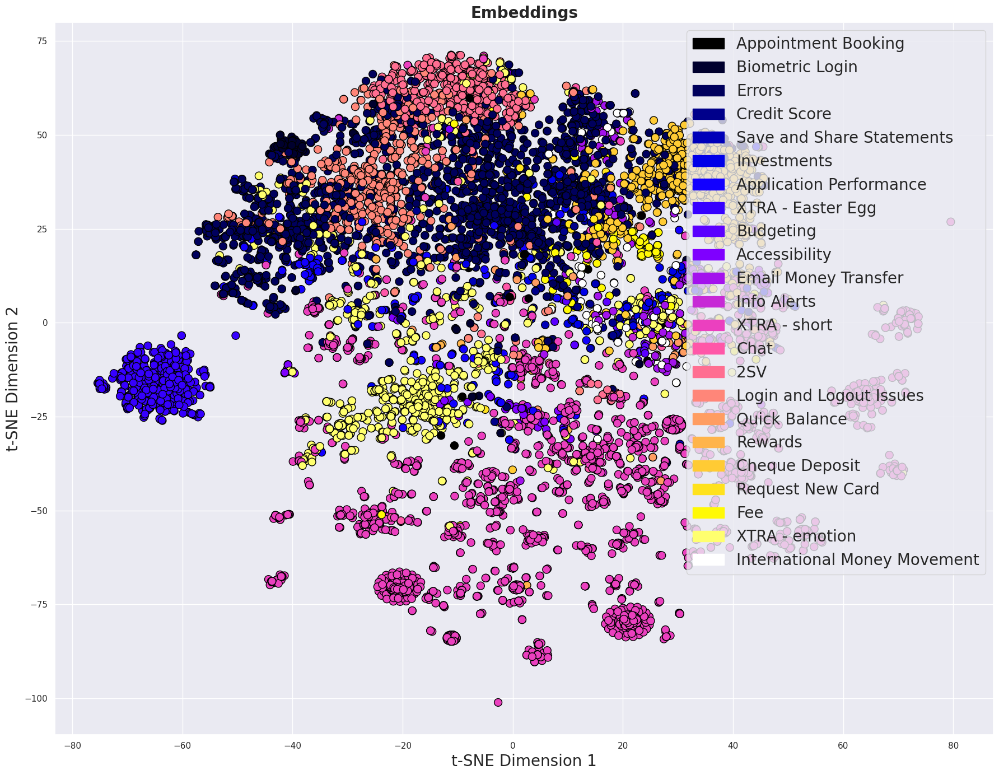

In [25]:
df2 = df2.sort_values(by='Review_ID', ascending=True) # original sorting, to match t-sne vectors

# this ordering of categories provides a nice color
categories = ["Appointment Booking", "Biometric Login", "Errors", "Credit Score", "Save and Share Statements", "Investments", "Application Performance", "XTRA - Easter Egg", "Budgeting", "Accessibility", "Email Money Transfer", "Info Alerts", "XTRA - short", "Chat", "2SV", "Login and Logout Issues", "Quick Balance", "Rewards", "Cheque Deposit", "Request New Card", "Fee", "XTRA - emotion", "International Money Movement"]

column_idx = df2.columns.get_loc('Suggested_Topic')

make_plot(df=df2, column_idx=column_idx, categories=categories)